Process the Adan Neighborhood data

## Data preprocessing

Load a month of monthly Neighborhood Patterns, then prepare data for IPF.

In [3]:
%load_ext autoreload
%autoreload 2
import os
import random
import sqlite3 
import numpy as np
import json
import math
from glob import glob
from tqdm.notebook import tqdm
from tqdm import tqdm
tqdm.pandas()

import calendar


import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

import Advan_operator as ad_op  

pd.set_option('display.max_columns', None)


# Create logger

In [4]:
import logging
import datetime

# Create a logger object
logger = logging.getLogger('hourly_population')
logger.setLevel(logging.DEBUG)  # Set the logging level

# Create a file handler to log messages to a file
today = datetime.datetime.now().strftime('%Y-%m-%d')
print("Today:", today)
file_handler = logging.FileHandler(f'log_output_{today}.log', mode='a')
file_handler.setLevel(logging.DEBUG)

# Create a stream handler to display logging output in Jupyter Lab
stream_handler = logging.StreamHandler()
stream_handler.setLevel(logging.DEBUG)

# Define a formatter and set it for both handlers
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
file_handler.setFormatter(formatter)
stream_handler.setFormatter(formatter)

# Add the handlers to the logger
logger.addHandler(file_handler)
logger.addHandler(stream_handler)

#  logging messages
logger.info("Started...")



2025-12-20 09:57:41,291 - hourly_population - INFO - Started...
2025-12-20 09:57:41,291 - hourly_population - INFO - Started...


Today: 2025-12-20


### Load monthly Neighborhood Patterns

#### Asign file locations

In [ ]:
import os
save_dir = os.path.join("..", "hourly_results")
os.makedirs(save_dir, exist_ok=True)

save_file = True
# save_file = False

data_dir = r'D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\data'    
monthly_parquet_dir = r'D:\Data\Advan\dewey-downloads\neighborhood-patterns_parquets'

ACS_file = os.path.join(data_dir, "cbg_acs_2019_county_tract_new20230929_cleaned.csv")
# home_panel_fname = os.path.join(data_dir, "home_panel_summary_2019_2023_restated_20240119.csv.gz")  ## large change!!!

# downloaded from Dewey on 2025-10-08
home_panel_fname = r'D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\data\neighborhood-patterns-us-home-panel-summary_2022.csv'

# see issues: https://community.deweydata.io/t/residing-device-count-in-2023-07-and-2023-08-surged-abnomorally/26675/15

CBG_2019_fname = os.path.join(data_dir, "blockgroups2019.zip") 

ACS_df =  pd.read_csv(ACS_file, dtype={"CENSUS_BLOCK_GROUP": str})[['fips', 'totalpopulation',  'tract_fips', 'county_fips', 'state_fips']]
ACS_df['fips'] = ACS_df['fips'].astype(str).str.zfill(12)
ACS_df['CBG_FIPS'] = ACS_df['fips'].str[:12]
ACS_df['tract_fips'] = ACS_df['tract_fips'].astype(str).str.zfill(11)
ACS_df['county_fips'] = ACS_df['county_fips'].astype(str).str.zfill(5)
ACS_df['state_fips'] = ACS_df['state_fips'].astype(str).str.zfill(2)
ACS_df = ACS_df.query('state_fips != "72"')
# print("ACS total population:", ACS_df['totalpopulation'].sum())
logger.info(f"data_dir: {data_dir}")
logger.info(f"monthly_parquet_dir: {monthly_parquet_dir}")
logger.info(f"ACS_file: {ACS_file}")
logger.info(f"home_panel_fname: {home_panel_fname}")
logger.info(f"CBG_2019_fname: {CBG_2019_fname}")
logger.info(f"ACS total population: {ACS_df['totalpopulation'].sum()}")
logger.info(f"ACS_df: \n{ACS_df.head()}")
ACS_df

2025-12-20 09:57:45,072 - hourly_population - INFO - data_dir: D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\data
2025-12-20 09:57:45,072 - hourly_population - INFO - data_dir: D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\data
2025-12-20 09:57:45,073 - hourly_population - INFO - monthly_parquet_dir: D:\Data\Advan\dewey-downloads\neighborhood-patterns_parquets
2025-12-20 09:57:45,073 - hourly_population - INFO - monthly_parquet_dir: D:\Data\Advan\dewey-downloads\neighborhood-patterns_parquets
2025-12-20 09:57:45,076 - hourly_population - INFO - ACS_file: D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\data\cbg_acs_2019_county_tract_new20230929_cleaned.csv
2025-12-20 09:57:45,076 - hourly_population - INFO - ACS_file: D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\data\cbg_acs_2019_county_tract_new20230929_cleaned.csv
2025-12-20 09:57:45,077 - hourly_population - INFO - home_panel_fname: D:\OneDrive_Emory\OneDr

,fips,totalpopulation,tract_fips,county_fips,state_fips,CBG_FIPS
0,010010201001,730,01001020100,01001,01,010010201001
1,010010201002,1263,01001020100,01001,01,010010201002
2,010010202001,835,01001020200,01001,01,010010202001
3,010010202002,1124,01001020200,01001,01,010010202002
4,010010203001,2774,01001020300,01001,01,010010203001
...,...,...,...,...,...,...
217734,560459511001,1450,56045951100,56045,56,560459511001
217735,560459511002,1844,56045951100,56045,56,560459511002
217736,560459513001,1314,56045951300,56045,56,560459513001
217737,560459513002,1164,56045951300,56045,56,560459513002


In [6]:
# CBG_2019_gdf = gpd.read_file(CBG_2019_fname).rename(columns={"GEOID": "fips"})
# CBG_2019_gdf

year = 2022
month = 12

hour_columns = pd.date_range(start=f"{year}-{month}-01", end=f"{year}-{month}-{calendar.monthrange(year, month)[1]} 23:59:59", freq="H") 

logger.info(f"hour_columns: {hour_columns}")

hour_columns

C:\tmp\ipykernel_30448\3651350710.py:7: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hour_columns = pd.date_range(start=f"{year}-{month}-01", end=f"{year}-{month}-{calendar.monthrange(year, month)[1]} 23:59:59", freq="H")
2025-12-20 09:58:06,540 - hourly_population - INFO - hour_columns: DatetimeIndex(['2022-12-01 00:00:00', '2022-12-01 01:00:00',
               '2022-12-01 02:00:00', '2022-12-01 03:00:00',
               '2022-12-01 04:00:00', '2022-12-01 05:00:00',
               '2022-12-01 06:00:00', '2022-12-01 07:00:00',
               '2022-12-01 08:00:00', '2022-12-01 09:00:00',
               ...
               '2022-12-31 14:00:00', '2022-12-31 15:00:00',
               '2022-12-31 16:00:00', '2022-12-31 17:00:00',
               '2022-12-31 18:00:00', '2022-12-31 19:00:00',
               '2022-12-31 20:00:00', '2022-12-31 21:00:00',
               '2022-12-31 22:00:00', '2022-12-31 23:00:00'],
              dtype='datet

DatetimeIndex(['2022-12-01 00:00:00', '2022-12-01 01:00:00',
               '2022-12-01 02:00:00', '2022-12-01 03:00:00',
               '2022-12-01 04:00:00', '2022-12-01 05:00:00',
               '2022-12-01 06:00:00', '2022-12-01 07:00:00',
               '2022-12-01 08:00:00', '2022-12-01 09:00:00',
               ...
               '2022-12-31 14:00:00', '2022-12-31 15:00:00',
               '2022-12-31 16:00:00', '2022-12-31 17:00:00',
               '2022-12-31 18:00:00', '2022-12-31 19:00:00',
               '2022-12-31 20:00:00', '2022-12-31 21:00:00',
               '2022-12-31 22:00:00', '2022-12-31 23:00:00'],
              dtype='datetime64[ns]', length=744, freq='h')

## Load the monthly visit scaling factor of each county

In [5]:
# load the monthly visit scaling factor of each county
refined_county_school_month_2022_fname = r"D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\hourly_results\refined_county_school_month_2022.csv"
county_visit_scaling_factor_month_df = pd.read_csv(refined_county_school_month_2022_fname, dtype={'county_fips': str, 'state_fips': str}).query("state_fips != '72'")
county_visit_scaling_factor_month_df['month'] = county_visit_scaling_factor_month_df['month'].astype(str).str.zfill(2)
county_visit_scaling_factor_month_df = county_visit_scaling_factor_month_df.query(f"month == '{month:02}'")
logger.info(f"refined_county_school_month_2022_fname: {refined_county_school_month_2022_fname}")
logger.info(f"county_visit_scaling_factor_month_df: {county_visit_scaling_factor_month_df.head()}")
county_visit_scaling_factor_month_df 

2025-12-16 10:55:00,823 - hourly_population - INFO - refined_county_school_month_2022_fname: D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\hourly_results\refined_county_school_month_2022.csv
2025-12-16 10:55:00,826 - hourly_population - INFO - county_visit_scaling_factor_month_df:    county_fips month  year  noon_visit_80quantile  raw_visitor_counts  \
11       01001    12  2022                 4756.0             13240.0   
23       01003    12  2022                20030.0             54043.0   
35       01005    12  2022                 1487.0              3130.0   
47       01007    12  2022                  602.0              1925.0   
59       01009    12  2022                 4019.0             13575.0   

    schoolday_count  visit_scaling_factor  school_count state_name  \
11             21.0                 2.784           4.0    Alabama   
23             50.0                 2.698           8.0    Alabama   
35             15.0                 2.105        

,county_fips,month,year,noon_visit_80quantile,raw_visitor_counts,schoolday_count,visit_scaling_factor,school_count,state_name,county_name,school_names,state_fips,state_raw_visitor_counts,state_noon_visit_80quantile,state_visit_scaling_factor
11,01001,12,2022,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204
23,01003,12,2022,20030.0,54043.0,50.0,2.698,8.0,Alabama,Baldwin,"Baldwin Co High Sch, Daphne High Sch, Elberta ...",01,817612.0,279506.0,2.925204
35,01005,12,2022,1487.0,3130.0,15.0,2.105,2.0,Alabama,Barbour,"Barbour Co High Sch, Eufaula High Sch",01,817612.0,279506.0,2.925204
47,01007,12,2022,602.0,1925.0,12.0,3.198,1.0,Alabama,Bibb,West Blocton High Sch,01,817612.0,279506.0,2.925204
59,01009,12,2022,4019.0,13575.0,26.0,3.378,8.0,Alabama,Blount,"Appalachian Sch, Cleveland High Sch, Hayden Hi...",01,817612.0,279506.0,2.925204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37655,56037,12,2022,1588.0,4426.0,7.0,2.787,2.0,Wyoming,Sweetwater,"Green River High School, Rock Springs High School",56,49553.0,19048.0,2.601480
37667,56039,12,2022,974.0,2117.0,15.0,2.174,1.0,Wyoming,Teton,Jackson Hole High School,56,49553.0,19048.0,2.601480
37679,56041,12,2022,1127.0,2752.0,7.0,2.442,1.0,Wyoming,Uinta,Evanston High School,56,49553.0,19048.0,2.601480
37691,56043,12,2022,160.0,410.0,NaN,2.562,NaN,NaN,NaN,NaN,56,49553.0,19048.0,2.601480


In [6]:
non_dict_columns = ['AREA', 
                    "STOPS_BY_DAY", 
                    "RAW_STOP_COUNTS", 
                    "RAW_DEVICE_COUNTS", 
                    "MEDIAN_DWELL", 
                    "STOPS_BY_EACH_HOUR",
                #    'adjusted_raw_stop',
                   ]

# month_dir = os.path.join(data_dir, str(year), f'{month:02}', '01')
no_dict_colum_fename = os.path.join(save_dir, f"NP_dict_column_{year}_{month:02}.csv")
device_home_areas_fname = os.path.join(save_dir, f"NP_split_device_home_areas_{year}_{month:02}.csv")
split_home_areas_parquet_dir = r'D:\Data\Advan\dewey-downloads\neighborhood-patterns_split_parquets'

adjusted_dwelling_time_stop_CBG_fname     = os.path.join(save_dir, f"adjusted_dwelling_time_stop_CBG_{year}_{month:02}.csv")
adjusted_dwelling_time_stop_national_fname = os.path.join(save_dir, f"adjusted_dwelling_time_stop_national_{year}_{month:02}.csv")
person_per_device_fname = os.path.join(save_dir, f"person_per_device_{year}_{month:02}.csv")
restored_CBG_hourly_vistor_count_fname = os.path.join(save_dir, f"restored_hourly_vistor_count_CBG_{year}_{month:02}.csv")
restored_target_hourly_vistor_count_fname = os.path.join(save_dir, f"restored_hourly_vistor_count_target_{year}_{month:02}.csv")
CBG_device_stop_destination_distribution_fname  = os.path.join(save_dir, f"CBG_device_stop_destination_distribution_{year}_{month:02}.csv")
CBG_device_stop_origin_distribution_fname = os.path.join(save_dir, f"CBG_device_stop_origin_distribution_{year}_{month:02}.csv")
IPF_results_fname = os.path.join(save_dir, f"IPF_origin_outgoer_hourly_{year}{month:02}.csv")
CBG_hourly_population_fname = os.path.join(save_dir, f"CBG_population_hourly_{year}{month:02}.csv")

CBG_origin_outbound_distribution_sampling_rate_fname = os.path.join(save_dir, f"CBG_origin_outbound_distribution_sampling_rate_{year}{month:02}.csv")
CBG_destination_inbound_per_device_fname = os.path.join(save_dir, f"CBG_destination_inbound_per_device_{year}{month:02}.csv")

CBG_destination_inbound_fname = os.path.join(save_dir, f"CBG_destination_inbound_{year}{month:02}.csv")
inbound_hourly_df_fname = os.path.join(save_dir, f"inbound_hourly_{year}{month:02}.csv")
CBG_agregated_inbound_fname =  os.path.join(save_dir, f"CBG_agregated_inbound_{year}{month:02}.csv")
hourly_agregated_inbound_fname =  os.path.join(save_dir, f"hourly_agregated_inbound_{year}{month:02}.csv")
no_dict_colum_fname = os.path.join(save_dir, f"NP_dict_column_{year}_{month:02}.csv")
 

# logger.info("Month directory: %s", month_dir)
logger.info("Save_dir directory: %s", save_dir)
logger.info("ACS_file: %s", ACS_file)
logger.info("home_panel file name: %s", home_panel_fname)

logger.info("No dict colum file name: %s", no_dict_colum_fname)
logger.info("Device home areas file name: %s", device_home_areas_fname)
logger.info("Device person_per_device file name: %s", person_per_device_fname)

logger.info("Device adjusted_dwelling_time_stop_CBG_fname: %s", adjusted_dwelling_time_stop_CBG_fname)
logger.info("Device adjusted_dwelling_time_stop_national_fname: %s", adjusted_dwelling_time_stop_national_fname)

logger.info(
    "Restored_hourly_vistor_count_CBG file name: %s",
    restored_CBG_hourly_vistor_count_fname,
)
logger.info(
    "Restored_hourly_vistor_count_target file name: %s",
    restored_target_hourly_vistor_count_fname,
)

logger.info(
    "CBG_device_stop_destination_distribution file name: %s",
    CBG_device_stop_destination_distribution_fname,
)
logger.info(
    "CBG_device_stop_origin_distribution file name: %s",
    CBG_device_stop_origin_distribution_fname,
)

logger.info("IPF_results file name: %s", IPF_results_fname)
logger.info("CBG hourly population file name: %s", CBG_hourly_population_fname)

logger.info(
    "CBG_origin_outbound_distribution_sampling_rate file name: %s",
    CBG_origin_outbound_distribution_sampling_rate_fname,
)


2025-12-16 10:55:00,870 - hourly_population - INFO - Save_dir directory: ..\hourly_results
2025-12-16 10:55:00,871 - hourly_population - INFO - ACS_file: D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\data\cbg_acs_2019_county_tract_new20230929_cleaned.csv
2025-12-16 10:55:00,871 - hourly_population - INFO - home_panel file name: D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\data\neighborhood-patterns-us-home-panel-summary_2022.csv
2025-12-16 10:55:00,872 - hourly_population - INFO - No dict colum file name: ..\hourly_results\NP_dict_column_2022_12.csv
2025-12-16 10:55:00,872 - hourly_population - INFO - Device home areas file name: ..\hourly_results\NP_split_device_home_areas_2022_12.csv
2025-12-16 10:55:00,873 - hourly_population - INFO - Device person_per_device file name: ..\hourly_results\person_per_device_2022_12.csv
2025-12-16 10:55:00,873 - hourly_population - INFO - Device adjusted_dwelling_time_stop_CBG_fname: ..\hourly_results\adjusted_d

## Load monthly neighborhood patterns

In [7]:
import duckdb


use_cols =  ["Y", "M", "AREA", 
             "DEVICE_HOME_AREAS",
            # "STOPS_BY_DAY", 
            "RAW_STOP_COUNTS", 
            "RAW_DEVICE_COUNTS", 
            "MEDIAN_DWELL", 
            "STOPS_BY_EACH_HOUR"]
# month_df = ad_op.load_neighborhood_monthly_folder(folder=month_dir, extions=['gz'], start_str="N", use_cols=use_cols, verbose=True)
 
logger.info(f"Loading monthly data ({year}-{month:02}) using duckdb...")
month_df = ad_op.load_neighborhood_monthly_folder_by_duckdb(monthly_parquet_dir=monthly_parquet_dir, year=year, month=month, use_cols=use_cols)
month_df['county_fips'] = month_df['AREA'].str[:5]

# merge the county visit scaling factor
logger.info(f"Merging county visit scaling factor for {year}-{month:02}...")
month_df = month_df.merge(county_visit_scaling_factor_month_df.query(f"month == '{month:02}'  and year == {year}"), on=[ 'county_fips'], how='left')
# clean str like this:
# "{\"010010205002\":122...}"
# needs about 20 seconds to process
logger.info(f"month_df shape: {month_df.shape}")
logger.info(f"month_df head: \n{month_df.head()}")
month_df

2025-12-16 10:55:00,900 - hourly_population - INFO - Loading monthly data (2022-12) using duckdb...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

processing field:  DEVICE_HOME_AREAS


2025-12-16 10:55:26,683 - hourly_population - INFO - Merging county visit scaling factor for 2022-12...
2025-12-16 10:55:26,831 - hourly_population - INFO - month_df shape: (220685, 23)
2025-12-16 10:55:26,837 - hourly_population - INFO - month_df head: 
      Y   M          AREA                                  DEVICE_HOME_AREAS  \
0  2022  12  010010201001  {'010010205002': 246, '010010208022': 222, '01...   
1  2022  12  010010201002  {'010010201002': 186, '010010205002': 60, '010...   
2  2022  12  010010202001  {'010010205002': 146, '010010208022': 133, '01...   
3  2022  12  010010202002  {'010010205002': 550, '010010208022': 338, '01...   
4  2022  12  010010203001  {'010010203001': 331, '010010205002': 190, '01...   

   RAW_STOP_COUNTS  RAW_DEVICE_COUNTS  MEDIAN_DWELL  \
0            17045               4880     14.416667   
1             9879               1271    215.000000   
2            12588               2092     35.083333   
3            57665              12051      6

,Y,M,AREA,DEVICE_HOME_AREAS,RAW_STOP_COUNTS,RAW_DEVICE_COUNTS,MEDIAN_DWELL,STOPS_BY_EACH_HOUR,county_fips,month,year,noon_visit_80quantile,raw_visitor_counts,schoolday_count,visit_scaling_factor,school_count,state_name,county_name,school_names,state_fips,state_raw_visitor_counts,state_noon_visit_80quantile,state_visit_scaling_factor
0,2022,12,010010201001,"{'010010205002': 246, '010010208022': 222, '01...",17045,4880,14.416667,"[2,1,0,0,2,3,19,58,24,12,21,24,17,26,45,69,41,...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204
1,2022,12,010010201002,"{'010010201002': 186, '010010205002': 60, '010...",9879,1271,215.000000,"[7,1,0,1,1,1,3,11,9,6,5,19,14,19,21,51,27,46,2...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204
2,2022,12,010010202001,"{'010010205002': 146, '010010208022': 133, '01...",12588,2092,35.083333,"[4,1,0,0,3,2,17,184,25,22,30,18,29,23,31,162,8...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204
3,2022,12,010010202002,"{'010010205002': 550, '010010208022': 338, '01...",57665,12051,6.700000,"[3,0,2,0,4,9,27,237,152,80,86,132,122,106,158,...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204
4,2022,12,010010203001,"{'010010203001': 331, '010010205002': 190, '01...",23236,3398,133.916667,"[6,0,0,2,1,2,16,80,20,20,15,25,28,42,43,134,76...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220680,2022,12,780309611001,"{'780309611001': 192, '780309611002': 188, '78...",22292,4641,22.583333,"[4,2,2,1,2,1,11,62,47,42,56,50,60,56,37,64,63,...",78030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
220681,2022,12,780309611002,"{'780309611002': 205, '780309611001': 150, '78...",11850,2089,10.133333,"[6,1,1,0,1,2,3,28,21,18,19,22,18,17,24,38,23,3...",78030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
220682,2022,12,780309612001,"{'780309611002': 54, '780309608001': 44, '7803...",3183,453,86.016667,"[2,0,1,1,0,0,2,4,10,6,6,0,2,6,8,13,8,10,11,8,4...",78030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
220683,2022,12,780309612002,"{'780309611002': 132, '780309611001': 124, '78...",11274,3241,10.216667,"[3,3,3,3,4,3,3,22,26,14,27,17,21,21,31,33,18,2...",78030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
info_str = f"Before visit scaling, {year}-{month:02} RAW_DEVICE_COUNTS (billion): {month_df['RAW_DEVICE_COUNTS'].sum() / 10**9}"
logger.info(info_str)
info_str = f"Reference number of RAW_DEVICE_COUNTS: 0.4 - 0.8 billion in 2022 (2025.12.15)."
logger.info(info_str)

# info_str = f"Before visit scaling, RAW_STOP_COUNTS (billion): {month_df['RAW_STOP_COUNTS'].sum() / 10**9}"
# logger.info(info_str)  # 2025.12.14: sometimes betwen 11 bi for 2022-10! NOT SURE WHY!! ANSWER: mistakenly mutiplied by the scaling factor !

2025-12-16 10:55:26,885 - hourly_population - INFO - Before visit scaling, 2022-12 RAW_DEVICE_COUNTS (billion): 0.785045396
2025-12-16 10:55:26,886 - hourly_population - INFO - Reference number of RAW_DEVICE_COUNTS: 0.4 - 0.8 billion in 2022 (2025.12.15).


## Check the total of the hourly stops

Usually are 98.9% of the sum of STOPS_BY_EACH_HOUR column

Become 100% in 2025.7

In [9]:
print("year, month:", year, month)

year, month: 2022 12


In [10]:
def _get_total_hourly_stop(row):
    # print(row)
    hourly_stop = json.loads(row['STOPS_BY_EACH_HOUR'])  # .replace('\"', '')
    total_stop = sum(hourly_stop)
    return total_stop

# need about 10 seconds
 
month_df['total_hourly_stop'] = month_df.iloc[:].apply(_get_total_hourly_stop, axis=1)
ratio = month_df['total_hourly_stop'].sum() / month_df['RAW_STOP_COUNTS'].sum()

print()

info_str = f"Ratio: total_hourly_stop / RAW_STOP_COUNTS =  {ratio}"
logger.info(info_str)
info_str = f"This ratio should be close to 1.0."
logger.info(info_str)
month_df
# the total_hourly_stop is smaller than the RAW_STOP_COUNTS (98.9%), 2025.12, found most are 1.0, had one time 0.35 and 0.12, may be after running the other cells and run this cell again.

2025-12-16 10:55:36,746 - hourly_population - INFO - Ratio: total_hourly_stop / RAW_STOP_COUNTS =  1.0
2025-12-16 10:55:36,748 - hourly_population - INFO - This ratio should be close to 1.0.


,Y,M,AREA,DEVICE_HOME_AREAS,RAW_STOP_COUNTS,RAW_DEVICE_COUNTS,MEDIAN_DWELL,STOPS_BY_EACH_HOUR,county_fips,month,year,noon_visit_80quantile,raw_visitor_counts,schoolday_count,visit_scaling_factor,school_count,state_name,county_name,school_names,state_fips,state_raw_visitor_counts,state_noon_visit_80quantile,state_visit_scaling_factor,total_hourly_stop
0,2022,12,010010201001,"{'010010205002': 246, '010010208022': 222, '01...",17045,4880,14.416667,"[2,1,0,0,2,3,19,58,24,12,21,24,17,26,45,69,41,...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204,17045
1,2022,12,010010201002,"{'010010201002': 186, '010010205002': 60, '010...",9879,1271,215.000000,"[7,1,0,1,1,1,3,11,9,6,5,19,14,19,21,51,27,46,2...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204,9879
2,2022,12,010010202001,"{'010010205002': 146, '010010208022': 133, '01...",12588,2092,35.083333,"[4,1,0,0,3,2,17,184,25,22,30,18,29,23,31,162,8...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204,12588
3,2022,12,010010202002,"{'010010205002': 550, '010010208022': 338, '01...",57665,12051,6.700000,"[3,0,2,0,4,9,27,237,152,80,86,132,122,106,158,...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204,57665
4,2022,12,010010203001,"{'010010203001': 331, '010010205002': 190, '01...",23236,3398,133.916667,"[6,0,0,2,1,2,16,80,20,20,15,25,28,42,43,134,76...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204,23236
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220680,2022,12,780309611001,"{'780309611001': 192, '780309611002': 188, '78...",22292,4641,22.583333,"[4,2,2,1,2,1,11,62,47,42,56,50,60,56,37,64,63,...",78030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22292
220681,2022,12,780309611002,"{'780309611002': 205, '780309611001': 150, '78...",11850,2089,10.133333,"[6,1,1,0,1,2,3,28,21,18,19,22,18,17,24,38,23,3...",78030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11850
220682,2022,12,780309612001,"{'780309611002': 54, '780309608001': 44, '7803...",3183,453,86.016667,"[2,0,1,1,0,0,2,4,10,6,6,0,2,6,8,13,8,10,11,8,4...",78030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3183
220683,2022,12,780309612002,"{'780309611002': 132, '780309611001': 124, '78...",11274,3241,10.216667,"[3,3,3,3,4,3,3,22,26,14,27,17,21,21,31,33,18,2...",78030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11274


# Adjust the RAW_STOP_COUNTS by dwellling_time

If a stop dwelling > 60 minutes, we add a stop to the next hours. Not sure whether contradict with the Dewey documentation.

In [11]:
# non_adjusted_dwell_time_stop_CBG_arr = ad_op.adjust_stop_by_dwelling_time(np_df=month_df.iloc[:], adjust_dwell_time=False, clean_negative=True)
info_str = f"sum of non_adjusted_dwell_time_stop_CBG_arr (billion): { month_df['RAW_STOP_COUNTS'].sum()/10**9}"
logger.info(info_str)
info_str = f"Reference number of sum of non_adjusted_dwell_time_stop_CBG_arr: 2 - 4 billion in 2022 (2025.12.15)."
logger.info(info_str)
# info_str = f"shape of non_adjusted_dwell_time_stop_CBG_arr: {non_adjusted_dwell_time_stop_CBG_arr.shape}"
# logger.info(info_str)

adjusted_dwell_time_stop_CBG_arr = ad_op.adjust_stop_by_dwelling_time(np_df=month_df.iloc[:], adjust_dwell_time=True, clean_negative=True)

adjusted_dwell_time_stop_national_arr = adjusted_dwell_time_stop_CBG_arr.sum(axis=0)

month_df['adjusted_raw_stop'] = adjusted_dwell_time_stop_CBG_arr.sum(axis=1)
month_df[['adjusted_raw_stop', 'RAW_STOP_COUNTS']].sum() / 10**9

info_str = f"sum of adjusted_dwell_time_stop_CBG_arr (billion): {adjusted_dwell_time_stop_CBG_arr.sum().sum()/10**9}"
logger.info(info_str)
info_str = f"Reference increasement: about 30% in 2022 (2025.12.15)."
logger.info(info_str)
info_str = f"sum of adjusted_dwell_time_stop_national_arr (billion): {adjusted_dwell_time_stop_national_arr.sum().sum()/10**9}"
logger.info(info_str)
info_str = f"shape of adjusted_dwell_time_stop_CBG_arr (CBG * hour_cnt): {adjusted_dwell_time_stop_CBG_arr.shape}"
logger.info(info_str)

# need about 1 minutes
month_df

2025-12-16 10:55:36,820 - hourly_population - INFO - sum of non_adjusted_dwell_time_stop_CBG_arr (billion): 3.775579053
2025-12-16 10:55:36,821 - hourly_population - INFO - Reference number of sum of non_adjusted_dwell_time_stop_CBG_arr: 2 - 4 billion in 2022 (2025.12.15).


Stop factor:  1


2025-12-16 10:55:58,547 - hourly_population - INFO - sum of adjusted_dwell_time_stop_CBG_arr (billion): 4.931611842
2025-12-16 10:55:58,549 - hourly_population - INFO - Reference increasement: about 30% in 2022 (2025.12.15).
2025-12-16 10:55:58,550 - hourly_population - INFO - sum of adjusted_dwell_time_stop_national_arr (billion): 4.931611842
2025-12-16 10:55:58,552 - hourly_population - INFO - shape of adjusted_dwell_time_stop_CBG_arr (CBG * hour_cnt): (220685, 744)


,Y,M,AREA,DEVICE_HOME_AREAS,RAW_STOP_COUNTS,RAW_DEVICE_COUNTS,MEDIAN_DWELL,STOPS_BY_EACH_HOUR,county_fips,month,year,noon_visit_80quantile,raw_visitor_counts,schoolday_count,visit_scaling_factor,school_count,state_name,county_name,school_names,state_fips,state_raw_visitor_counts,state_noon_visit_80quantile,state_visit_scaling_factor,total_hourly_stop,adjusted_raw_stop
0,2022,12,010010201001,"{'010010205002': 246, '010010208022': 222, '01...",17045,4880,14.416667,"[2,1,0,0,2,3,19,58,24,12,21,24,17,26,45,69,41,...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204,17045,17045
1,2022,12,010010201002,"{'010010201002': 186, '010010205002': 60, '010...",9879,1271,215.000000,"[7,1,0,1,1,1,3,11,9,6,5,19,14,19,21,51,27,46,2...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204,9879,39516
2,2022,12,010010202001,"{'010010205002': 146, '010010208022': 133, '01...",12588,2092,35.083333,"[4,1,0,0,3,2,17,184,25,22,30,18,29,23,31,162,8...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204,12588,12588
3,2022,12,010010202002,"{'010010205002': 550, '010010208022': 338, '01...",57665,12051,6.700000,"[3,0,2,0,4,9,27,237,152,80,86,132,122,106,158,...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204,57665,57665
4,2022,12,010010203001,"{'010010203001': 331, '010010205002': 190, '01...",23236,3398,133.916667,"[6,0,0,2,1,2,16,80,20,20,15,25,28,42,43,134,76...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204,23236,69708
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220680,2022,12,780309611001,"{'780309611001': 192, '780309611002': 188, '78...",22292,4641,22.583333,"[4,2,2,1,2,1,11,62,47,42,56,50,60,56,37,64,63,...",78030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22292,22292
220681,2022,12,780309611002,"{'780309611002': 205, '780309611001': 150, '78...",11850,2089,10.133333,"[6,1,1,0,1,2,3,28,21,18,19,22,18,17,24,38,23,3...",78030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11850,11850
220682,2022,12,780309612001,"{'780309611002': 54, '780309608001': 44, '7803...",3183,453,86.016667,"[2,0,1,1,0,0,2,4,10,6,6,0,2,6,8,13,8,10,11,8,4...",78030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3183,6366
220683,2022,12,780309612002,"{'780309611002': 132, '780309611001': 124, '78...",11274,3241,10.216667,"[3,3,3,3,4,3,3,22,26,14,27,17,21,21,31,33,18,2...",78030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11274,11274


###　Save adjusted  RAW_STOP_COUNTS 

Findings:
1. 2025.07 version neighorhood patterns data have the same result as 2024 version for peroid 2022.1, 2022.3, 2022.5, 2022.6, 07, 08, 09, 10, 11, but not 2022.2, 2022.4, 2022.12

Redo all months

In [12]:
# generate hourly time stamp for this month
# hourly_time_stamp = pd.date_range(start=f"{year}-{month:02}-01", end=f"{year}-{month:02}-{calendar.monthrange(year, month)[1]} 23:59:59", freq='H')
# hourly_time_stamp

In [13]:
# convert numpy array to Pandas DataFrame
# CBG level
# hourly_columns = [f'hour_{h+1}' for h in range(adjusted_dwell_time_stop_CBG_arr.shape[1])]
hourly_columns = pd.date_range(start=f"{year}-{month:02}-01", end=f"{year}-{month:02}-{calendar.monthrange(year, month)[1]} 23:59:59", freq='H')
assert len(hourly_columns) == adjusted_dwell_time_stop_CBG_arr.shape[1], "hourly_columns and adjusted_dwell_time_stop_CBG_arr.shape[1] do not match"
adjusted_dwelling_time_stop_CBG_df = pd.DataFrame(adjusted_dwell_time_stop_CBG_arr, columns=hourly_columns)
adjusted_dwelling_time_stop_CBG_df['CBG'] = month_df['AREA'].astype(str).str.zfill(12).to_list()
# adjusted_dwelling_time_stop_CBG_df = adjusted_dwelling_time_stop_CBG_df[['CBG'] + hourly_columns]  # reorder columns
# adjusted_dwelling_time_stop_CBG_df = adjusted_dwelling_time_stop_CBG_df.sort_values('CBG')
adjusted_dwelling_time_stop_CBG_df.set_index('CBG', inplace=True)
# national level
adjusted_dwelling_time_stop_national_df = pd.DataFrame(adjusted_dwell_time_stop_national_arr, columns=['stop'])
info_str = f"adjusted_dwelling_time_stop_CBG_df shape: {adjusted_dwelling_time_stop_CBG_df.shape}"
logger.info(info_str)
info_str = f"adjusted_dwelling_time_stop_CBG_df.iloc[:5, :5]: \n{adjusted_dwelling_time_stop_CBG_df.iloc[:5, :5]}"
logger.info(info_str)
adjusted_dwelling_time_stop_CBG_df

C:\tmp\ipykernel_32740\1303393448.py:4: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hourly_columns = pd.date_range(start=f"{year}-{month:02}-01", end=f"{year}-{month:02}-{calendar.monthrange(year, month)[1]} 23:59:59", freq='H')
2025-12-16 10:55:58,739 - hourly_population - INFO - adjusted_dwelling_time_stop_CBG_df shape: (220685, 744)
2025-12-16 10:55:58,742 - hourly_population - INFO - adjusted_dwelling_time_stop_CBG_df.iloc[:5, :5]: 
              2022-12-01 00:00:00  2022-12-01 01:00:00  2022-12-01 02:00:00  \
CBG                                                                           
010010201001                    2                    1                    0   
010010201002                   42                   28                   15   
010010202001                    4                    1                    0   
010010202002                    3                    0                    2   
010010203001                 

,2022-12-01 00:00:00,2022-12-01 01:00:00,2022-12-01 02:00:00,2022-12-01 03:00:00,2022-12-01 04:00:00,2022-12-01 05:00:00,2022-12-01 06:00:00,2022-12-01 07:00:00,2022-12-01 08:00:00,2022-12-01 09:00:00,2022-12-01 10:00:00,2022-12-01 11:00:00,2022-12-01 12:00:00,2022-12-01 13:00:00,2022-12-01 14:00:00,2022-12-01 15:00:00,2022-12-01 16:00:00,2022-12-01 17:00:00,2022-12-01 18:00:00,2022-12-01 19:00:00,2022-12-01 20:00:00,2022-12-01 21:00:00,2022-12-01 22:00:00,2022-12-01 23:00:00,2022-12-02 00:00:00,2022-12-02 01:00:00,2022-12-02 02:00:00,2022-12-02 03:00:00,2022-12-02 04:00:00,2022-12-02 05:00:00,2022-12-02 06:00:00,2022-12-02 07:00:00,2022-12-02 08:00:00,2022-12-02 09:00:00,2022-12-02 10:00:00,2022-12-02 11:00:00,2022-12-02 12:00:00,2022-12-02 13:00:00,2022-12-02 14:00:00,2022-12-02 15:00:00,2022-12-02 16:00:00,2022-12-02 17:00:00,2022-12-02 18:00:00,2022-12-02 19:00:00,2022-12-02 20:00:00,2022-12-02 21:00:00,2022-12-02 22:00:00,2022-12-02 23:00:00,2022-12-03 00:00:00,2022-12-03 01:00:00,2022-12-03 02:00:00,2022-12-03 03:00:00,2022-12-03 04:00:00,2022-12-03 05:00:00,2022-12-03 06:00:00,2022-12-03 07:00:00,2022-12-03 08:00:00,2022-12-03 09:00:00,2022-12-03 10:00:00,2022-12-03 11:00:00,2022-12-03 12:00:00,2022-12-03 13:00:00,2022-12-03 14:00:00,2022-12-03 15:00:00,2022-12-03 16:00:00,2022-12-03 17:00:00,2022-12-03 18:00:00,2022-12-03 19:00:00,2022-12-03 20:00:00,2022-12-03 21:00:00,2022-12-03 22:00:00,2022-12-03 23:00:00,2022-12-04 00:00:00,2022-12-04 01:00:00,2022-12-04 02:00:00,2022-12-04 03:00:00,2022-12-04 04:00:00,2022-12-04 05:00:00,2022-12-04 06:00:00,2022-12-04 07:00:00,2022-12-04 08:00:00,2022-12-04 09:00:00,2022-12-04 10:00:00,2022-12-04 11:00:00,2022-12-04 12:00:00,2022-12-04 13:00:00,2022-12-04 14:00:00,2022-12-04 15:00:00,2022-12-04 16:00:00,2022-12-04 17:00:00,2022-12-04 18:00:00,2022-12-04 19:00:00,2022-12-04 20:00:00,2022-12-04 21:00:00,2022-12-04 22:00:00,2022-12-04 23:00:00,2022-12-05 00:00:00,2022-12-05 01:00:00,2022-12-05 02:00:00,2022-12-05 03:00:00,2022-12-05 04:00:00,2022-12-05 05:00:00,2022-12-05 06:00:00,2022-12-05 07:00:00,2022-12-05 08:00:00,2022-12-05 09:00:00,2022-12-05 10:00:00,2022-12-05 11:00:00,2022-12-05 12:00:00,2022-12-05 13:00:00,2022-12-05 14:00:00,2022-12-05 15:00:00,2022-12-05 16:00:00,2022-12-05 17:00:00,2022-12-05 18:00:00,2022-12-05 19:00:00,2022-12-05 20:00:00,2022-12-05 21:00:00,2022-12-05 22:00:00,2022-12-05 23:00:00,2022-12-06 00:00:00,2022-12-06 01:00:00,2022-12-06 02:00:00,2022-12-06 03:00:00,2022-12-06 04:00:00,2022-12-06 05:00:00,2022-12-06 06:00:00,2022-12-06 07:00:00,2022-12-06 08:00:00,2022-12-06 09:00:00,2022-12-06 10:00:00,2022-12-06 11:00:00,2022-12-06 12:00:00,2022-12-06 13:00:00,2022-12-06 14:00:00,2022-12-06 15:00:00,2022-12-06 16:00:00,2022-12-06 17:00:00,2022-12-06 18:00:00,2022-12-06 19:00:00,2022-12-06 20:00:00,2022-12-06 21:00:00,2022-12-06 22:00:00,2022-12-06 23:00:00,2022-12-07 00:00:00,2022-12-07 01:00:00,2022-12-07 02:00:00,2022-12-07 03:00:00,2022-12-07 04:00:00,2022-12-07 05:00:00,2022-12-07 06:00:00,2022-12-07 07:00:00,2022-12-07 08:00:00,2022-12-07 09:00:00,2022-12-07 10:00:00,2022-12-07 11:00:00,2022-12-07 12:00:00,2022-12-07 13:00:00,2022-12-07 14:00:00,2022-12-07 15:00:00,2022-12-07 16:00:00,2022-12-07 17:00:00,2022-12-07 18:00:00,2022-12-07 19:00:00,2022-12-07 20:00:00,2022-12-07 21:00:00,2022-12-07 22:00:00,2022-12-07 23:00:00,2022-12-08 00:00:00,2022-12-08 01:00:00,2022-12-08 02:00:00,2022-12-08 03:00:00,2022-12-08 04:00:00,2022-12-08 05:00:00,2022-12-08 06:00:00,2022-12-08 07:00:00,2022-12-08 08:00:00,2022-12-08 09:00:00,2022-12-08 10:00:00,2022-12-08 11:00:00,2022-12-08 12:00:00,2022-12-08 13:00:00,2022-12-08 14:00:00,2022-12-08 15:00:00,2022-12-08 16:00:00,2022-12-08 17:00:00,2022-12-08 18:00:00,2022-12-08 19:00:00,2022-12-08 20:00:00,2022-12-08 21:00:00,2022-12-08 22:00:00,2022-12-08 23:00:00,2022-12-09 00:00:00,2022-12-09 01:00:00,2022-12-09 02:00:00,2022-12-09 03:00:00,2022-12-09 04:00:00,2022-12-09 05:00:00,2022-12-09 06:00:00,2022-12-09 07:00:00

In [14]:
adjusted_dwelling_time_stop_national_df['stop'].sum() / 10**9

np.float64(4.931611842)

In [15]:
# Save CSV files
if save_file:
    adjusted_dwelling_time_stop_national_df.to_csv(adjusted_dwelling_time_stop_national_fname, index=False)
    print("Saved national hourly stop at:", adjusted_dwelling_time_stop_national_fname)

    adjusted_dwelling_time_stop_CBG_df.to_csv(adjusted_dwelling_time_stop_CBG_fname, index=False)
    print("Saved CBG hourly stop at:", adjusted_dwelling_time_stop_CBG_fname)

# needs about 20 seconds

Saved national hourly stop at: ..\hourly_results\adjusted_dwelling_time_stop_national_2022_12.csv
Saved CBG hourly stop at: ..\hourly_results\adjusted_dwelling_time_stop_CBG_2022_12.csv


In [16]:
adjusted_dwelling_time_stop_national_df
adjusted_dwelling_time_stop_CBG_df

,2022-12-01 00:00:00,2022-12-01 01:00:00,2022-12-01 02:00:00,2022-12-01 03:00:00,2022-12-01 04:00:00,2022-12-01 05:00:00,2022-12-01 06:00:00,2022-12-01 07:00:00,2022-12-01 08:00:00,2022-12-01 09:00:00,2022-12-01 10:00:00,2022-12-01 11:00:00,2022-12-01 12:00:00,2022-12-01 13:00:00,2022-12-01 14:00:00,2022-12-01 15:00:00,2022-12-01 16:00:00,2022-12-01 17:00:00,2022-12-01 18:00:00,2022-12-01 19:00:00,2022-12-01 20:00:00,2022-12-01 21:00:00,2022-12-01 22:00:00,2022-12-01 23:00:00,2022-12-02 00:00:00,2022-12-02 01:00:00,2022-12-02 02:00:00,2022-12-02 03:00:00,2022-12-02 04:00:00,2022-12-02 05:00:00,2022-12-02 06:00:00,2022-12-02 07:00:00,2022-12-02 08:00:00,2022-12-02 09:00:00,2022-12-02 10:00:00,2022-12-02 11:00:00,2022-12-02 12:00:00,2022-12-02 13:00:00,2022-12-02 14:00:00,2022-12-02 15:00:00,2022-12-02 16:00:00,2022-12-02 17:00:00,2022-12-02 18:00:00,2022-12-02 19:00:00,2022-12-02 20:00:00,2022-12-02 21:00:00,2022-12-02 22:00:00,2022-12-02 23:00:00,2022-12-03 00:00:00,2022-12-03 01:00:00,2022-12-03 02:00:00,2022-12-03 03:00:00,2022-12-03 04:00:00,2022-12-03 05:00:00,2022-12-03 06:00:00,2022-12-03 07:00:00,2022-12-03 08:00:00,2022-12-03 09:00:00,2022-12-03 10:00:00,2022-12-03 11:00:00,2022-12-03 12:00:00,2022-12-03 13:00:00,2022-12-03 14:00:00,2022-12-03 15:00:00,2022-12-03 16:00:00,2022-12-03 17:00:00,2022-12-03 18:00:00,2022-12-03 19:00:00,2022-12-03 20:00:00,2022-12-03 21:00:00,2022-12-03 22:00:00,2022-12-03 23:00:00,2022-12-04 00:00:00,2022-12-04 01:00:00,2022-12-04 02:00:00,2022-12-04 03:00:00,2022-12-04 04:00:00,2022-12-04 05:00:00,2022-12-04 06:00:00,2022-12-04 07:00:00,2022-12-04 08:00:00,2022-12-04 09:00:00,2022-12-04 10:00:00,2022-12-04 11:00:00,2022-12-04 12:00:00,2022-12-04 13:00:00,2022-12-04 14:00:00,2022-12-04 15:00:00,2022-12-04 16:00:00,2022-12-04 17:00:00,2022-12-04 18:00:00,2022-12-04 19:00:00,2022-12-04 20:00:00,2022-12-04 21:00:00,2022-12-04 22:00:00,2022-12-04 23:00:00,2022-12-05 00:00:00,2022-12-05 01:00:00,2022-12-05 02:00:00,2022-12-05 03:00:00,2022-12-05 04:00:00,2022-12-05 05:00:00,2022-12-05 06:00:00,2022-12-05 07:00:00,2022-12-05 08:00:00,2022-12-05 09:00:00,2022-12-05 10:00:00,2022-12-05 11:00:00,2022-12-05 12:00:00,2022-12-05 13:00:00,2022-12-05 14:00:00,2022-12-05 15:00:00,2022-12-05 16:00:00,2022-12-05 17:00:00,2022-12-05 18:00:00,2022-12-05 19:00:00,2022-12-05 20:00:00,2022-12-05 21:00:00,2022-12-05 22:00:00,2022-12-05 23:00:00,2022-12-06 00:00:00,2022-12-06 01:00:00,2022-12-06 02:00:00,2022-12-06 03:00:00,2022-12-06 04:00:00,2022-12-06 05:00:00,2022-12-06 06:00:00,2022-12-06 07:00:00,2022-12-06 08:00:00,2022-12-06 09:00:00,2022-12-06 10:00:00,2022-12-06 11:00:00,2022-12-06 12:00:00,2022-12-06 13:00:00,2022-12-06 14:00:00,2022-12-06 15:00:00,2022-12-06 16:00:00,2022-12-06 17:00:00,2022-12-06 18:00:00,2022-12-06 19:00:00,2022-12-06 20:00:00,2022-12-06 21:00:00,2022-12-06 22:00:00,2022-12-06 23:00:00,2022-12-07 00:00:00,2022-12-07 01:00:00,2022-12-07 02:00:00,2022-12-07 03:00:00,2022-12-07 04:00:00,2022-12-07 05:00:00,2022-12-07 06:00:00,2022-12-07 07:00:00,2022-12-07 08:00:00,2022-12-07 09:00:00,2022-12-07 10:00:00,2022-12-07 11:00:00,2022-12-07 12:00:00,2022-12-07 13:00:00,2022-12-07 14:00:00,2022-12-07 15:00:00,2022-12-07 16:00:00,2022-12-07 17:00:00,2022-12-07 18:00:00,2022-12-07 19:00:00,2022-12-07 20:00:00,2022-12-07 21:00:00,2022-12-07 22:00:00,2022-12-07 23:00:00,2022-12-08 00:00:00,2022-12-08 01:00:00,2022-12-08 02:00:00,2022-12-08 03:00:00,2022-12-08 04:00:00,2022-12-08 05:00:00,2022-12-08 06:00:00,2022-12-08 07:00:00,2022-12-08 08:00:00,2022-12-08 09:00:00,2022-12-08 10:00:00,2022-12-08 11:00:00,2022-12-08 12:00:00,2022-12-08 13:00:00,2022-12-08 14:00:00,2022-12-08 15:00:00,2022-12-08 16:00:00,2022-12-08 17:00:00,2022-12-08 18:00:00,2022-12-08 19:00:00,2022-12-08 20:00:00,2022-12-08 21:00:00,2022-12-08 22:00:00,2022-12-08 23:00:00,2022-12-09 00:00:00,2022-12-09 01:00:00,2022-12-09 02:00:00,2022-12-09 03:00:00,2022-12-09 04:00:00,2022-12-09 05:00:00,2022-12-09 06:00:00,2022-12-09 07:00:00

In [17]:
adjusted_dwelling_time_stop_national_df['stop'].sum() /  10**9, adjusted_dwelling_time_stop_CBG_df.iloc[:, 1:].sum().sum() /  10**9
# should be the same

(np.float64(4.931611842), np.float64(4.929396573))

RAW_STOP_COUNTS is large than the sum(stop) in "DEVICE_HOME_AREAS", result_df['stop'].sum() / result_df['RAW_STOP_COUNTS'].sum() = 85%
Above not found in Dec. 2025.

The DEVICE_HOME_AREAS column report less CBGs # thant the RAW_STOP_COUNTS column.
home_areas['device'].sum() / month_df['RAW_STOP_COUNTS'].sum() = 92% for Dec. 2022

### verify the relationship between raw_device_count and the sum of home areas.

In [18]:
# ============parquet data name format ===========
# split_home_areas_parquet_dir = r'D:\Data\Advan\dewey-downloads\neighborhood-patterns_split_parquets'
# 2022_01_DEVICE_HOME_AREAS.parquet
# 2022_01_WEEKDAY_DEVICE_HOME_AREAS.parquet
# 2022_01_WEEKEND_DEVICE_HOME_AREAS.parquet
# columns: 'origin', 'destination', 'device'

## test some months
# month = 10 
# print("Loading month:", month)
# month_df = ad_op.load_neighborhood_monthly_folder_by_duckdb(monthly_parquet_dir=monthly_parquet_dir, year=year, month=month, use_cols=['RAW_DEVICE_COUNTS'])

# con = duckdb.connect()
# ##  create a view for parquet files in the folder
# filed = 'DEVICE_HOME_AREAS'
# con.execute(f"""
#     CREATE OR REPLACE VIEW device_home_areas AS
#     SELECT device FROM read_parquet('{split_home_areas_parquet_dir}/{year}_{month:02}_{filed}.parquet')
# """)

# print("Querying data...")
# device_home_areas_df = con.execute(f"""
#     SELECT device
#     FROM device_home_areas
# """).df()

# #### need about 2 miniutes
# print(f"Device home areas device to month_df RAW_DEVICE_COUNTS ratio: {year}-{month:02} =" )
# device_home_areas_df['device'].sum() / month_df['RAW_DEVICE_COUNTS'].sum()

# 2024.12 test results:
# 2022.12: 0.92
# 2022.11: 0.92
# 2022.10: 0.93
# 2022.09: 0.93
# 2022.08: 0.92
# 2022.07: 0.92
# 2022.06: 0.93
# 2022.05: 0.92
# 2022.04: 0.92
# 2022.03: 0.92
# 2022.02: 0.92
# 2022.01: 0.91

In [19]:
# make a test
df = month_df.sample(300)
df['county_fips'] = df['AREA'].str[:5]
county_visit_scaling_factor_month_df['month'] = county_visit_scaling_factor_month_df['month'].astype(str).str.zfill(2)
# df = df.merge(county_visit_scaling_factor_month_df.query(f"month == '{month}'  and year == {year}"), on=[ 'county_fips'], how='left')
# df[['AREA', 'total_hourly_stop', 'adjusted_raw_stop', 'visit_scaling_factor','MEDIAN_DWELL']].sort_values('AREA')
df

,Y,M,AREA,DEVICE_HOME_AREAS,RAW_STOP_COUNTS,RAW_DEVICE_COUNTS,MEDIAN_DWELL,STOPS_BY_EACH_HOUR,county_fips,month,year,noon_visit_80quantile,raw_visitor_counts,schoolday_count,visit_scaling_factor,school_count,state_name,county_name,school_names,state_fips,state_raw_visitor_counts,state_noon_visit_80quantile,state_visit_scaling_factor,total_hourly_stop,adjusted_raw_stop
84252,2022,12,220710017392,"{'220710017442': 55, '220710017252': 41, '2207...",6709,2377,8.583333,"[4,2,2,1,0,1,5,22,16,14,17,10,9,19,21,20,28,28...",22071,12,2022.0,6237.0,25742.0,76.0,4.127,12.0,Louisiana,Orleans,"Benjamin Franklin High School, Cabrini High Sc...",22,498398.0,152602.0,3.265999,6709,6709
40926,2022,12,120070001002,"{'120070001002': 122, '120070001003': 77, '120...",12261,1965,63.200000,"[3,4,1,0,2,2,6,14,17,15,9,20,35,28,31,38,35,35...",12007,12,2022.0,832.0,2441.0,12.0,2.934,1.0,Florida,Bradford,Bradford High School,12,1872716.0,636770.0,2.940961,12261,24522
68527,2022,12,171978805021,"{'171978805021': 120, '171978810092': 119, '17...",22411,4481,16.816667,"[8,3,2,4,6,23,30,57,53,36,36,38,43,50,45,105,7...",17197,12,2022.0,41109.0,100643.0,123.0,2.448,19.0,Illinois,Will,"Beecher High School, Crete Monee High School, ...",17,1470626.0,592475.0,2.482174,22411,22411
131827,2022,12,360470191003,"{'360470235001': 15, '360470193002': 12, '3604...",6985,3397,3.433333,"[3,0,0,0,0,12,4,17,55,35,14,18,18,17,14,18,18,...",36047,12,2022.0,36299.0,115553.0,429.0,3.183,42.0,New York,Kings,"Abraham Lincoln High School, Academy For Healt...",36,1755049.0,665876.0,2.635699,6985,6985
3950,2022,12,022610001004,"{'022610001004': 5, '150010205002': 4, '022610...",752,67,60.066667,"[0,0,0,0,2,0,1,1,6,2,4,1,2,3,3,4,0,4,1,0,0,1,0...",02261,12,2022.0,NaN,NaN,NaN,2.649,NaN,NaN,NaN,NaN,02,30342.0,11454.0,2.649031,752,1504
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184816,2022,12,480396623002,"{'480396622004': 213, '480396623002': 161, '48...",27133,4315,6.600000,"[6,3,0,2,6,19,28,149,58,48,51,47,71,43,55,94,1...",48039,12,2022.0,30002.0,76562.0,72.0,2.552,13.0,Texas,Brazoria,"Alvin H S, Angleton H S, Brazoria Co J J A E P...",48,4642380.0,1708766.0,2.716803,27133,27133
126868,2022,12,350130012041,"{'350130012014': 31, '350130012041': 28, '3501...",1880,476,132.850000,"[1,0,0,0,2,0,1,0,9,3,2,2,3,4,6,4,11,2,4,1,2,0,...",35013,12,2022.0,8736.0,22729.0,60.0,2.602,6.0,New Mexico,Doña Ana,"Chaparral High, Gadsden High, Las Cruces High,...",35,128982.0,47895.0,2.693016,1880,5640
12806,2022,12,060190057034,"{'060190059091': 197, '060190058051': 170, '06...",17119,5685,8.983333,"[5,1,1,1,1,3,7,31,41,25,29,37,47,34,39,77,56,4...",06019,12,2022.0,4995.0,13536.0,39.0,2.710,6.0,California,Fresno,"Clovis North High, Coalinga High, Erma Duncan ...",06,1086370.0,351570.0,3.090053,17119,17119
152483,2022,12,390430416004,"{'390430416004': 165, '390430404001': 139, '39...",19246,5529,36.166667,"[1,3,3,5,5,6,14,39,18,18,28,37,25,32,28,50,53,...",39043,12,2022.0,3745.0,11570.0,19.0,3.089,7.0,Ohio,Erie,"Edison High School, Ehove Career Center, Huron...",39,1461955.0,514912.0,2.839233,19246,19246


In [20]:
# make a test
df = month_df.sample(300)
print(" device_home_areas_test_df:", df[['RAW_DEVICE_COUNTS','RAW_STOP_COUNTS']].sum())

device_home_areas_test_df = ad_op.split_device_home_areas_stops_naive(np_df=df.iloc[:], field='DEVICE_HOME_AREAS', stop_factor=1, total_stop_column = 'adjusted_raw_stop')    # previous version without scaling factor is: split_device_home_areas_stops_by_scaling_factor()

 
result_df = device_home_areas_test_df.groupby('destination', as_index=False)[['device']].sum().merge(df, left_on='destination', right_on='AREA').drop(columns='AREA')
result_df = result_df[['destination',  'RAW_STOP_COUNTS']]    # [['AREA', 'RAW_STOP_COUNTS', 'RAW_DEVICE_COUNTS']]
result_df.sort_values('destination')#[['total_hourly_stop', 'adjusted_raw_stop', 'visit_scaling_factor','MEDIAN_DWELL']]
print("# device_home_areas_test_df:", device_home_areas_test_df[['device','stop']].sum())
device_home_areas_test_df
# df

 device_home_areas_test_df: RAW_DEVICE_COUNTS    1093909
RAW_STOP_COUNTS      5184570
dtype: int64


300it [00:00, 1617.60it/s]

# device_home_areas_test_df: device    1.014583e+06
stop      6.181485e+06
dtype: float64


,origin,device,stop,destination
0,481872106041,273,2224.893406,481872107132
1,481872107141,241,1964.100040,481872107132
2,481872107132,237,1931.500869,481872107132
3,481872106042,160,1303.966832,481872107132
4,481872107131,128,1043.173465,481872107132
...,...,...,...,...
117024,340130167001,4,53.226100,340130162003
117025,340311249002,4,53.226100,340130162003
117026,340312238024,4,53.226100,340130162003
117027,340130164003,4,53.226100,340130162003


## Split the DEVICE_HOME_AREAS column

Some CBGs are not reported because their visitors < 4, we add them according to the RAW_DEVICE_COUNTS

Note: need > 30 GB memory if use Pandas

In [22]:
# Check whether the top origin is itself
month_df.sample(1)[['AREA', 'DEVICE_HOME_AREAS']]

,AREA,DEVICE_HOME_AREAS
160886,401091083023,"{'401091082182': 117, '401091083022': 112, '40..."


In [23]:
county_visit_scaling_factor_month_df

,county_fips,month,year,noon_visit_80quantile,raw_visitor_counts,schoolday_count,visit_scaling_factor,school_count,state_name,county_name,school_names,state_fips,state_raw_visitor_counts,state_noon_visit_80quantile,state_visit_scaling_factor
11,01001,12,2022,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204
23,01003,12,2022,20030.0,54043.0,50.0,2.698,8.0,Alabama,Baldwin,"Baldwin Co High Sch, Daphne High Sch, Elberta ...",01,817612.0,279506.0,2.925204
35,01005,12,2022,1487.0,3130.0,15.0,2.105,2.0,Alabama,Barbour,"Barbour Co High Sch, Eufaula High Sch",01,817612.0,279506.0,2.925204
47,01007,12,2022,602.0,1925.0,12.0,3.198,1.0,Alabama,Bibb,West Blocton High Sch,01,817612.0,279506.0,2.925204
59,01009,12,2022,4019.0,13575.0,26.0,3.378,8.0,Alabama,Blount,"Appalachian Sch, Cleveland High Sch, Hayden Hi...",01,817612.0,279506.0,2.925204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37655,56037,12,2022,1588.0,4426.0,7.0,2.787,2.0,Wyoming,Sweetwater,"Green River High School, Rock Springs High School",56,49553.0,19048.0,2.601480
37667,56039,12,2022,974.0,2117.0,15.0,2.174,1.0,Wyoming,Teton,Jackson Hole High School,56,49553.0,19048.0,2.601480
37679,56041,12,2022,1127.0,2752.0,7.0,2.442,1.0,Wyoming,Uinta,Evanston High School,56,49553.0,19048.0,2.601480
37691,56043,12,2022,160.0,410.0,NaN,2.562,NaN,NaN,NaN,NaN,56,49553.0,19048.0,2.601480


In [24]:
# needs 5 minutes
 
month_df = month_df.sort_values('AREA')
device_home_areas_df = ad_op.split_device_home_areas_stops_naive(np_df=month_df.iloc[:], field='DEVICE_HOME_AREAS', stop_factor=1, total_stop_column ="adjusted_raw_stop")   #   without scaling factor  

if save_file:
    logger.info(f"Saving at: {device_home_areas_fname}...")
    device_home_areas_df.to_csv(device_home_areas_fname, index=False)
logger.info("Done")

device_home_areas_df

220685it [02:40, 1370.78it/s]
2025-12-16 10:59:09,837 - hourly_population - INFO - Saving at: ..\hourly_results\NP_split_device_home_areas_2022_12.csv...
2025-12-16 11:01:19,061 - hourly_population - INFO - Done


,origin,device,stop,destination
0,010010205002,246,859.235656,010010201001
1,010010208022,222,775.407787,010010201001
2,010010208021,206,719.522541,010010201001
3,010010206001,170,593.780738,010010201001
4,010010208012,163,569.330943,010010201001
...,...,...,...,...
83460710,780309611002,4,18.386555,780309900000
83460711,780209502002,4,18.386555,780309900000
83460712,780309608001,4,18.386555,780309900000
83460713,780309900000,4,18.386555,780309900000


In [25]:
logger.info(f"Sum of device and stop columns (billion): {device_home_areas_df[['device', 'stop']].sum() / 10**9}")

2025-12-16 11:01:20,155 - hourly_population - INFO - Sum of device and stop columns (billion): device    0.727832
stop      4.549346
dtype: float64


In [26]:
# month_df_raw = ad_op.load_neighborhood_monthly_folder_by_duckdb(monthly_parquet_dir=monthly_parquet_dir, year=year, month=month, use_cols=use_cols)
# month_df_raw['RAW_STOP_COUNTS'].sum() / 10**9

In [27]:
logger.info(f"Sum of RAW_STOP_COUNTS (billion): {month_df['RAW_STOP_COUNTS'].sum() / 10**9}, Sum of RAW_DEVICE_COUNTS (billion): {month_df['RAW_DEVICE_COUNTS'].sum() / 10**9}")

2025-12-16 11:01:20,272 - hourly_population - INFO - Sum of RAW_STOP_COUNTS (billion): 3.775579053, Sum of RAW_DEVICE_COUNTS (billion): 0.785045396


In [28]:
logger.info(f"One device contrubite stop count: {month_df['RAW_STOP_COUNTS'].sum() /  month_df['RAW_DEVICE_COUNTS'].sum():0.2f}")

2025-12-16 11:01:20,311 - hourly_population - INFO - One device contrubite stop count: 4.81


may need to re-consider `adjusted_raw_stop`, which is the sum of the adjusted hourly stops according to `median_dwell_time`.

### Save aggregation for origin and destination distribution

In [29]:
# Save aggregation for origin and destination distribution
# 
CBG_device_stop_destination_distribution_df = device_home_areas_df.groupby('destination')[['device', 'stop']].sum()
CBG_device_stop_origin_distribution_df = device_home_areas_df.groupby('origin')[['device', 'stop']].sum()

if save_file:
    CBG_device_stop_destination_distribution_df.to_csv(CBG_device_stop_destination_distribution_fname)
    CBG_device_stop_origin_distribution_df.to_csv(CBG_device_stop_origin_distribution_fname)

logger.info(f"Saving at: {CBG_device_stop_destination_distribution_fname}...")
logger.info(f"\n{CBG_device_stop_destination_distribution_df.head()}")
logger.info(f"Saving at: {CBG_device_stop_origin_distribution_fname}...")
logger.info(f"\n{CBG_device_stop_origin_distribution_df.head()}")

CBG_device_stop_destination_distribution_df

2025-12-16 11:01:34,590 - hourly_population - INFO - Saving at: ..\hourly_results\CBG_device_stop_destination_distribution_2022_12.csv...
2025-12-16 11:01:34,593 - hourly_population - INFO - 
              device          stop
destination                       
010010201001    4647  16231.171107
010010201002    1216  37806.023603
010010202001    1996  12010.347992
010010202002   11733  56143.344536
010010203001    3266  67000.096527
2025-12-16 11:01:34,597 - hourly_population - INFO - Saving at: ..\hourly_results\CBG_device_stop_origin_distribution_2022_12.csv...
2025-12-16 11:01:34,599 - hourly_population - INFO - 
              device          stop
origin                            
010010201001    1883  13817.403865
010010201002    5323  42370.793267
010010202001    2550  17471.211226
010010202002    4779  33643.652918
010010203001    9228  68034.807405


,device,stop
destination,,
010010201001,4647,16231.171107
010010201002,1216,37806.023603
010010202001,1996,12010.347992
010010202002,11733,56143.344536
010010203001,3266,67000.096527
...,...,...
780309611001,3163,15192.759319
780309611002,1275,7232.527525
780309612001,294,4131.576159


In [30]:
CBG_device_stop_destination_distribution_df#.reset_index()

,device,stop
destination,,
010010201001,4647,16231.171107
010010201002,1216,37806.023603
010010202001,1996,12010.347992
010010202002,11733,56143.344536
010010203001,3266,67000.096527
...,...,...
780309611001,3163,15192.759319
780309611002,1275,7232.527525
780309612001,294,4131.576159


In [31]:
logger.info(f"Sum of device and stop columns for destination (billion):\n{CBG_device_stop_destination_distribution_df[['device', 'stop']].sum()  / 10**9}")
logger.info(f"Sum of device and stop columns for origin (billion):\n{CBG_device_stop_origin_distribution_df[['device', 'stop']].sum()  / 10**9}")
logger.info(f"Reference number of sum of device and stop columns for destination: 0.4 - 0.8 billion, 2 - 4 billion respectively in 2022 (2025.12.15).")
logger.info(f"origin and destination sum should be the same.")

2025-12-16 11:01:34,704 - hourly_population - INFO - Sum of device and stop columns for destination (billion):
device    0.727832
stop      4.549346
dtype: float64
2025-12-16 11:01:34,711 - hourly_population - INFO - Sum of device and stop columns for origin (billion):
device    0.727832
stop      4.549346
dtype: float64
2025-12-16 11:01:34,712 - hourly_population - INFO - Reference number of sum of device and stop columns for destination: 0.4 - 0.8 billion, 2 - 4 billion respectively in 2022 (2025.12.15).
2025-12-16 11:01:34,714 - hourly_population - INFO - origin and destination sum should be the same.


## Generate person_per_device (i.e., device sampling rate) file for origin CBGs

In [32]:
# ACS_df = pd.read_csv(ACS_file)
# ACS_df["fips"] = ACS_df["fips"].astype(str).str.zfill(12)
# ACS_df["CBG_FIPS"] = ACS_df["fips"].astype(str).str.zfill(12)
logger.info(f"Total US population (million): {ACS_df['totalpopulation'].sum() / 10**6}")
logger.info(f"ACS_df: {ACS_df.head()}")
ACS_df

2025-12-16 11:01:34,757 - hourly_population - INFO - Total US population (million): 324.697795
2025-12-16 11:01:34,761 - hourly_population - INFO - ACS_df:            fips  totalpopulation   tract_fips county_fips state_fips  \
0  010010201001              730  01001020100       01001         01   
1  010010201002             1263  01001020100       01001         01   
2  010010202001              835  01001020200       01001         01   
3  010010202002             1124  01001020200       01001         01   
4  010010203001             2774  01001020300       01001         01   

       CBG_FIPS  
0  010010201001  
1  010010201002  
2  010010202001  
3  010010202002  
4  010010203001  


,fips,totalpopulation,tract_fips,county_fips,state_fips,CBG_FIPS
0,010010201001,730,01001020100,01001,01,010010201001
1,010010201002,1263,01001020100,01001,01,010010201002
2,010010202001,835,01001020200,01001,01,010010202001
3,010010202002,1124,01001020200,01001,01,010010202002
4,010010203001,2774,01001020300,01001,01,010010203001
...,...,...,...,...,...,...
217734,560459511001,1450,56045951100,56045,56,560459511001
217735,560459511002,1844,56045951100,56045,56,560459511002
217736,560459513001,1314,56045951300,56045,56,560459513001
217737,560459513002,1164,56045951300,56045,56,560459513002


In [33]:
print("Loading home panel file:", home_panel_fname)
panel_df = pd.read_csv(home_panel_fname)
panel_df['CENSUS_BLOCK_GROUP'] = panel_df['CENSUS_BLOCK_GROUP'].astype(str).str.zfill(12)
panel_df

Loading home panel file: D:\OneDrive_Emory\OneDrive - Emory\Research_doc\hourly_population\data\neighborhood-patterns-us-home-panel-summary_2022.csv


,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR
0,010010201001,US,1,54,48,al,2022
1,010010201002,US,1,84,126,al,2022
2,010010202001,US,1,103,57,al,2022
3,010010202002,US,1,113,106,al,2022
4,010010203001,US,1,179,254,al,2022
...,...,...,...,...,...,...,...
2624026,780309611001,US,12,277,201,vi,2022
2624027,780309611002,US,12,342,220,vi,2022
2624028,780309612001,US,12,15,17,vi,2022
2624029,780309612002,US,12,43,33,vi,2022


monthly_device_cnt_df   (million):


,YEAR,MONTH,NUMBER_DEVICES_RESIDING
0,2022,1,16.497266
1,2022,2,16.366722
2,2022,3,20.873403
3,2022,4,21.106425
4,2022,5,21.417417
5,2022,6,27.068475
6,2022,7,23.423205
7,2022,8,23.704177
8,2022,9,23.945662
9,2022,10,23.583317


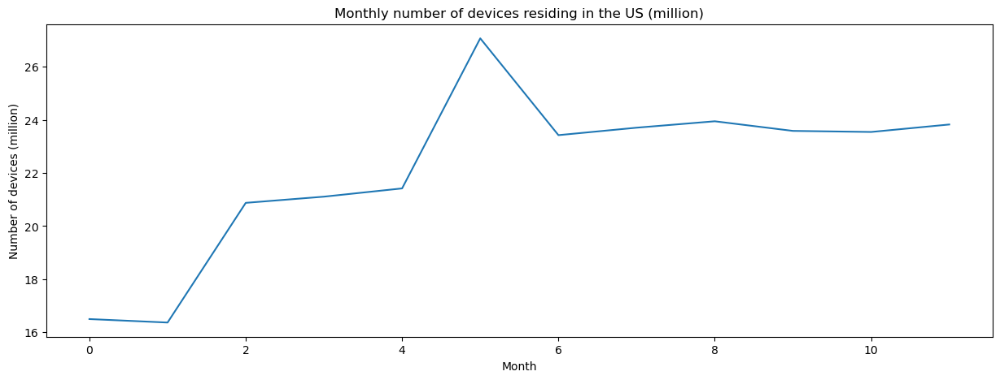

In [34]:
monthly_device_cnt_df = panel_df.query(f"ISO_COUNTRY_CODE == 'US' ").groupby(['YEAR', 'MONTH'], as_index=True)['NUMBER_DEVICES_RESIDING'].sum() / 10**6
print("monthly_device_cnt_df   (million):" )
monthly_device_cnt_df = monthly_device_cnt_df.reset_index() 
fig, ax = plt.subplots(figsize=(15, 5))
monthly_device_cnt_df['NUMBER_DEVICES_RESIDING'].plot()
ax.set_title("Monthly number of devices residing in the US (million)")
ax.set_xlabel("Month")
ax.set_ylabel("Number of devices (million)")
monthly_device_cnt_df

The NUMBER_DEVICES_RESIDING surged from 45 million to 900 million, and the sampling rate cannot be obatain, because it exceeds the US population.  (not found in 2025.12)

In [35]:
target_panel_df = panel_df.query(f"YEAR == {year} and MONTH == {int(month)} and ISO_COUNTRY_CODE == 'US' ").sort_values('CENSUS_BLOCK_GROUP')  # 
# target_panel_df = panel_df.query(f"YEAR == {year} and MON == {6} and ISO_COUNTRY_CODE == 'US' ").sort_values('CENSUS_BLOCK_GROUP')  # 
print(f"In YEAR: {year}, MONTH: {month}, US devices residing (million):" )
print("Total US NUMBER_DEVICES_RESIDING (million):",  target_panel_df['NUMBER_DEVICES_RESIDING'].sum() / 10**6)

target_panel_df

In YEAR: 2022, MONTH: 12, US devices residing (million):
Total US NUMBER_DEVICES_RESIDING (million): 23.824417


,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR
2404140,010010201001,US,12,75,78,al,2022
2404141,010010201002,US,12,118,192,al,2022
2404142,010010202001,US,12,124,96,al,2022
2404143,010010202002,US,12,192,164,al,2022
2404144,010010203001,US,12,258,338,al,2022
...,...,...,...,...,...,...,...
2624026,780309611001,US,12,277,201,vi,2022
2624027,780309611002,US,12,342,220,vi,2022
2624028,780309612001,US,12,15,17,vi,2022
2624029,780309612002,US,12,43,33,vi,2022


In [36]:
ACS_df['CBG_FIPS']  = ACS_df['fips'].str.zfill(12)
panel_ACS_df = target_panel_df.merge(ACS_df[['CBG_FIPS', 'totalpopulation']], left_on='CENSUS_BLOCK_GROUP', right_on='CBG_FIPS')
panel_ACS_df = panel_ACS_df.dropna(subset='NUMBER_DEVICES_RESIDING')
panel_ACS_df['NUMBER_DEVICES_RESIDING'] = panel_ACS_df['NUMBER_DEVICES_RESIDING'].astype(int)
panel_ACS_df = panel_ACS_df.sort_values('CBG_FIPS')
panel_ACS_df['person_per_device'] = panel_ACS_df['totalpopulation'] / panel_ACS_df['NUMBER_DEVICES_RESIDING']
panel_ACS_df['sampling_rate'] = panel_ACS_df['NUMBER_DEVICES_RESIDING'] / panel_ACS_df['totalpopulation']

print("Data cover US population (million) :", panel_ACS_df['totalpopulation'].sum() / 10**6)
panel_ACS_df

Data cover US population (million) : 324.591991


,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate
0,010010201001,US,12,75,78,al,2022,010010201001,730,9.358974,0.106849
1,010010201002,US,12,118,192,al,2022,010010201002,1263,6.578125,0.152019
2,010010202001,US,12,124,96,al,2022,010010202001,835,8.697917,0.114970
3,010010202002,US,12,192,164,al,2022,010010202002,1124,6.853659,0.145907
4,010010203001,US,12,258,338,al,2022,010010203001,2774,8.207101,0.121846
...,...,...,...,...,...,...,...,...,...,...,...
217059,560459511001,US,12,115,113,wy,2022,560459511001,1450,12.831858,0.077931
217060,560459511002,US,12,89,101,wy,2022,560459511002,1844,18.257426,0.054772
217061,560459513001,US,12,56,58,wy,2022,560459513001,1314,22.655172,0.044140
217062,560459513002,US,12,128,81,wy,2022,560459513002,1164,14.370370,0.069588


<Axes: title={'center': 'Device sampling rate histogram (2022-12)'}, xlabel='Sampling rate', ylabel='CBG count'>

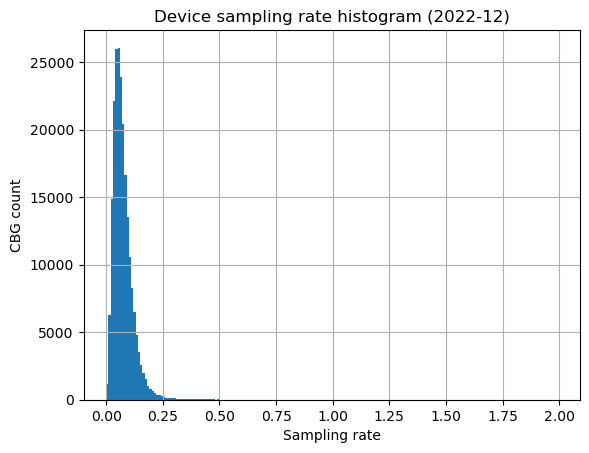

In [37]:
fig, ax = plt.subplots()

ax.set_title(f"Device sampling rate histogram ({year}-{month:02})")
ax.set_xlabel("Sampling rate")
ax.set_ylabel("CBG count")

panel_ACS_df.query("totalpopulation > 0  ")['sampling_rate'].dropna().hist(ax=ax, bins=np.array(range(0, 200,1))/100)

In [38]:
# get people_per_device of a county
panel_ACS_df['county_FIPS'] = panel_ACS_df['CBG_FIPS'].str[:5]
sampling_rate_county_df = panel_ACS_df.groupby(['county_FIPS'], as_index=False).agg(    # , 'YEAR', "MON", "REGION", "ISO_COUNTRY_CODE"
    county_device=('NUMBER_DEVICES_RESIDING', 'sum'),
    county_device_daytime=('NUMBER_DEVICES_RESIDING', 'sum'),
    county_device_population=('totalpopulation', 'sum'),
    ) 

sampling_rate_county_df['person_per_device_county'] = sampling_rate_county_df['county_device_population'] /  sampling_rate_county_df['county_device']

print("National device and population count:\n")
print(sampling_rate_county_df[['county_device', 'county_device_population']].sum())

print("\nNational person per device:\n")
print(sampling_rate_county_df['county_device'].sum() / sampling_rate_county_df['county_device_population'].sum())

people_per_device_df = panel_ACS_df.merge(sampling_rate_county_df, left_on='county_FIPS', right_on='county_FIPS')
people_per_device_df.to_csv(person_per_device_fname, index=False)
people_per_device_df

National device and population count:

county_device                23714439
county_device_population    324591991
dtype: int64

National person per device:

0.07305922406446559


,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate,county_FIPS,county_device,county_device_daytime,county_device_population,person_per_device_county
0,010010201001,US,12,75,78,al,2022,010010201001,730,9.358974,0.106849,01001,7645,7645,55380,7.243950
1,010010201002,US,12,118,192,al,2022,010010201002,1263,6.578125,0.152019,01001,7645,7645,55380,7.243950
2,010010202001,US,12,124,96,al,2022,010010202001,835,8.697917,0.114970,01001,7645,7645,55380,7.243950
3,010010202002,US,12,192,164,al,2022,010010202002,1124,6.853659,0.145907,01001,7645,7645,55380,7.243950
4,010010203001,US,12,258,338,al,2022,010010203001,2774,8.207101,0.121846,01001,7645,7645,55380,7.243950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217059,560459511001,US,12,115,113,wy,2022,560459511001,1450,12.831858,0.077931,56045,443,443,7049,15.911964
217060,560459511002,US,12,89,101,wy,2022,560459511002,1844,18.257426,0.054772,56045,443,443,7049,15.911964
217061,560459513001,US,12,56,58,wy,2022,560459513001,1314,22.655172,0.044140,56045,443,443,7049,15.911964
217062,560459513002,US,12,128,81,wy,2022,560459513002,1164,14.370370,0.069588,56045,443,443,7049,15.911964


## Compute the inbounds for each destination CBG

merge the device_home_area and person_per_device, then groupby the destination

In [39]:
# device_home_areas_df = pd.read_csv(device_home_areas_fname, dtype={"origin":str, "destination":str})
device_home_areas_df

,origin,device,stop,destination
0,010010205002,246,859.235656,010010201001
1,010010208022,222,775.407787,010010201001
2,010010208021,206,719.522541,010010201001
3,010010206001,170,593.780738,010010201001
4,010010208012,163,569.330943,010010201001
...,...,...,...,...
83460710,780309611002,4,18.386555,780309900000
83460711,780209502002,4,18.386555,780309900000
83460712,780309608001,4,18.386555,780309900000
83460713,780309900000,4,18.386555,780309900000


In [40]:
# people_per_device_df = pd.to_csv(person_per_device_fname, index=False)
person_per_device_df = people_per_device_df
# print("Loading people_per_device_df from:", person_per_device_fname)
# person_per_device_df = pd.read_csv(person_per_device_fname, dtype={"CBG_FIPS": str, 'CENSUS_BLOCK_GROUP': str})


print("Total totalpopulation (billion):", people_per_device_df['totalpopulation'].sum() / 10**9)
person_per_device_df

Total totalpopulation (billion): 0.324591991


,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate,county_FIPS,county_device,county_device_daytime,county_device_population,person_per_device_county
0,010010201001,US,12,75,78,al,2022,010010201001,730,9.358974,0.106849,01001,7645,7645,55380,7.243950
1,010010201002,US,12,118,192,al,2022,010010201002,1263,6.578125,0.152019,01001,7645,7645,55380,7.243950
2,010010202001,US,12,124,96,al,2022,010010202001,835,8.697917,0.114970,01001,7645,7645,55380,7.243950
3,010010202002,US,12,192,164,al,2022,010010202002,1124,6.853659,0.145907,01001,7645,7645,55380,7.243950
4,010010203001,US,12,258,338,al,2022,010010203001,2774,8.207101,0.121846,01001,7645,7645,55380,7.243950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217059,560459511001,US,12,115,113,wy,2022,560459511001,1450,12.831858,0.077931,56045,443,443,7049,15.911964
217060,560459511002,US,12,89,101,wy,2022,560459511002,1844,18.257426,0.054772,56045,443,443,7049,15.911964
217061,560459513001,US,12,56,58,wy,2022,560459513001,1314,22.655172,0.044140,56045,443,443,7049,15.911964
217062,560459513002,US,12,128,81,wy,2022,560459513002,1164,14.370370,0.069588,56045,443,443,7049,15.911964


In [41]:
origin_person_per_device_df = device_home_areas_df.merge(person_per_device_df[['CBG_FIPS', 'person_per_device', 'person_per_device_county']], left_on="origin", right_on="CBG_FIPS")

print("mean person per device:")
print(origin_person_per_device_df[['person_per_device', 'person_per_device_county']].mean())
print("median person per device:")
print(origin_person_per_device_df[['person_per_device', 'person_per_device_county']].median())

origin_person_per_device_df

mean person per device:
person_per_device           15.252389
person_per_device_county    14.806101
dtype: float64
median person per device:
person_per_device           12.937500
person_per_device_county    13.544745
dtype: float64


,origin,device,stop,destination,CBG_FIPS,person_per_device,person_per_device_county
0,010010205002,246,859.235656,010010201001,010010205002,5.642589,7.243950
1,010010208022,222,775.407787,010010201001,010010208022,7.123596,7.243950
2,010010208021,206,719.522541,010010201001,010010208021,8.097436,7.243950
3,010010206001,170,593.780738,010010201001,010010206001,7.142857,7.243950
4,010010208012,163,569.330943,010010201001,010010208012,6.212766,7.243950
...,...,...,...,...,...,...,...
83212520,080410045113,4,13.914224,780309612002,080410045113,13.360947,15.151608
83212521,471870502071,4,13.914224,780309612002,471870502071,9.506944,9.374802
83212522,450150206004,4,13.914224,780309612002,450150206004,9.089928,10.785610
83212523,361190059011,4,13.914224,780309612002,361190059011,19.483871,23.222262


In [42]:
origin_person_per_device_df['person_CBG_rate'] = origin_person_per_device_df['device'] * origin_person_per_device_df['person_per_device'] # total person (inbound) using CBG level person per device rate
origin_person_per_device_df['person_county_rate'] = origin_person_per_device_df['device'] * origin_person_per_device_df['person_per_device_county']  # total person (inbound) using county level person per device rate
print(origin_person_per_device_df[['person_CBG_rate','person_county_rate']].sum() / 10**9)

# origin_person_per_device_df

person_CBG_rate       10.018266
person_county_rate    10.028164
dtype: float64


In [43]:
def get_inbound_person_per_device(df):
    inboud_per_per_device_CBG_rate = df['person_CBG_rate'].sum() /  df['device'].sum()
    inboud_per_per_device_county_rate = df['person_county_rate'].sum() /  df['device'].sum()
    return {"inboud_per_per_device_CBG_rate": inboud_per_per_device_CBG_rate, "inboud_per_per_device_county_rate": inboud_per_per_device_county_rate}

# combine the orgin per person per device to destination
CBG_destination_inbound_per_device = origin_person_per_device_df.iloc[:].groupby('destination').progress_apply(get_inbound_person_per_device)
CBG_destination_inbound_per_device_df = pd.DataFrame(CBG_destination_inbound_per_device.tolist(), index=CBG_destination_inbound_per_device.index)

if save_file:
    print(f"Saving at: {CBG_destination_inbound_per_device_fname}...")
    CBG_destination_inbound_per_device_df.to_csv(CBG_destination_inbound_per_device_fname)
print(CBG_destination_inbound_per_device_df.mean())
print(CBG_destination_inbound_per_device_df[['inboud_per_per_device_CBG_rate','inboud_per_per_device_county_rate']].median()  )

CBG_destination_inbound_per_device_df

100%|█████████▉| 219418/220074 [00:31<00:00, 8419.69it/s]c:\Users\hning6\AppData\Local\anaconda3\envs\geo\Lib\site-packages\tqdm\std.py:917: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  return getattr(df, df_function)(wrapper, **kwargs)
100%|██████████| 220074/220074 [00:33<00:00, 6596.60it/s]


Saving at: ..\hourly_results\CBG_destination_inbound_per_device_202212.csv...
inboud_per_per_device_CBG_rate       16.117424
inboud_per_per_device_county_rate    15.652658
dtype: float64
inboud_per_per_device_CBG_rate       14.707494
inboud_per_per_device_county_rate    14.376461
dtype: float64


,inboud_per_per_device_CBG_rate,inboud_per_per_device_county_rate
destination,,
010010201001,7.294538,7.560271
010010201002,7.232533,7.585070
010010202001,7.587007,7.593886
010010202002,7.411321,7.741214
010010203001,7.497934,7.593693
...,...,...
780309610005,15.081632,11.587664
780309611001,11.445439,13.436220
780309611002,11.816327,14.125281


In [44]:
# print("Loading CBG_destination_inbound_per_device_df from:", CBG_destination_inbound_per_device_fname)
# CBG_destination_inbound_per_device_df = pd.read_csv(CBG_destination_inbound_per_device_fname, dtype={"destination": str}).set_index('destination')

print("CBG_destination_inbound_per_device_df.median():\n", CBG_destination_inbound_per_device_df.median() )
CBG_destination_inbound_per_device_df

CBG_destination_inbound_per_device_df.median():
 inboud_per_per_device_CBG_rate       14.707494
inboud_per_per_device_county_rate    14.376461
dtype: float64


,inboud_per_per_device_CBG_rate,inboud_per_per_device_county_rate
destination,,
010010201001,7.294538,7.560271
010010201002,7.232533,7.585070
010010202001,7.587007,7.593886
010010202002,7.411321,7.741214
010010203001,7.497934,7.593693
...,...,...
780309610005,15.081632,11.587664
780309611001,11.445439,13.436220
780309611002,11.816327,14.125281


In [45]:
# if save_file:
#     print("Loading adjusted_dwelling_time_stop_CBG_df from:", adjusted_dwelling_time_stop_CBG_fname)
#     adjusted_dwelling_time_stop_CBG_df = pd.read_csv(adjusted_dwelling_time_stop_CBG_fname, dtype={"CBG": str}).set_index('CBG')

print("Total adjusted hourly stops (billion):", adjusted_dwelling_time_stop_CBG_df.iloc[:, 1:].sum().sum() / 10**9)
# try:
#     adjusted_dwelling_time_stop_CBG_df.set_index('CBG', inplace=True)
# except ValueError as e:
#     print("Error setting index:", e)
# adjusted_dwelling_time_stop_CBG_df
adjusted_dwelling_time_stop_CBG_df

Total adjusted hourly stops (billion): 4.929396573


,2022-12-01 00:00:00,2022-12-01 01:00:00,2022-12-01 02:00:00,2022-12-01 03:00:00,2022-12-01 04:00:00,2022-12-01 05:00:00,2022-12-01 06:00:00,2022-12-01 07:00:00,2022-12-01 08:00:00,2022-12-01 09:00:00,2022-12-01 10:00:00,2022-12-01 11:00:00,2022-12-01 12:00:00,2022-12-01 13:00:00,2022-12-01 14:00:00,2022-12-01 15:00:00,2022-12-01 16:00:00,2022-12-01 17:00:00,2022-12-01 18:00:00,2022-12-01 19:00:00,2022-12-01 20:00:00,2022-12-01 21:00:00,2022-12-01 22:00:00,2022-12-01 23:00:00,2022-12-02 00:00:00,2022-12-02 01:00:00,2022-12-02 02:00:00,2022-12-02 03:00:00,2022-12-02 04:00:00,2022-12-02 05:00:00,2022-12-02 06:00:00,2022-12-02 07:00:00,2022-12-02 08:00:00,2022-12-02 09:00:00,2022-12-02 10:00:00,2022-12-02 11:00:00,2022-12-02 12:00:00,2022-12-02 13:00:00,2022-12-02 14:00:00,2022-12-02 15:00:00,2022-12-02 16:00:00,2022-12-02 17:00:00,2022-12-02 18:00:00,2022-12-02 19:00:00,2022-12-02 20:00:00,2022-12-02 21:00:00,2022-12-02 22:00:00,2022-12-02 23:00:00,2022-12-03 00:00:00,2022-12-03 01:00:00,2022-12-03 02:00:00,2022-12-03 03:00:00,2022-12-03 04:00:00,2022-12-03 05:00:00,2022-12-03 06:00:00,2022-12-03 07:00:00,2022-12-03 08:00:00,2022-12-03 09:00:00,2022-12-03 10:00:00,2022-12-03 11:00:00,2022-12-03 12:00:00,2022-12-03 13:00:00,2022-12-03 14:00:00,2022-12-03 15:00:00,2022-12-03 16:00:00,2022-12-03 17:00:00,2022-12-03 18:00:00,2022-12-03 19:00:00,2022-12-03 20:00:00,2022-12-03 21:00:00,2022-12-03 22:00:00,2022-12-03 23:00:00,2022-12-04 00:00:00,2022-12-04 01:00:00,2022-12-04 02:00:00,2022-12-04 03:00:00,2022-12-04 04:00:00,2022-12-04 05:00:00,2022-12-04 06:00:00,2022-12-04 07:00:00,2022-12-04 08:00:00,2022-12-04 09:00:00,2022-12-04 10:00:00,2022-12-04 11:00:00,2022-12-04 12:00:00,2022-12-04 13:00:00,2022-12-04 14:00:00,2022-12-04 15:00:00,2022-12-04 16:00:00,2022-12-04 17:00:00,2022-12-04 18:00:00,2022-12-04 19:00:00,2022-12-04 20:00:00,2022-12-04 21:00:00,2022-12-04 22:00:00,2022-12-04 23:00:00,2022-12-05 00:00:00,2022-12-05 01:00:00,2022-12-05 02:00:00,2022-12-05 03:00:00,2022-12-05 04:00:00,2022-12-05 05:00:00,2022-12-05 06:00:00,2022-12-05 07:00:00,2022-12-05 08:00:00,2022-12-05 09:00:00,2022-12-05 10:00:00,2022-12-05 11:00:00,2022-12-05 12:00:00,2022-12-05 13:00:00,2022-12-05 14:00:00,2022-12-05 15:00:00,2022-12-05 16:00:00,2022-12-05 17:00:00,2022-12-05 18:00:00,2022-12-05 19:00:00,2022-12-05 20:00:00,2022-12-05 21:00:00,2022-12-05 22:00:00,2022-12-05 23:00:00,2022-12-06 00:00:00,2022-12-06 01:00:00,2022-12-06 02:00:00,2022-12-06 03:00:00,2022-12-06 04:00:00,2022-12-06 05:00:00,2022-12-06 06:00:00,2022-12-06 07:00:00,2022-12-06 08:00:00,2022-12-06 09:00:00,2022-12-06 10:00:00,2022-12-06 11:00:00,2022-12-06 12:00:00,2022-12-06 13:00:00,2022-12-06 14:00:00,2022-12-06 15:00:00,2022-12-06 16:00:00,2022-12-06 17:00:00,2022-12-06 18:00:00,2022-12-06 19:00:00,2022-12-06 20:00:00,2022-12-06 21:00:00,2022-12-06 22:00:00,2022-12-06 23:00:00,2022-12-07 00:00:00,2022-12-07 01:00:00,2022-12-07 02:00:00,2022-12-07 03:00:00,2022-12-07 04:00:00,2022-12-07 05:00:00,2022-12-07 06:00:00,2022-12-07 07:00:00,2022-12-07 08:00:00,2022-12-07 09:00:00,2022-12-07 10:00:00,2022-12-07 11:00:00,2022-12-07 12:00:00,2022-12-07 13:00:00,2022-12-07 14:00:00,2022-12-07 15:00:00,2022-12-07 16:00:00,2022-12-07 17:00:00,2022-12-07 18:00:00,2022-12-07 19:00:00,2022-12-07 20:00:00,2022-12-07 21:00:00,2022-12-07 22:00:00,2022-12-07 23:00:00,2022-12-08 00:00:00,2022-12-08 01:00:00,2022-12-08 02:00:00,2022-12-08 03:00:00,2022-12-08 04:00:00,2022-12-08 05:00:00,2022-12-08 06:00:00,2022-12-08 07:00:00,2022-12-08 08:00:00,2022-12-08 09:00:00,2022-12-08 10:00:00,2022-12-08 11:00:00,2022-12-08 12:00:00,2022-12-08 13:00:00,2022-12-08 14:00:00,2022-12-08 15:00:00,2022-12-08 16:00:00,2022-12-08 17:00:00,2022-12-08 18:00:00,2022-12-08 19:00:00,2022-12-08 20:00:00,2022-12-08 21:00:00,2022-12-08 22:00:00,2022-12-08 23:00:00,2022-12-09 00:00:00,2022-12-09 01:00:00,2022-12-09 02:00:00,2022-12-09 03:00:00,2022-12-09 04:00:00,2022-12-09 05:00:00,2022-12-09 06:00:00,2022-12-09 07:00:00

In [46]:
# try:
#     CBG_destination_inbound_per_device_df.set_index('destination', inplace=True)
# except ValueError as e:
#     # print("Error setting index:", e)
#     pass
CBG_destination_inbound_per_device_df
# adjusted_dwelling_time_stop_CBG_df

,inboud_per_per_device_CBG_rate,inboud_per_per_device_county_rate
destination,,
010010201001,7.294538,7.560271
010010201002,7.232533,7.585070
010010202001,7.587007,7.593886
010010202002,7.411321,7.741214
010010203001,7.497934,7.593693
...,...,...
780309610005,15.081632,11.587664
780309611001,11.445439,13.436220
780309611002,11.816327,14.125281


In [47]:
adjusted_dwelling_time_stop_inbound_per_device_CBG_df = adjusted_dwelling_time_stop_CBG_df.merge(CBG_destination_inbound_per_device_df,left_index=True, right_index=True)
adjusted_dwelling_time_stop_inbound_per_device_CBG_df.index.name = 'CBG'
adjusted_dwelling_time_stop_inbound_per_device_CBG_df

,2022-12-01 00:00:00,2022-12-01 01:00:00,2022-12-01 02:00:00,2022-12-01 03:00:00,2022-12-01 04:00:00,2022-12-01 05:00:00,2022-12-01 06:00:00,2022-12-01 07:00:00,2022-12-01 08:00:00,2022-12-01 09:00:00,2022-12-01 10:00:00,2022-12-01 11:00:00,2022-12-01 12:00:00,2022-12-01 13:00:00,2022-12-01 14:00:00,2022-12-01 15:00:00,2022-12-01 16:00:00,2022-12-01 17:00:00,2022-12-01 18:00:00,2022-12-01 19:00:00,2022-12-01 20:00:00,2022-12-01 21:00:00,2022-12-01 22:00:00,2022-12-01 23:00:00,2022-12-02 00:00:00,2022-12-02 01:00:00,2022-12-02 02:00:00,2022-12-02 03:00:00,2022-12-02 04:00:00,2022-12-02 05:00:00,2022-12-02 06:00:00,2022-12-02 07:00:00,2022-12-02 08:00:00,2022-12-02 09:00:00,2022-12-02 10:00:00,2022-12-02 11:00:00,2022-12-02 12:00:00,2022-12-02 13:00:00,2022-12-02 14:00:00,2022-12-02 15:00:00,2022-12-02 16:00:00,2022-12-02 17:00:00,2022-12-02 18:00:00,2022-12-02 19:00:00,2022-12-02 20:00:00,2022-12-02 21:00:00,2022-12-02 22:00:00,2022-12-02 23:00:00,2022-12-03 00:00:00,2022-12-03 01:00:00,2022-12-03 02:00:00,2022-12-03 03:00:00,2022-12-03 04:00:00,2022-12-03 05:00:00,2022-12-03 06:00:00,2022-12-03 07:00:00,2022-12-03 08:00:00,2022-12-03 09:00:00,2022-12-03 10:00:00,2022-12-03 11:00:00,2022-12-03 12:00:00,2022-12-03 13:00:00,2022-12-03 14:00:00,2022-12-03 15:00:00,2022-12-03 16:00:00,2022-12-03 17:00:00,2022-12-03 18:00:00,2022-12-03 19:00:00,2022-12-03 20:00:00,2022-12-03 21:00:00,2022-12-03 22:00:00,2022-12-03 23:00:00,2022-12-04 00:00:00,2022-12-04 01:00:00,2022-12-04 02:00:00,2022-12-04 03:00:00,2022-12-04 04:00:00,2022-12-04 05:00:00,2022-12-04 06:00:00,2022-12-04 07:00:00,2022-12-04 08:00:00,2022-12-04 09:00:00,2022-12-04 10:00:00,2022-12-04 11:00:00,2022-12-04 12:00:00,2022-12-04 13:00:00,2022-12-04 14:00:00,2022-12-04 15:00:00,2022-12-04 16:00:00,2022-12-04 17:00:00,2022-12-04 18:00:00,2022-12-04 19:00:00,2022-12-04 20:00:00,2022-12-04 21:00:00,2022-12-04 22:00:00,2022-12-04 23:00:00,2022-12-05 00:00:00,2022-12-05 01:00:00,2022-12-05 02:00:00,2022-12-05 03:00:00,2022-12-05 04:00:00,2022-12-05 05:00:00,2022-12-05 06:00:00,2022-12-05 07:00:00,2022-12-05 08:00:00,2022-12-05 09:00:00,2022-12-05 10:00:00,2022-12-05 11:00:00,2022-12-05 12:00:00,2022-12-05 13:00:00,2022-12-05 14:00:00,2022-12-05 15:00:00,2022-12-05 16:00:00,2022-12-05 17:00:00,2022-12-05 18:00:00,2022-12-05 19:00:00,2022-12-05 20:00:00,2022-12-05 21:00:00,2022-12-05 22:00:00,2022-12-05 23:00:00,2022-12-06 00:00:00,2022-12-06 01:00:00,2022-12-06 02:00:00,2022-12-06 03:00:00,2022-12-06 04:00:00,2022-12-06 05:00:00,2022-12-06 06:00:00,2022-12-06 07:00:00,2022-12-06 08:00:00,2022-12-06 09:00:00,2022-12-06 10:00:00,2022-12-06 11:00:00,2022-12-06 12:00:00,2022-12-06 13:00:00,2022-12-06 14:00:00,2022-12-06 15:00:00,2022-12-06 16:00:00,2022-12-06 17:00:00,2022-12-06 18:00:00,2022-12-06 19:00:00,2022-12-06 20:00:00,2022-12-06 21:00:00,2022-12-06 22:00:00,2022-12-06 23:00:00,2022-12-07 00:00:00,2022-12-07 01:00:00,2022-12-07 02:00:00,2022-12-07 03:00:00,2022-12-07 04:00:00,2022-12-07 05:00:00,2022-12-07 06:00:00,2022-12-07 07:00:00,2022-12-07 08:00:00,2022-12-07 09:00:00,2022-12-07 10:00:00,2022-12-07 11:00:00,2022-12-07 12:00:00,2022-12-07 13:00:00,2022-12-07 14:00:00,2022-12-07 15:00:00,2022-12-07 16:00:00,2022-12-07 17:00:00,2022-12-07 18:00:00,2022-12-07 19:00:00,2022-12-07 20:00:00,2022-12-07 21:00:00,2022-12-07 22:00:00,2022-12-07 23:00:00,2022-12-08 00:00:00,2022-12-08 01:00:00,2022-12-08 02:00:00,2022-12-08 03:00:00,2022-12-08 04:00:00,2022-12-08 05:00:00,2022-12-08 06:00:00,2022-12-08 07:00:00,2022-12-08 08:00:00,2022-12-08 09:00:00,2022-12-08 10:00:00,2022-12-08 11:00:00,2022-12-08 12:00:00,2022-12-08 13:00:00,2022-12-08 14:00:00,2022-12-08 15:00:00,2022-12-08 16:00:00,2022-12-08 17:00:00,2022-12-08 18:00:00,2022-12-08 19:00:00,2022-12-08 20:00:00,2022-12-08 21:00:00,2022-12-08 22:00:00,2022-12-08 23:00:00,2022-12-09 00:00:00,2022-12-09 01:00:00,2022-12-09 02:00:00,2022-12-09 03:00:00,2022-12-09 04:00:00,2022-12-09 05:00:00,2022-12-09 06:00:00,2022-12-09 07:00:00

In [48]:
# sclae the stop by visit scaling factor
county_visit_scaling_factor_month_df

,county_fips,month,year,noon_visit_80quantile,raw_visitor_counts,schoolday_count,visit_scaling_factor,school_count,state_name,county_name,school_names,state_fips,state_raw_visitor_counts,state_noon_visit_80quantile,state_visit_scaling_factor
11,01001,12,2022,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204
23,01003,12,2022,20030.0,54043.0,50.0,2.698,8.0,Alabama,Baldwin,"Baldwin Co High Sch, Daphne High Sch, Elberta ...",01,817612.0,279506.0,2.925204
35,01005,12,2022,1487.0,3130.0,15.0,2.105,2.0,Alabama,Barbour,"Barbour Co High Sch, Eufaula High Sch",01,817612.0,279506.0,2.925204
47,01007,12,2022,602.0,1925.0,12.0,3.198,1.0,Alabama,Bibb,West Blocton High Sch,01,817612.0,279506.0,2.925204
59,01009,12,2022,4019.0,13575.0,26.0,3.378,8.0,Alabama,Blount,"Appalachian Sch, Cleveland High Sch, Hayden Hi...",01,817612.0,279506.0,2.925204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37655,56037,12,2022,1588.0,4426.0,7.0,2.787,2.0,Wyoming,Sweetwater,"Green River High School, Rock Springs High School",56,49553.0,19048.0,2.601480
37667,56039,12,2022,974.0,2117.0,15.0,2.174,1.0,Wyoming,Teton,Jackson Hole High School,56,49553.0,19048.0,2.601480
37679,56041,12,2022,1127.0,2752.0,7.0,2.442,1.0,Wyoming,Uinta,Evanston High School,56,49553.0,19048.0,2.601480
37691,56043,12,2022,160.0,410.0,NaN,2.562,NaN,NaN,NaN,NaN,56,49553.0,19048.0,2.601480


In [49]:
hour_cnt = adjusted_dwelling_time_stop_CBG_df.shape[1]
print("hour_cnt:", hour_cnt)

hour_cnt: 744


In [50]:
# inbound_hourly_df.iloc[:, hour]
# inbound_hourly_df.loc[:, 'inboud_per_per_device_CBG_rate']
month_df

,Y,M,AREA,DEVICE_HOME_AREAS,RAW_STOP_COUNTS,RAW_DEVICE_COUNTS,MEDIAN_DWELL,STOPS_BY_EACH_HOUR,county_fips,month,year,noon_visit_80quantile,raw_visitor_counts,schoolday_count,visit_scaling_factor,school_count,state_name,county_name,school_names,state_fips,state_raw_visitor_counts,state_noon_visit_80quantile,state_visit_scaling_factor,total_hourly_stop,adjusted_raw_stop
0,2022,12,010010201001,"{'010010205002': 246, '010010208022': 222, '01...",17045,4880,14.416667,"[2,1,0,0,2,3,19,58,24,12,21,24,17,26,45,69,41,...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204,17045,17045
1,2022,12,010010201002,"{'010010201002': 186, '010010205002': 60, '010...",9879,1271,215.000000,"[7,1,0,1,1,1,3,11,9,6,5,19,14,19,21,51,27,46,2...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204,9879,39516
2,2022,12,010010202001,"{'010010205002': 146, '010010208022': 133, '01...",12588,2092,35.083333,"[4,1,0,0,3,2,17,184,25,22,30,18,29,23,31,162,8...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204,12588,12588
3,2022,12,010010202002,"{'010010205002': 550, '010010208022': 338, '01...",57665,12051,6.700000,"[3,0,2,0,4,9,27,237,152,80,86,132,122,106,158,...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204,57665,57665
4,2022,12,010010203001,"{'010010203001': 331, '010010205002': 190, '01...",23236,3398,133.916667,"[6,0,0,2,1,2,16,80,20,20,15,25,28,42,43,134,76...",01001,12,2022.0,4756.0,13240.0,21.0,2.784,4.0,Alabama,Autauga,"Autauga Academy, Billingsley High Sch, Marbury...",01,817612.0,279506.0,2.925204,23236,69708
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220680,2022,12,780309611001,"{'780309611001': 192, '780309611002': 188, '78...",22292,4641,22.583333,"[4,2,2,1,2,1,11,62,47,42,56,50,60,56,37,64,63,...",78030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22292,22292
220681,2022,12,780309611002,"{'780309611002': 205, '780309611001': 150, '78...",11850,2089,10.133333,"[6,1,1,0,1,2,3,28,21,18,19,22,18,17,24,38,23,3...",78030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11850,11850
220682,2022,12,780309612001,"{'780309611002': 54, '780309608001': 44, '7803...",3183,453,86.016667,"[2,0,1,1,0,0,2,4,10,6,6,0,2,6,8,13,8,10,11,8,4...",78030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3183,6366
220683,2022,12,780309612002,"{'780309611002': 132, '780309611001': 124, '78...",11274,3241,10.216667,"[3,3,3,3,4,3,3,22,26,14,27,17,21,21,31,33,18,2...",78030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11274,11274


## compute the inbound

In [51]:
# needs about 3 minutes

inbound_hourly_df = adjusted_dwelling_time_stop_inbound_per_device_CBG_df.astype(np.float64).copy()
inbound_hourly_df['county_fips'] = inbound_hourly_df.index.str[:5]
inbound_hourly_df = inbound_hourly_df.reset_index().merge(county_visit_scaling_factor_month_df, on='county_fips', how='left').set_index('CBG')

for hour in tqdm(range(hour_cnt)):
    inbound_hourly_df.iloc[:, hour] = inbound_hourly_df.iloc[:, hour] * inbound_hourly_df.loc[:, 'inboud_per_per_device_CBG_rate'] * inbound_hourly_df.loc[:, 'visit_scaling_factor']   # 70.4215236989238 billion
    # inbound_hourly_df.iloc[:, hour] = inbound_hourly_df.iloc[:, hour] * inbound_hourly_df.loc[:, 'inboud_per_per_device_county_rate']   # 56.34291367286323 billion
print("Total restored inbound (billion) using per_device_CBG_rate:",  inbound_hourly_df.iloc[:, :hour].sum().sum() / 10**9)

inbound_hourly_df = adjusted_dwelling_time_stop_inbound_per_device_CBG_df.astype(np.float64).copy()
inbound_hourly_df['county_fips'] = inbound_hourly_df.index.str[:5]
inbound_hourly_df = inbound_hourly_df.reset_index().merge(county_visit_scaling_factor_month_df, on='county_fips', how='left').set_index('CBG')

for hour in tqdm(range(hour_cnt)):
    # inbound_hourly_df.iloc[:, hour] = inbound_hourly_df.iloc[:, hour] * inbound_hourly_df.loc[:, 'inboud_per_per_device_CBG_rate']   # 70.4215236989238 billion
    inbound_hourly_df.iloc[:, hour] = inbound_hourly_df.iloc[:, hour] * inbound_hourly_df.loc[:, 'inboud_per_per_device_county_rate'] * inbound_hourly_df.loc[:, 'state_visit_scaling_factor']    # 56.34291367286323 billion
print("Total restored inbound (billion) using per_device_county_rate and state_visit_scaling_factor:",  inbound_hourly_df.iloc[:, :hour].sum().sum() / 10**9)


inbound_hourly_df = adjusted_dwelling_time_stop_inbound_per_device_CBG_df.astype(np.float64).copy()
inbound_hourly_df['county_fips'] = inbound_hourly_df.index.str[:5]
inbound_hourly_df = inbound_hourly_df.reset_index().merge(county_visit_scaling_factor_month_df, on='county_fips', how='left').set_index('CBG')

for hour in tqdm(range(hour_cnt)):
    # inbound_hourly_df.iloc[:, hour] = inbound_hourly_df.iloc[:, hour] * inbound_hourly_df.loc[:, 'inboud_per_per_device_CBG_rate']   # 70.4215236989238 billion
    inbound_hourly_df.iloc[:, hour] = inbound_hourly_df.iloc[:, hour] * inbound_hourly_df.loc[:, 'inboud_per_per_device_county_rate'] * inbound_hourly_df.loc[:, 'visit_scaling_factor']    # 56.34291367286323 billion
print("Total restored inbound (billion) using per_device_county_rate:",  inbound_hourly_df.iloc[:, :hour].sum().sum() / 10**9)




# print("We will use inboud_per_per_device_county_rate.")
 
# if save_file:
    # print("Saving inbound_hourly_df at:", inbound_hourly_df_fname)  
    # inbound_hourly_df.astype(np.int64).to_csv(inbound_hourly_df_fname)
    
inbound_hourly_df

100%|██████████| 744/744 [00:01<00:00, 531.93it/s]


Total restored inbound (billion) using per_device_CBG_rate: 185.44411656439226


100%|██████████| 744/744 [00:01<00:00, 578.15it/s]


Total restored inbound (billion) using per_device_county_rate and state_visit_scaling_factor: 184.58271379434441


100%|██████████| 744/744 [00:01<00:00, 525.36it/s]


Total restored inbound (billion) using per_device_county_rate: 188.19694497801123


,2022-12-01 00:00:00,2022-12-01 01:00:00,2022-12-01 02:00:00,2022-12-01 03:00:00,2022-12-01 04:00:00,2022-12-01 05:00:00,2022-12-01 06:00:00,2022-12-01 07:00:00,2022-12-01 08:00:00,2022-12-01 09:00:00,2022-12-01 10:00:00,2022-12-01 11:00:00,2022-12-01 12:00:00,2022-12-01 13:00:00,2022-12-01 14:00:00,2022-12-01 15:00:00,2022-12-01 16:00:00,2022-12-01 17:00:00,2022-12-01 18:00:00,2022-12-01 19:00:00,2022-12-01 20:00:00,2022-12-01 21:00:00,2022-12-01 22:00:00,2022-12-01 23:00:00,2022-12-02 00:00:00,2022-12-02 01:00:00,2022-12-02 02:00:00,2022-12-02 03:00:00,2022-12-02 04:00:00,2022-12-02 05:00:00,2022-12-02 06:00:00,2022-12-02 07:00:00,2022-12-02 08:00:00,2022-12-02 09:00:00,2022-12-02 10:00:00,2022-12-02 11:00:00,2022-12-02 12:00:00,2022-12-02 13:00:00,2022-12-02 14:00:00,2022-12-02 15:00:00,2022-12-02 16:00:00,2022-12-02 17:00:00,2022-12-02 18:00:00,2022-12-02 19:00:00,2022-12-02 20:00:00,2022-12-02 21:00:00,2022-12-02 22:00:00,2022-12-02 23:00:00,2022-12-03 00:00:00,2022-12-03 01:00:00,2022-12-03 02:00:00,2022-12-03 03:00:00,2022-12-03 04:00:00,2022-12-03 05:00:00,2022-12-03 06:00:00,2022-12-03 07:00:00,2022-12-03 08:00:00,2022-12-03 09:00:00,2022-12-03 10:00:00,2022-12-03 11:00:00,2022-12-03 12:00:00,2022-12-03 13:00:00,2022-12-03 14:00:00,2022-12-03 15:00:00,2022-12-03 16:00:00,2022-12-03 17:00:00,2022-12-03 18:00:00,2022-12-03 19:00:00,2022-12-03 20:00:00,2022-12-03 21:00:00,2022-12-03 22:00:00,2022-12-03 23:00:00,2022-12-04 00:00:00,2022-12-04 01:00:00,2022-12-04 02:00:00,2022-12-04 03:00:00,2022-12-04 04:00:00,2022-12-04 05:00:00,2022-12-04 06:00:00,2022-12-04 07:00:00,2022-12-04 08:00:00,2022-12-04 09:00:00,2022-12-04 10:00:00,2022-12-04 11:00:00,2022-12-04 12:00:00,2022-12-04 13:00:00,2022-12-04 14:00:00,2022-12-04 15:00:00,2022-12-04 16:00:00,2022-12-04 17:00:00,2022-12-04 18:00:00,2022-12-04 19:00:00,2022-12-04 20:00:00,2022-12-04 21:00:00,2022-12-04 22:00:00,2022-12-04 23:00:00,2022-12-05 00:00:00,2022-12-05 01:00:00,2022-12-05 02:00:00,2022-12-05 03:00:00,2022-12-05 04:00:00,2022-12-05 05:00:00,2022-12-05 06:00:00,2022-12-05 07:00:00,2022-12-05 08:00:00,2022-12-05 09:00:00,2022-12-05 10:00:00,2022-12-05 11:00:00,2022-12-05 12:00:00,2022-12-05 13:00:00,2022-12-05 14:00:00,2022-12-05 15:00:00,2022-12-05 16:00:00,2022-12-05 17:00:00,2022-12-05 18:00:00,2022-12-05 19:00:00,2022-12-05 20:00:00,2022-12-05 21:00:00,2022-12-05 22:00:00,2022-12-05 23:00:00,2022-12-06 00:00:00,2022-12-06 01:00:00,2022-12-06 02:00:00,2022-12-06 03:00:00,2022-12-06 04:00:00,2022-12-06 05:00:00,2022-12-06 06:00:00,2022-12-06 07:00:00,2022-12-06 08:00:00,2022-12-06 09:00:00,2022-12-06 10:00:00,2022-12-06 11:00:00,2022-12-06 12:00:00,2022-12-06 13:00:00,2022-12-06 14:00:00,2022-12-06 15:00:00,2022-12-06 16:00:00,2022-12-06 17:00:00,2022-12-06 18:00:00,2022-12-06 19:00:00,2022-12-06 20:00:00,2022-12-06 21:00:00,2022-12-06 22:00:00,2022-12-06 23:00:00,2022-12-07 00:00:00,2022-12-07 01:00:00,2022-12-07 02:00:00,2022-12-07 03:00:00,2022-12-07 04:00:00,2022-12-07 05:00:00,2022-12-07 06:00:00,2022-12-07 07:00:00,2022-12-07 08:00:00,2022-12-07 09:00:00,2022-12-07 10:00:00,2022-12-07 11:00:00,2022-12-07 12:00:00,2022-12-07 13:00:00,2022-12-07 14:00:00,2022-12-07 15:00:00,2022-12-07 16:00:00,2022-12-07 17:00:00,2022-12-07 18:00:00,2022-12-07 19:00:00,2022-12-07 20:00:00,2022-12-07 21:00:00,2022-12-07 22:00:00,2022-12-07 23:00:00,2022-12-08 00:00:00,2022-12-08 01:00:00,2022-12-08 02:00:00,2022-12-08 03:00:00,2022-12-08 04:00:00,2022-12-08 05:00:00,2022-12-08 06:00:00,2022-12-08 07:00:00,2022-12-08 08:00:00,2022-12-08 09:00:00,2022-12-08 10:00:00,2022-12-08 11:00:00,2022-12-08 12:00:00,2022-12-08 13:00:00,2022-12-08 14:00:00,2022-12-08 15:00:00,2022-12-08 16:00:00,2022-12-08 17:00:00,2022-12-08 18:00:00,2022-12-08 19:00:00,2022-12-08 20:00:00,2022-12-08 21:00:00,2022-12-08 22:00:00,2022-12-08 23:00:00,2022-12-09 00:00:00,2022-12-09 01:00:00,2022-12-09 02:00:00,2022-12-09 03:00:00,2022-12-09 04:00:00,2022-12-09 05:00:00,2022-12-09 06:00:00,2022-12-09 07:00:00

In [52]:
# Get the hourly aggregated inbounds for all CBGs
print("inbound sum.sum():", inbound_hourly_df.iloc[:, :hour_cnt].sum().sum() / 10**9)
inbound_hourly_df

inbound sum.sum(): 188.3386909301784


,2022-12-01 00:00:00,2022-12-01 01:00:00,2022-12-01 02:00:00,2022-12-01 03:00:00,2022-12-01 04:00:00,2022-12-01 05:00:00,2022-12-01 06:00:00,2022-12-01 07:00:00,2022-12-01 08:00:00,2022-12-01 09:00:00,2022-12-01 10:00:00,2022-12-01 11:00:00,2022-12-01 12:00:00,2022-12-01 13:00:00,2022-12-01 14:00:00,2022-12-01 15:00:00,2022-12-01 16:00:00,2022-12-01 17:00:00,2022-12-01 18:00:00,2022-12-01 19:00:00,2022-12-01 20:00:00,2022-12-01 21:00:00,2022-12-01 22:00:00,2022-12-01 23:00:00,2022-12-02 00:00:00,2022-12-02 01:00:00,2022-12-02 02:00:00,2022-12-02 03:00:00,2022-12-02 04:00:00,2022-12-02 05:00:00,2022-12-02 06:00:00,2022-12-02 07:00:00,2022-12-02 08:00:00,2022-12-02 09:00:00,2022-12-02 10:00:00,2022-12-02 11:00:00,2022-12-02 12:00:00,2022-12-02 13:00:00,2022-12-02 14:00:00,2022-12-02 15:00:00,2022-12-02 16:00:00,2022-12-02 17:00:00,2022-12-02 18:00:00,2022-12-02 19:00:00,2022-12-02 20:00:00,2022-12-02 21:00:00,2022-12-02 22:00:00,2022-12-02 23:00:00,2022-12-03 00:00:00,2022-12-03 01:00:00,2022-12-03 02:00:00,2022-12-03 03:00:00,2022-12-03 04:00:00,2022-12-03 05:00:00,2022-12-03 06:00:00,2022-12-03 07:00:00,2022-12-03 08:00:00,2022-12-03 09:00:00,2022-12-03 10:00:00,2022-12-03 11:00:00,2022-12-03 12:00:00,2022-12-03 13:00:00,2022-12-03 14:00:00,2022-12-03 15:00:00,2022-12-03 16:00:00,2022-12-03 17:00:00,2022-12-03 18:00:00,2022-12-03 19:00:00,2022-12-03 20:00:00,2022-12-03 21:00:00,2022-12-03 22:00:00,2022-12-03 23:00:00,2022-12-04 00:00:00,2022-12-04 01:00:00,2022-12-04 02:00:00,2022-12-04 03:00:00,2022-12-04 04:00:00,2022-12-04 05:00:00,2022-12-04 06:00:00,2022-12-04 07:00:00,2022-12-04 08:00:00,2022-12-04 09:00:00,2022-12-04 10:00:00,2022-12-04 11:00:00,2022-12-04 12:00:00,2022-12-04 13:00:00,2022-12-04 14:00:00,2022-12-04 15:00:00,2022-12-04 16:00:00,2022-12-04 17:00:00,2022-12-04 18:00:00,2022-12-04 19:00:00,2022-12-04 20:00:00,2022-12-04 21:00:00,2022-12-04 22:00:00,2022-12-04 23:00:00,2022-12-05 00:00:00,2022-12-05 01:00:00,2022-12-05 02:00:00,2022-12-05 03:00:00,2022-12-05 04:00:00,2022-12-05 05:00:00,2022-12-05 06:00:00,2022-12-05 07:00:00,2022-12-05 08:00:00,2022-12-05 09:00:00,2022-12-05 10:00:00,2022-12-05 11:00:00,2022-12-05 12:00:00,2022-12-05 13:00:00,2022-12-05 14:00:00,2022-12-05 15:00:00,2022-12-05 16:00:00,2022-12-05 17:00:00,2022-12-05 18:00:00,2022-12-05 19:00:00,2022-12-05 20:00:00,2022-12-05 21:00:00,2022-12-05 22:00:00,2022-12-05 23:00:00,2022-12-06 00:00:00,2022-12-06 01:00:00,2022-12-06 02:00:00,2022-12-06 03:00:00,2022-12-06 04:00:00,2022-12-06 05:00:00,2022-12-06 06:00:00,2022-12-06 07:00:00,2022-12-06 08:00:00,2022-12-06 09:00:00,2022-12-06 10:00:00,2022-12-06 11:00:00,2022-12-06 12:00:00,2022-12-06 13:00:00,2022-12-06 14:00:00,2022-12-06 15:00:00,2022-12-06 16:00:00,2022-12-06 17:00:00,2022-12-06 18:00:00,2022-12-06 19:00:00,2022-12-06 20:00:00,2022-12-06 21:00:00,2022-12-06 22:00:00,2022-12-06 23:00:00,2022-12-07 00:00:00,2022-12-07 01:00:00,2022-12-07 02:00:00,2022-12-07 03:00:00,2022-12-07 04:00:00,2022-12-07 05:00:00,2022-12-07 06:00:00,2022-12-07 07:00:00,2022-12-07 08:00:00,2022-12-07 09:00:00,2022-12-07 10:00:00,2022-12-07 11:00:00,2022-12-07 12:00:00,2022-12-07 13:00:00,2022-12-07 14:00:00,2022-12-07 15:00:00,2022-12-07 16:00:00,2022-12-07 17:00:00,2022-12-07 18:00:00,2022-12-07 19:00:00,2022-12-07 20:00:00,2022-12-07 21:00:00,2022-12-07 22:00:00,2022-12-07 23:00:00,2022-12-08 00:00:00,2022-12-08 01:00:00,2022-12-08 02:00:00,2022-12-08 03:00:00,2022-12-08 04:00:00,2022-12-08 05:00:00,2022-12-08 06:00:00,2022-12-08 07:00:00,2022-12-08 08:00:00,2022-12-08 09:00:00,2022-12-08 10:00:00,2022-12-08 11:00:00,2022-12-08 12:00:00,2022-12-08 13:00:00,2022-12-08 14:00:00,2022-12-08 15:00:00,2022-12-08 16:00:00,2022-12-08 17:00:00,2022-12-08 18:00:00,2022-12-08 19:00:00,2022-12-08 20:00:00,2022-12-08 21:00:00,2022-12-08 22:00:00,2022-12-08 23:00:00,2022-12-09 00:00:00,2022-12-09 01:00:00,2022-12-09 02:00:00,2022-12-09 03:00:00,2022-12-09 04:00:00,2022-12-09 05:00:00,2022-12-09 06:00:00,2022-12-09 07:00:00

A key assumption: if a device generate 20 events a day, 90% population (0.324 billion) has a smartphone, the total event is: 0.324 * 0.9 * 30 * 20 = 175 billion. This is a reference value for the total events.


In [53]:
hourly_agregated_inbound_df = pd.DataFrame(inbound_hourly_df.iloc[:, :hour_cnt].sum(), columns=['inboud']).reset_index()[['inboud']]

if save_file:
    hourly_agregated_inbound_df.to_csv(hourly_agregated_inbound_fname, index=False)
    print("Save hourly_agregated_inbound_df at:", hourly_agregated_inbound_fname)

    CBG_agregated_inbound_df = pd.DataFrame(inbound_hourly_df.iloc[:, :hour_cnt].sum(axis=1), columns=['inboud'])
    CBG_agregated_inbound_df.to_csv(CBG_agregated_inbound_fname)
    print("Save CBG_agregated_inbound_df at:", CBG_agregated_inbound_fname)

Save hourly_agregated_inbound_df at: ..\hourly_results\hourly_agregated_inbound_202212.csv
Save CBG_agregated_inbound_df at: ..\hourly_results\CBG_agregated_inbound_202212.csv


In [54]:
# inbound_hourly_df.iloc[:, :hour_cnt].sum().sum()
print("hourly_agregated_inbound_df['inboud'].shape:", hourly_agregated_inbound_df['inboud'].shape)
hourly_agregated_inbound_df['inboud'].sum() / 10**9
hourly_agregated_inbound_df

hourly_agregated_inbound_df['inboud'].shape: (744,)


,inboud
0,8.727468e+07
1,4.637482e+07
2,2.715116e+07
3,2.038659e+07
4,2.584528e+07
...,...
739,3.416192e+08
740,2.907843e+08
741,2.414391e+08
742,1.962175e+08


In [55]:
print("hourly_agregated_inbound_df.sum():", hourly_agregated_inbound_df['inboud'].sum() / 10**9)
hourly_agregated_inbound_df
# CBG_agregated_inbound_df#.sum()

hourly_agregated_inbound_df.sum(): 188.3386909301784


,inboud
0,8.727468e+07
1,4.637482e+07
2,2.715116e+07
3,2.038659e+07
4,2.584528e+07
...,...
739,3.416192e+08
740,2.907843e+08
741,2.414391e+08
742,1.962175e+08


In [56]:
people_per_device_df

,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate,county_FIPS,county_device,county_device_daytime,county_device_population,person_per_device_county
0,010010201001,US,12,75,78,al,2022,010010201001,730,9.358974,0.106849,01001,7645,7645,55380,7.243950
1,010010201002,US,12,118,192,al,2022,010010201002,1263,6.578125,0.152019,01001,7645,7645,55380,7.243950
2,010010202001,US,12,124,96,al,2022,010010202001,835,8.697917,0.114970,01001,7645,7645,55380,7.243950
3,010010202002,US,12,192,164,al,2022,010010202002,1124,6.853659,0.145907,01001,7645,7645,55380,7.243950
4,010010203001,US,12,258,338,al,2022,010010203001,2774,8.207101,0.121846,01001,7645,7645,55380,7.243950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217059,560459511001,US,12,115,113,wy,2022,560459511001,1450,12.831858,0.077931,56045,443,443,7049,15.911964
217060,560459511002,US,12,89,101,wy,2022,560459511002,1844,18.257426,0.054772,56045,443,443,7049,15.911964
217061,560459513001,US,12,56,58,wy,2022,560459513001,1314,22.655172,0.044140,56045,443,443,7049,15.911964
217062,560459513002,US,12,128,81,wy,2022,560459513002,1164,14.370370,0.069588,56045,443,443,7049,15.911964


In [57]:
# Load flow data (month)
# device_home_areas_df = pd.read_csv(device_home_areas_fname, dtype={'origin':str, 'destination':str})
device_home_areas_df

,origin,device,stop,destination
0,010010205002,246,859.235656,010010201001
1,010010208022,222,775.407787,010010201001
2,010010208021,206,719.522541,010010201001
3,010010206001,170,593.780738,010010201001
4,010010208012,163,569.330943,010010201001
...,...,...,...,...
83460710,780309611002,4,18.386555,780309900000
83460711,780209502002,4,18.386555,780309900000
83460712,780309608001,4,18.386555,780309900000
83460713,780309900000,4,18.386555,780309900000


In [58]:
device_home_areas_person_per_device_df = device_home_areas_df.merge(people_per_device_df[['CBG_FIPS', 'person_per_device', 'person_per_device_county']], left_on='origin', right_on='CBG_FIPS')
device_home_areas_person_per_device_df

,origin,device,stop,destination,CBG_FIPS,person_per_device,person_per_device_county
0,010010205002,246,859.235656,010010201001,010010205002,5.642589,7.243950
1,010010208022,222,775.407787,010010201001,010010208022,7.123596,7.243950
2,010010208021,206,719.522541,010010201001,010010208021,8.097436,7.243950
3,010010206001,170,593.780738,010010201001,010010206001,7.142857,7.243950
4,010010208012,163,569.330943,010010201001,010010208012,6.212766,7.243950
...,...,...,...,...,...,...,...
83212520,080410045113,4,13.914224,780309612002,080410045113,13.360947,15.151608
83212521,471870502071,4,13.914224,780309612002,471870502071,9.506944,9.374802
83212522,450150206004,4,13.914224,780309612002,450150206004,9.089928,10.785610
83212523,361190059011,4,13.914224,780309612002,361190059011,19.483871,23.222262


In [59]:
device_home_areas_person_per_device_df['device'].sum() / 10**9

np.float64(0.725148383)

# IPF  v2

### Restored the outbound according to device sampling rate

In [60]:
# CBG_device_stop_origin_distribution_df = pd.read_csv(CBG_device_stop_origin_distribution_fname)
print("Total observed stops (billion): ", inbound_hourly_df.iloc[:, :hour].sum().sum() / 10**9)
inbound_hourly_df

Total observed stops (billion):  188.19694497801123


,2022-12-01 00:00:00,2022-12-01 01:00:00,2022-12-01 02:00:00,2022-12-01 03:00:00,2022-12-01 04:00:00,2022-12-01 05:00:00,2022-12-01 06:00:00,2022-12-01 07:00:00,2022-12-01 08:00:00,2022-12-01 09:00:00,2022-12-01 10:00:00,2022-12-01 11:00:00,2022-12-01 12:00:00,2022-12-01 13:00:00,2022-12-01 14:00:00,2022-12-01 15:00:00,2022-12-01 16:00:00,2022-12-01 17:00:00,2022-12-01 18:00:00,2022-12-01 19:00:00,2022-12-01 20:00:00,2022-12-01 21:00:00,2022-12-01 22:00:00,2022-12-01 23:00:00,2022-12-02 00:00:00,2022-12-02 01:00:00,2022-12-02 02:00:00,2022-12-02 03:00:00,2022-12-02 04:00:00,2022-12-02 05:00:00,2022-12-02 06:00:00,2022-12-02 07:00:00,2022-12-02 08:00:00,2022-12-02 09:00:00,2022-12-02 10:00:00,2022-12-02 11:00:00,2022-12-02 12:00:00,2022-12-02 13:00:00,2022-12-02 14:00:00,2022-12-02 15:00:00,2022-12-02 16:00:00,2022-12-02 17:00:00,2022-12-02 18:00:00,2022-12-02 19:00:00,2022-12-02 20:00:00,2022-12-02 21:00:00,2022-12-02 22:00:00,2022-12-02 23:00:00,2022-12-03 00:00:00,2022-12-03 01:00:00,2022-12-03 02:00:00,2022-12-03 03:00:00,2022-12-03 04:00:00,2022-12-03 05:00:00,2022-12-03 06:00:00,2022-12-03 07:00:00,2022-12-03 08:00:00,2022-12-03 09:00:00,2022-12-03 10:00:00,2022-12-03 11:00:00,2022-12-03 12:00:00,2022-12-03 13:00:00,2022-12-03 14:00:00,2022-12-03 15:00:00,2022-12-03 16:00:00,2022-12-03 17:00:00,2022-12-03 18:00:00,2022-12-03 19:00:00,2022-12-03 20:00:00,2022-12-03 21:00:00,2022-12-03 22:00:00,2022-12-03 23:00:00,2022-12-04 00:00:00,2022-12-04 01:00:00,2022-12-04 02:00:00,2022-12-04 03:00:00,2022-12-04 04:00:00,2022-12-04 05:00:00,2022-12-04 06:00:00,2022-12-04 07:00:00,2022-12-04 08:00:00,2022-12-04 09:00:00,2022-12-04 10:00:00,2022-12-04 11:00:00,2022-12-04 12:00:00,2022-12-04 13:00:00,2022-12-04 14:00:00,2022-12-04 15:00:00,2022-12-04 16:00:00,2022-12-04 17:00:00,2022-12-04 18:00:00,2022-12-04 19:00:00,2022-12-04 20:00:00,2022-12-04 21:00:00,2022-12-04 22:00:00,2022-12-04 23:00:00,2022-12-05 00:00:00,2022-12-05 01:00:00,2022-12-05 02:00:00,2022-12-05 03:00:00,2022-12-05 04:00:00,2022-12-05 05:00:00,2022-12-05 06:00:00,2022-12-05 07:00:00,2022-12-05 08:00:00,2022-12-05 09:00:00,2022-12-05 10:00:00,2022-12-05 11:00:00,2022-12-05 12:00:00,2022-12-05 13:00:00,2022-12-05 14:00:00,2022-12-05 15:00:00,2022-12-05 16:00:00,2022-12-05 17:00:00,2022-12-05 18:00:00,2022-12-05 19:00:00,2022-12-05 20:00:00,2022-12-05 21:00:00,2022-12-05 22:00:00,2022-12-05 23:00:00,2022-12-06 00:00:00,2022-12-06 01:00:00,2022-12-06 02:00:00,2022-12-06 03:00:00,2022-12-06 04:00:00,2022-12-06 05:00:00,2022-12-06 06:00:00,2022-12-06 07:00:00,2022-12-06 08:00:00,2022-12-06 09:00:00,2022-12-06 10:00:00,2022-12-06 11:00:00,2022-12-06 12:00:00,2022-12-06 13:00:00,2022-12-06 14:00:00,2022-12-06 15:00:00,2022-12-06 16:00:00,2022-12-06 17:00:00,2022-12-06 18:00:00,2022-12-06 19:00:00,2022-12-06 20:00:00,2022-12-06 21:00:00,2022-12-06 22:00:00,2022-12-06 23:00:00,2022-12-07 00:00:00,2022-12-07 01:00:00,2022-12-07 02:00:00,2022-12-07 03:00:00,2022-12-07 04:00:00,2022-12-07 05:00:00,2022-12-07 06:00:00,2022-12-07 07:00:00,2022-12-07 08:00:00,2022-12-07 09:00:00,2022-12-07 10:00:00,2022-12-07 11:00:00,2022-12-07 12:00:00,2022-12-07 13:00:00,2022-12-07 14:00:00,2022-12-07 15:00:00,2022-12-07 16:00:00,2022-12-07 17:00:00,2022-12-07 18:00:00,2022-12-07 19:00:00,2022-12-07 20:00:00,2022-12-07 21:00:00,2022-12-07 22:00:00,2022-12-07 23:00:00,2022-12-08 00:00:00,2022-12-08 01:00:00,2022-12-08 02:00:00,2022-12-08 03:00:00,2022-12-08 04:00:00,2022-12-08 05:00:00,2022-12-08 06:00:00,2022-12-08 07:00:00,2022-12-08 08:00:00,2022-12-08 09:00:00,2022-12-08 10:00:00,2022-12-08 11:00:00,2022-12-08 12:00:00,2022-12-08 13:00:00,2022-12-08 14:00:00,2022-12-08 15:00:00,2022-12-08 16:00:00,2022-12-08 17:00:00,2022-12-08 18:00:00,2022-12-08 19:00:00,2022-12-08 20:00:00,2022-12-08 21:00:00,2022-12-08 22:00:00,2022-12-08 23:00:00,2022-12-09 00:00:00,2022-12-09 01:00:00,2022-12-09 02:00:00,2022-12-09 03:00:00,2022-12-09 04:00:00,2022-12-09 05:00:00,2022-12-09 06:00:00,2022-12-09 07:00:00

In [61]:
# people_per_device_df = pd.read_csv(person_per_device_fname, dtype={'CBG_FIPS': str})
people_per_device_df

,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate,county_FIPS,county_device,county_device_daytime,county_device_population,person_per_device_county
0,010010201001,US,12,75,78,al,2022,010010201001,730,9.358974,0.106849,01001,7645,7645,55380,7.243950
1,010010201002,US,12,118,192,al,2022,010010201002,1263,6.578125,0.152019,01001,7645,7645,55380,7.243950
2,010010202001,US,12,124,96,al,2022,010010202001,835,8.697917,0.114970,01001,7645,7645,55380,7.243950
3,010010202002,US,12,192,164,al,2022,010010202002,1124,6.853659,0.145907,01001,7645,7645,55380,7.243950
4,010010203001,US,12,258,338,al,2022,010010203001,2774,8.207101,0.121846,01001,7645,7645,55380,7.243950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217059,560459511001,US,12,115,113,wy,2022,560459511001,1450,12.831858,0.077931,56045,443,443,7049,15.911964
217060,560459511002,US,12,89,101,wy,2022,560459511002,1844,18.257426,0.054772,56045,443,443,7049,15.911964
217061,560459513001,US,12,56,58,wy,2022,560459513001,1314,22.655172,0.044140,56045,443,443,7049,15.911964
217062,560459513002,US,12,128,81,wy,2022,560459513002,1164,14.370370,0.069588,56045,443,443,7049,15.911964


In [62]:
CBG_origin_stop_distribution_sampling_rate_df = CBG_device_stop_origin_distribution_df.reset_index().merge(people_per_device_df, left_on='origin', right_on='CBG_FIPS')
CBG_origin_stop_distribution_sampling_rate_df

,origin,device,stop,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate,county_FIPS,county_device,county_device_daytime,county_device_population,person_per_device_county
0,010010201001,1883,13817.403865,010010201001,US,12,75,78,al,2022,010010201001,730,9.358974,0.106849,01001,7645,7645,55380,7.243950
1,010010201002,5323,42370.793267,010010201002,US,12,118,192,al,2022,010010201002,1263,6.578125,0.152019,01001,7645,7645,55380,7.243950
2,010010202001,2550,17471.211226,010010202001,US,12,124,96,al,2022,010010202001,835,8.697917,0.114970,01001,7645,7645,55380,7.243950
3,010010202002,4779,33643.652918,010010202002,US,12,192,164,al,2022,010010202002,1124,6.853659,0.145907,01001,7645,7645,55380,7.243950
4,010010203001,9228,68034.807405,010010203001,US,12,258,338,al,2022,010010203001,2774,8.207101,0.121846,01001,7645,7645,55380,7.243950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216801,560459511001,1703,21785.276634,560459511001,US,12,115,113,wy,2022,560459511001,1450,12.831858,0.077931,56045,443,443,7049,15.911964
216802,560459511002,1545,17569.450036,560459511002,US,12,89,101,wy,2022,560459511002,1844,18.257426,0.054772,56045,443,443,7049,15.911964
216803,560459513001,662,8117.156551,560459513001,US,12,56,58,wy,2022,560459513001,1314,22.655172,0.044140,56045,443,443,7049,15.911964
216804,560459513002,837,10240.902549,560459513002,US,12,128,81,wy,2022,560459513002,1164,14.370370,0.069588,56045,443,443,7049,15.911964


In [63]:
CBG_origin_stop_distribution_sampling_rate_df['person_per_device_county'].median(), CBG_origin_stop_distribution_sampling_rate_df['person_per_device_county'].mean()

(np.float64(14.627065091343002), np.float64(15.98286962878318))

## Outbound code

Because "stop" is the combination of visitors from various HOME CBGs! So, we need to compute the inbound. 

The outbound compuated below can be view as the distribution only.

In [64]:
person_per_device_national = CBG_origin_stop_distribution_sampling_rate_df['totalpopulation'].sum() / CBG_origin_stop_distribution_sampling_rate_df['NUMBER_DEVICES_RESIDING'].sum()
CBG_origin_stop_distribution_sampling_rate_df['restored_outbound_count'] = CBG_origin_stop_distribution_sampling_rate_df['stop'] * person_per_device_national
restored_total_restored_outbound_count = CBG_origin_stop_distribution_sampling_rate_df['restored_outbound_count'].sum() /  10**9
print("Restored total outbound distribution (billion) using national sampling rate:", restored_total_restored_outbound_count)  # 37.44716723845148 billion

CBG_origin_stop_distribution_sampling_rate_df['restored_outbound_count'] = CBG_origin_stop_distribution_sampling_rate_df['stop'] * CBG_origin_stop_distribution_sampling_rate_df['person_per_device_county']
restored_total_restored_outbound_count = CBG_origin_stop_distribution_sampling_rate_df['restored_outbound_count'].sum() /  10**9
print("Restored total outbound distribution (billion) using county sampling rate:", restored_total_restored_outbound_count)  # 50.96843487672891 billion

CBG_origin_stop_distribution_sampling_rate_df['restored_outbound_count'] = CBG_origin_stop_distribution_sampling_rate_df['stop'] * CBG_origin_stop_distribution_sampling_rate_df['person_per_device']
restored_total_restored_outbound_count = CBG_origin_stop_distribution_sampling_rate_df['restored_outbound_count'].sum() / 10**9
CBG_origin_stop_distribution_sampling_rate_df.to_csv(CBG_origin_outbound_distribution_sampling_rate_fname, index=False)
print("Restored total outbound distribution (billion) using CBG sampling rate:", restored_total_restored_outbound_count)  # 61.19985609714293 billion

print("Saved CBG_origin_outbound_distribution_sampling_rate at:", CBG_origin_outbound_distribution_sampling_rate_fname)

Restored total outbound distribution (billion) using national sampling rate: 62.02816862446896
Restored total outbound distribution (billion) using county sampling rate: 61.20586500746224
Restored total outbound distribution (billion) using CBG sampling rate: 60.21312574513804
Saved CBG_origin_outbound_distribution_sampling_rate at: ..\hourly_results\CBG_origin_outbound_distribution_sampling_rate_202212.csv


In [65]:
# use the total_inboud to calibrate the outbound

# restored_outbound_countCBG_origin_stop_distribution_sampling_rate_df
# CBG_origin_stop_distribution_sampling_rate_df
CBG_origin_stop_distribution_sampling_rate_df

,origin,device,stop,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate,county_FIPS,county_device,county_device_daytime,county_device_population,person_per_device_county,restored_outbound_count
0,010010201001,1883,13817.403865,010010201001,US,12,75,78,al,2022,010010201001,730,9.358974,0.106849,01001,7645,7645,55380,7.243950,129316.728481
1,010010201002,5323,42370.793267,010010201002,US,12,118,192,al,2022,010010201002,1263,6.578125,0.152019,01001,7645,7645,55380,7.243950,278720.374463
2,010010202001,2550,17471.211226,010010202001,US,12,124,96,al,2022,010010202001,835,8.697917,0.114970,01001,7645,7645,55380,7.243950,151963.139314
3,010010202002,4779,33643.652918,010010202002,US,12,192,164,al,2022,010010202002,1124,6.853659,0.145907,01001,7645,7645,55380,7.243950,230582.109022
4,010010203001,9228,68034.807405,010010203001,US,12,258,338,al,2022,010010203001,2774,8.207101,0.121846,01001,7645,7645,55380,7.243950,558368.508113
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
216801,560459511001,1703,21785.276634,560459511001,US,12,115,113,wy,2022,560459511001,1450,12.831858,0.077931,56045,443,443,7049,15.911964,279545.585132
216802,560459511002,1545,17569.450036,560459511002,US,12,89,101,wy,2022,560459511002,1844,18.257426,0.054772,56045,443,443,7049,15.911964,320772.929373
216803,560459513001,662,8117.156551,560459513001,US,12,56,58,wy,2022,560459513001,1314,22.655172,0.044140,56045,443,443,7049,15.911964,183895.581173
216804,560459513002,837,10240.902549,560459513002,US,12,128,81,wy,2022,560459513002,1164,14.370370,0.069588,56045,443,443,7049,15.911964,147165.562549


## Load data

In [66]:
# hourly_agregated_inbound_df = pd.read_csv(hourly_agregated_inbound_fname)
total_inbound = hourly_agregated_inbound_df['inboud'].sum()
print("total_inbound (billion):", total_inbound / 10**9)

total_inbound (billion): 188.3386909301784


In [67]:
# CBG_restored_origin_outbound_df = pd.read_csv(CBG_origin_outbound_distribution_sampling_rate_fname)
CBG_restored_origin_outbound_df = CBG_origin_stop_distribution_sampling_rate_df

# hourly_agregated_inbound_df
mask = CBG_restored_origin_outbound_df['restored_outbound_count']==0
CBG_restored_origin_outbound_df.loc[mask, 'restored_outbound_count'] = 0.01
CBG_restored_origin_outbound_df[mask]

total_outbound = CBG_restored_origin_outbound_df['restored_outbound_count'].sum()
print("Total outbound distribution (billions): ",  total_outbound / 1000000000)


factor = total_inbound / total_outbound
print("factor:", factor)


CBG_restored_origin_outbound_df['restored_outbound_count'] = CBG_restored_origin_outbound_df['restored_outbound_count'] * factor

print("Total outbound distribution (billions): ",   CBG_restored_origin_outbound_df['restored_outbound_count'].sum() / 10**9)

Total outbound distribution (billions):  60.21312574876804
factor: 3.1278676964221837
Total outbound distribution (billions):  188.33869093017833


In [68]:
CBG_restored_origin_outbound_df.shape

(216806, 20)

### start IPF

In [70]:
# ! pip install ipfn
CBG_restored_origin_outbound_df['restored_outbound_count']

0         4.044856e+05
1         8.718005e+05
2         4.753206e+05
3         7.212303e+05
4         1.746503e+06
              ...     
216801    8.743816e+05
216802    1.003335e+06
216803    5.752010e+05
216804    4.603144e+05
216805    6.009307e+05
Name: restored_outbound_count, Length: 216806, dtype: float64

In [71]:
hourly_agregated_inbound_df['inboud']

0      8.727468e+07
1      4.637482e+07
2      2.715116e+07
3      2.038659e+07
4      2.584528e+07
           ...     
739    3.416192e+08
740    2.907843e+08
741    2.414391e+08
742    1.962175e+08
743    1.417460e+08
Name: inboud, Length: 744, dtype: float64

In [72]:
import numpy as np
from ipfn import ipfn

restored_CBG_outbound_arr = CBG_restored_origin_outbound_df['restored_outbound_count'].to_numpy()
restored_hourly_outbound_arr = hourly_agregated_inbound_df['inboud'].to_numpy()  # 
 

aggregates = [restored_CBG_outbound_arr, restored_hourly_outbound_arr]
dimensions = [[0], [1]]

seed_arr = np.ones((len(restored_CBG_outbound_arr), len(restored_hourly_outbound_arr)))

IPF = ipfn.ipfn(seed_arr, aggregates, dimensions, convergence_rate=1e-3)
m = IPF.iteration()
print(m.shape)

(216806, 744)


In [73]:
print(restored_CBG_outbound_arr.sum())
print(restored_hourly_outbound_arr.sum())

(restored_CBG_outbound_arr == 0).sum(), \
(restored_hourly_outbound_arr == 0).sum()

188338690930.17834
188338690930.17838


(np.int64(0), np.int64(0))

In [74]:
print("Error of IPF:")
print((m.sum(axis=1) - restored_CBG_outbound_arr).sum(), (m.sum(axis=0) - restored_hourly_outbound_arr).sum())

Error of IPF:
-1.2907978899079353e-05 -5.550682544708252e-07


In [75]:
(m.sum(axis=1) - restored_CBG_outbound_arr).max(), (m.sum(axis=0) - restored_hourly_outbound_arr).max()

(np.float64(1.862645149230957e-09), np.float64(2.5033950805664062e-05))

In [76]:
(m.sum(axis=1) - restored_CBG_outbound_arr).min(), (m.sum(axis=0) - restored_hourly_outbound_arr).min()

(np.float64(-3.725290298461914e-09), np.float64(-2.1457672119140625e-05))

In [77]:
# Save IPF results
hourly_columns = pd.date_range(start=f"{year}-{month:02}-01", end=f"{year}-{month:02}-{calendar.monthrange(year, month)[1]} 23:59:59", freq='H')
IPF_df = pd.DataFrame(m, columns=hourly_columns)
print("Total outbound visitor (billion):", IPF_df.sum().sum() / 1000000000)

 
IPF_df['CBG'] = CBG_restored_origin_outbound_df['origin'].astype(str).str.zfill(12)
IPF_df.set_index('CBG', inplace=True)

if save_file:
    print("Saving IPF at:", IPF_results_fname)
    IPF_df.to_csv(IPF_results_fname, index=True)
    print("Saved IPF_results at:", IPF_results_fname)
IPF_df

C:\tmp\ipykernel_32740\3984506212.py:2: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  hourly_columns = pd.date_range(start=f"{year}-{month:02}-01", end=f"{year}-{month:02}-{calendar.monthrange(year, month)[1]} 23:59:59", freq='H')


Total outbound visitor (billion): 188.33869093017833
Saving IPF at: ..\hourly_results\IPF_origin_outgoer_hourly_202212.csv
Saved IPF_results at: ..\hourly_results\IPF_origin_outgoer_hourly_202212.csv


2022-12-01 00:00:00  2022-12-01 01:00:00  2022-12-01 02:00:00  \
CBG                                                                           
010010201001           187.435487            99.596898            58.311184   
010010201002           403.985546           214.664298           125.679911   
010010202001           220.259864           117.038665            68.522848   
010010202002           334.212522           177.589265           103.973522   
010010203001           809.315814           430.043135           251.778165   
...                           ...                  ...                  ...   
560459511001           405.181631           215.299857           126.052013   
560459511002           464.937762           247.052250           144.642146   
560459513001           266.543689           141.632329            82.921747   
560459513002           213.306115           113.343677            66.359536   
560459513003           278.466597           147.967760            86.630964   

              2022-12-01 03:00:00  2022-12-01 04:00:00  2022-12-01 05:00:00  \
CBG                                                                           
010010201001            43.783272            55.506611           114.600115   
010010201002            94.367450           119.635128           247.001199   
010010202001            51.450756            65.227128           134.669300   
010010202002            78.069088            98.972743           204.341206   
010010203001           189.049014           239.668478           494.824576   
...                           ...                  ...                  ...   
560459511001            94.646844           119.989333           247.732499   
560459511002           108.605348           137.685343           284.268053   
560459513001            62.262248            78.933488           162.967738   
560459513002            49.826421            63.167865           130.417701   
560459513003            65.047334            82.464304           170.257535   

              2022-12-01 06:00:00  2022-12-01 07:00:00  2022-12-01 08:00:00  \
CBG                                                                           
010010201001           296.910206           819.076954           882.082338   
010010201002           639.939819          1765.382081          1901.179548   
010010202001           348.906190           962.516657          1036.555771   
010010202002           529.414734          1460.479968          1572.823626   
010010203001          1282.009765          3536.640480          3808.687435   
...                           ...                  ...                  ...   
560459511001           641.834496          1770.608869          1906.808393   
560459511002           736.492159          2031.738020          2188.024231   
560459513001           422.222828          1164.772990          1254.370150   
560459513002           337.890991           932.129370          1003.831020   
560459513003           441.109503          1216.875073          1310.480052   

              2022-12-01 09:00:00  2022-12-01 10:00:00  2022-12-01 11:00:00  \
CBG                                                                           
010010201001           715.336912           664.511360           717.858318   
010010201002          1541.787937          1432.242041          1547.222402   
010010202001           840.609286           780.882981           843.572250   
010010202002          1275.503145          1184.877105          1279.999014   
010010203001          3088.707928          2869.251498          3099.594947   
...                           ...                  ...                  ...   
560459511001          1546.352727          1436.482497          1551.803281   
560459511002          1774.408613          1648.334737          1780.663015   
560459513001          1017.248880           944.972118          1020.834459   
560459513002           814.070696           756.229989       

In [78]:
# Not use below
# IPF_df.max().max()
inbound_hourly_df.iloc[:, :hour_cnt]#.max().max()

,2022-12-01 00:00:00,2022-12-01 01:00:00,2022-12-01 02:00:00,2022-12-01 03:00:00,2022-12-01 04:00:00,2022-12-01 05:00:00,2022-12-01 06:00:00,2022-12-01 07:00:00,2022-12-01 08:00:00,2022-12-01 09:00:00,2022-12-01 10:00:00,2022-12-01 11:00:00,2022-12-01 12:00:00,2022-12-01 13:00:00,2022-12-01 14:00:00,2022-12-01 15:00:00,2022-12-01 16:00:00,2022-12-01 17:00:00,2022-12-01 18:00:00,2022-12-01 19:00:00,2022-12-01 20:00:00,2022-12-01 21:00:00,2022-12-01 22:00:00,2022-12-01 23:00:00,2022-12-02 00:00:00,2022-12-02 01:00:00,2022-12-02 02:00:00,2022-12-02 03:00:00,2022-12-02 04:00:00,2022-12-02 05:00:00,2022-12-02 06:00:00,2022-12-02 07:00:00,2022-12-02 08:00:00,2022-12-02 09:00:00,2022-12-02 10:00:00,2022-12-02 11:00:00,2022-12-02 12:00:00,2022-12-02 13:00:00,2022-12-02 14:00:00,2022-12-02 15:00:00,2022-12-02 16:00:00,2022-12-02 17:00:00,2022-12-02 18:00:00,2022-12-02 19:00:00,2022-12-02 20:00:00,2022-12-02 21:00:00,2022-12-02 22:00:00,2022-12-02 23:00:00,2022-12-03 00:00:00,2022-12-03 01:00:00,2022-12-03 02:00:00,2022-12-03 03:00:00,2022-12-03 04:00:00,2022-12-03 05:00:00,2022-12-03 06:00:00,2022-12-03 07:00:00,2022-12-03 08:00:00,2022-12-03 09:00:00,2022-12-03 10:00:00,2022-12-03 11:00:00,2022-12-03 12:00:00,2022-12-03 13:00:00,2022-12-03 14:00:00,2022-12-03 15:00:00,2022-12-03 16:00:00,2022-12-03 17:00:00,2022-12-03 18:00:00,2022-12-03 19:00:00,2022-12-03 20:00:00,2022-12-03 21:00:00,2022-12-03 22:00:00,2022-12-03 23:00:00,2022-12-04 00:00:00,2022-12-04 01:00:00,2022-12-04 02:00:00,2022-12-04 03:00:00,2022-12-04 04:00:00,2022-12-04 05:00:00,2022-12-04 06:00:00,2022-12-04 07:00:00,2022-12-04 08:00:00,2022-12-04 09:00:00,2022-12-04 10:00:00,2022-12-04 11:00:00,2022-12-04 12:00:00,2022-12-04 13:00:00,2022-12-04 14:00:00,2022-12-04 15:00:00,2022-12-04 16:00:00,2022-12-04 17:00:00,2022-12-04 18:00:00,2022-12-04 19:00:00,2022-12-04 20:00:00,2022-12-04 21:00:00,2022-12-04 22:00:00,2022-12-04 23:00:00,2022-12-05 00:00:00,2022-12-05 01:00:00,2022-12-05 02:00:00,2022-12-05 03:00:00,2022-12-05 04:00:00,2022-12-05 05:00:00,2022-12-05 06:00:00,2022-12-05 07:00:00,2022-12-05 08:00:00,2022-12-05 09:00:00,2022-12-05 10:00:00,2022-12-05 11:00:00,2022-12-05 12:00:00,2022-12-05 13:00:00,2022-12-05 14:00:00,2022-12-05 15:00:00,2022-12-05 16:00:00,2022-12-05 17:00:00,2022-12-05 18:00:00,2022-12-05 19:00:00,2022-12-05 20:00:00,2022-12-05 21:00:00,2022-12-05 22:00:00,2022-12-05 23:00:00,2022-12-06 00:00:00,2022-12-06 01:00:00,2022-12-06 02:00:00,2022-12-06 03:00:00,2022-12-06 04:00:00,2022-12-06 05:00:00,2022-12-06 06:00:00,2022-12-06 07:00:00,2022-12-06 08:00:00,2022-12-06 09:00:00,2022-12-06 10:00:00,2022-12-06 11:00:00,2022-12-06 12:00:00,2022-12-06 13:00:00,2022-12-06 14:00:00,2022-12-06 15:00:00,2022-12-06 16:00:00,2022-12-06 17:00:00,2022-12-06 18:00:00,2022-12-06 19:00:00,2022-12-06 20:00:00,2022-12-06 21:00:00,2022-12-06 22:00:00,2022-12-06 23:00:00,2022-12-07 00:00:00,2022-12-07 01:00:00,2022-12-07 02:00:00,2022-12-07 03:00:00,2022-12-07 04:00:00,2022-12-07 05:00:00,2022-12-07 06:00:00,2022-12-07 07:00:00,2022-12-07 08:00:00,2022-12-07 09:00:00,2022-12-07 10:00:00,2022-12-07 11:00:00,2022-12-07 12:00:00,2022-12-07 13:00:00,2022-12-07 14:00:00,2022-12-07 15:00:00,2022-12-07 16:00:00,2022-12-07 17:00:00,2022-12-07 18:00:00,2022-12-07 19:00:00,2022-12-07 20:00:00,2022-12-07 21:00:00,2022-12-07 22:00:00,2022-12-07 23:00:00,2022-12-08 00:00:00,2022-12-08 01:00:00,2022-12-08 02:00:00,2022-12-08 03:00:00,2022-12-08 04:00:00,2022-12-08 05:00:00,2022-12-08 06:00:00,2022-12-08 07:00:00,2022-12-08 08:00:00,2022-12-08 09:00:00,2022-12-08 10:00:00,2022-12-08 11:00:00,2022-12-08 12:00:00,2022-12-08 13:00:00,2022-12-08 14:00:00,2022-12-08 15:00:00,2022-12-08 16:00:00,2022-12-08 17:00:00,2022-12-08 18:00:00,2022-12-08 19:00:00,2022-12-08 20:00:00,2022-12-08 21:00:00,2022-12-08 22:00:00,2022-12-08 23:00:00,2022-12-09 00:00:00,2022-12-09 01:00:00,2022-12-09 02:00:00,2022-12-09 03:00:00,2022-12-09 04:00:00,2022-12-09 05:00:00,2022-12-09 06:00:00,2022-12-09 07:00:00

## Get the total outgoer

## IPF

### Load data

Load the CBG stop distribution and compute the CBG aggregated restored visitors.

How to convert the CBG device distribution to stop distribution?

- option 1: convert the CBG device distribution to people distribution using device sampling rate, then using the people distribution as the stop distribution.
- option 2: compute the stop_per_device for each CBG, and then the stop for each home CBG, then aggregate the home CBG stops.

We use option 2 here.

## Compute hourly population map

# Load the CBG population

In [80]:
ACS_df = pd.read_csv(person_per_device_fname, dtype={"CBG_FIPS":str, "county_FIPS":str})
ACS_df['CENSUS_BLOCK_GROUP'] = ACS_df['CENSUS_BLOCK_GROUP'].astype(str).str.zfill(12)
ACS_df

,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate,county_FIPS,county_device,county_device_daytime,county_device_population,person_per_device_county
0,010010201001,US,12,75,78,al,2022,010010201001,730,9.358974,0.106849,01001,7645,7645,55380,7.243950
1,010010201002,US,12,118,192,al,2022,010010201002,1263,6.578125,0.152019,01001,7645,7645,55380,7.243950
2,010010202001,US,12,124,96,al,2022,010010202001,835,8.697917,0.114970,01001,7645,7645,55380,7.243950
3,010010202002,US,12,192,164,al,2022,010010202002,1124,6.853659,0.145907,01001,7645,7645,55380,7.243950
4,010010203001,US,12,258,338,al,2022,010010203001,2774,8.207101,0.121846,01001,7645,7645,55380,7.243950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217059,560459511001,US,12,115,113,wy,2022,560459511001,1450,12.831858,0.077931,56045,443,443,7049,15.911964
217060,560459511002,US,12,89,101,wy,2022,560459511002,1844,18.257426,0.054772,56045,443,443,7049,15.911964
217061,560459513001,US,12,56,58,wy,2022,560459513001,1314,22.655172,0.044140,56045,443,443,7049,15.911964
217062,560459513002,US,12,128,81,wy,2022,560459513002,1164,14.370370,0.069588,56045,443,443,7049,15.911964


In [81]:
# IPF_df = pd.read_csv(IPF_results_fname, dtype={'CBG':str}).set_index('CBG')
try:
    IPF_df.set_index("CBG", inplace=True)
except:
    pass
IPF_df

2022-12-01 00:00:00  2022-12-01 01:00:00  2022-12-01 02:00:00  \
CBG                                                                           
010010201001           187.435487            99.596898            58.311184   
010010201002           403.985546           214.664298           125.679911   
010010202001           220.259864           117.038665            68.522848   
010010202002           334.212522           177.589265           103.973522   
010010203001           809.315814           430.043135           251.778165   
...                           ...                  ...                  ...   
560459511001           405.181631           215.299857           126.052013   
560459511002           464.937762           247.052250           144.642146   
560459513001           266.543689           141.632329            82.921747   
560459513002           213.306115           113.343677            66.359536   
560459513003           278.466597           147.967760            86.630964   

              2022-12-01 03:00:00  2022-12-01 04:00:00  2022-12-01 05:00:00  \
CBG                                                                           
010010201001            43.783272            55.506611           114.600115   
010010201002            94.367450           119.635128           247.001199   
010010202001            51.450756            65.227128           134.669300   
010010202002            78.069088            98.972743           204.341206   
010010203001           189.049014           239.668478           494.824576   
...                           ...                  ...                  ...   
560459511001            94.646844           119.989333           247.732499   
560459511002           108.605348           137.685343           284.268053   
560459513001            62.262248            78.933488           162.967738   
560459513002            49.826421            63.167865           130.417701   
560459513003            65.047334            82.464304           170.257535   

              2022-12-01 06:00:00  2022-12-01 07:00:00  2022-12-01 08:00:00  \
CBG                                                                           
010010201001           296.910206           819.076954           882.082338   
010010201002           639.939819          1765.382081          1901.179548   
010010202001           348.906190           962.516657          1036.555771   
010010202002           529.414734          1460.479968          1572.823626   
010010203001          1282.009765          3536.640480          3808.687435   
...                           ...                  ...                  ...   
560459511001           641.834496          1770.608869          1906.808393   
560459511002           736.492159          2031.738020          2188.024231   
560459513001           422.222828          1164.772990          1254.370150   
560459513002           337.890991           932.129370          1003.831020   
560459513003           441.109503          1216.875073          1310.480052   

              2022-12-01 09:00:00  2022-12-01 10:00:00  2022-12-01 11:00:00  \
CBG                                                                           
010010201001           715.336912           664.511360           717.858318   
010010201002          1541.787937          1432.242041          1547.222402   
010010202001           840.609286           780.882981           843.572250   
010010202002          1275.503145          1184.877105          1279.999014   
010010203001          3088.707928          2869.251498          3099.594947   
...                           ...                  ...                  ...   
560459511001          1546.352727          1436.482497          1551.803281   
560459511002          1774.408613          1648.334737          1780.663015   
560459513001          1017.248880           944.972118          1020.834459   
560459513002           814.070696           756.229989       

In [82]:
hour_cnt = IPF_df.shape[1] # - 1 # when CBG is not the index 
print(f"hour cnt: {hour_cnt}")

print("IPF total outbound (billion):", IPF_df.sum().sum()/ 10**9)


hour cnt: 744
IPF total outbound (billion): 188.33869093017833


In [83]:
inbound_hourly_df_fname

'..\\hourly_results\\inbound_hourly_202212.csv'

In [84]:
inbound_hourly_df.iloc[:, :hour_cnt] 

,2022-12-01 00:00:00,2022-12-01 01:00:00,2022-12-01 02:00:00,2022-12-01 03:00:00,2022-12-01 04:00:00,2022-12-01 05:00:00,2022-12-01 06:00:00,2022-12-01 07:00:00,2022-12-01 08:00:00,2022-12-01 09:00:00,2022-12-01 10:00:00,2022-12-01 11:00:00,2022-12-01 12:00:00,2022-12-01 13:00:00,2022-12-01 14:00:00,2022-12-01 15:00:00,2022-12-01 16:00:00,2022-12-01 17:00:00,2022-12-01 18:00:00,2022-12-01 19:00:00,2022-12-01 20:00:00,2022-12-01 21:00:00,2022-12-01 22:00:00,2022-12-01 23:00:00,2022-12-02 00:00:00,2022-12-02 01:00:00,2022-12-02 02:00:00,2022-12-02 03:00:00,2022-12-02 04:00:00,2022-12-02 05:00:00,2022-12-02 06:00:00,2022-12-02 07:00:00,2022-12-02 08:00:00,2022-12-02 09:00:00,2022-12-02 10:00:00,2022-12-02 11:00:00,2022-12-02 12:00:00,2022-12-02 13:00:00,2022-12-02 14:00:00,2022-12-02 15:00:00,2022-12-02 16:00:00,2022-12-02 17:00:00,2022-12-02 18:00:00,2022-12-02 19:00:00,2022-12-02 20:00:00,2022-12-02 21:00:00,2022-12-02 22:00:00,2022-12-02 23:00:00,2022-12-03 00:00:00,2022-12-03 01:00:00,2022-12-03 02:00:00,2022-12-03 03:00:00,2022-12-03 04:00:00,2022-12-03 05:00:00,2022-12-03 06:00:00,2022-12-03 07:00:00,2022-12-03 08:00:00,2022-12-03 09:00:00,2022-12-03 10:00:00,2022-12-03 11:00:00,2022-12-03 12:00:00,2022-12-03 13:00:00,2022-12-03 14:00:00,2022-12-03 15:00:00,2022-12-03 16:00:00,2022-12-03 17:00:00,2022-12-03 18:00:00,2022-12-03 19:00:00,2022-12-03 20:00:00,2022-12-03 21:00:00,2022-12-03 22:00:00,2022-12-03 23:00:00,2022-12-04 00:00:00,2022-12-04 01:00:00,2022-12-04 02:00:00,2022-12-04 03:00:00,2022-12-04 04:00:00,2022-12-04 05:00:00,2022-12-04 06:00:00,2022-12-04 07:00:00,2022-12-04 08:00:00,2022-12-04 09:00:00,2022-12-04 10:00:00,2022-12-04 11:00:00,2022-12-04 12:00:00,2022-12-04 13:00:00,2022-12-04 14:00:00,2022-12-04 15:00:00,2022-12-04 16:00:00,2022-12-04 17:00:00,2022-12-04 18:00:00,2022-12-04 19:00:00,2022-12-04 20:00:00,2022-12-04 21:00:00,2022-12-04 22:00:00,2022-12-04 23:00:00,2022-12-05 00:00:00,2022-12-05 01:00:00,2022-12-05 02:00:00,2022-12-05 03:00:00,2022-12-05 04:00:00,2022-12-05 05:00:00,2022-12-05 06:00:00,2022-12-05 07:00:00,2022-12-05 08:00:00,2022-12-05 09:00:00,2022-12-05 10:00:00,2022-12-05 11:00:00,2022-12-05 12:00:00,2022-12-05 13:00:00,2022-12-05 14:00:00,2022-12-05 15:00:00,2022-12-05 16:00:00,2022-12-05 17:00:00,2022-12-05 18:00:00,2022-12-05 19:00:00,2022-12-05 20:00:00,2022-12-05 21:00:00,2022-12-05 22:00:00,2022-12-05 23:00:00,2022-12-06 00:00:00,2022-12-06 01:00:00,2022-12-06 02:00:00,2022-12-06 03:00:00,2022-12-06 04:00:00,2022-12-06 05:00:00,2022-12-06 06:00:00,2022-12-06 07:00:00,2022-12-06 08:00:00,2022-12-06 09:00:00,2022-12-06 10:00:00,2022-12-06 11:00:00,2022-12-06 12:00:00,2022-12-06 13:00:00,2022-12-06 14:00:00,2022-12-06 15:00:00,2022-12-06 16:00:00,2022-12-06 17:00:00,2022-12-06 18:00:00,2022-12-06 19:00:00,2022-12-06 20:00:00,2022-12-06 21:00:00,2022-12-06 22:00:00,2022-12-06 23:00:00,2022-12-07 00:00:00,2022-12-07 01:00:00,2022-12-07 02:00:00,2022-12-07 03:00:00,2022-12-07 04:00:00,2022-12-07 05:00:00,2022-12-07 06:00:00,2022-12-07 07:00:00,2022-12-07 08:00:00,2022-12-07 09:00:00,2022-12-07 10:00:00,2022-12-07 11:00:00,2022-12-07 12:00:00,2022-12-07 13:00:00,2022-12-07 14:00:00,2022-12-07 15:00:00,2022-12-07 16:00:00,2022-12-07 17:00:00,2022-12-07 18:00:00,2022-12-07 19:00:00,2022-12-07 20:00:00,2022-12-07 21:00:00,2022-12-07 22:00:00,2022-12-07 23:00:00,2022-12-08 00:00:00,2022-12-08 01:00:00,2022-12-08 02:00:00,2022-12-08 03:00:00,2022-12-08 04:00:00,2022-12-08 05:00:00,2022-12-08 06:00:00,2022-12-08 07:00:00,2022-12-08 08:00:00,2022-12-08 09:00:00,2022-12-08 10:00:00,2022-12-08 11:00:00,2022-12-08 12:00:00,2022-12-08 13:00:00,2022-12-08 14:00:00,2022-12-08 15:00:00,2022-12-08 16:00:00,2022-12-08 17:00:00,2022-12-08 18:00:00,2022-12-08 19:00:00,2022-12-08 20:00:00,2022-12-08 21:00:00,2022-12-08 22:00:00,2022-12-08 23:00:00,2022-12-09 00:00:00,2022-12-09 01:00:00,2022-12-09 02:00:00,2022-12-09 03:00:00,2022-12-09 04:00:00,2022-12-09 05:00:00,2022-12-09 06:00:00,2022-12-09 07:00:00

In [85]:
# try:
#     restored_actual_CBG_hourly_visitor_df = pd.read_csv(inbound_hourly_df_fname, encoding='utf-8', dtype={'CBG':str}).set_index('CBG')
# except:
#     restored_actual_CBG_hourly_visitor_df = pd.read_csv(inbound_hourly_df_fname, encoding='utf-16', dtype={'CBG':str}).set_index('CBG')

restored_actual_CBG_hourly_visitor_df = inbound_hourly_df.iloc[:, :hour_cnt] 

print("Total restored visitor count (billion):", restored_actual_CBG_hourly_visitor_df.sum().sum() / 10**9)
restored_actual_CBG_hourly_visitor_df

Total restored visitor count (billion): 188.3386909301784


,2022-12-01 00:00:00,2022-12-01 01:00:00,2022-12-01 02:00:00,2022-12-01 03:00:00,2022-12-01 04:00:00,2022-12-01 05:00:00,2022-12-01 06:00:00,2022-12-01 07:00:00,2022-12-01 08:00:00,2022-12-01 09:00:00,2022-12-01 10:00:00,2022-12-01 11:00:00,2022-12-01 12:00:00,2022-12-01 13:00:00,2022-12-01 14:00:00,2022-12-01 15:00:00,2022-12-01 16:00:00,2022-12-01 17:00:00,2022-12-01 18:00:00,2022-12-01 19:00:00,2022-12-01 20:00:00,2022-12-01 21:00:00,2022-12-01 22:00:00,2022-12-01 23:00:00,2022-12-02 00:00:00,2022-12-02 01:00:00,2022-12-02 02:00:00,2022-12-02 03:00:00,2022-12-02 04:00:00,2022-12-02 05:00:00,2022-12-02 06:00:00,2022-12-02 07:00:00,2022-12-02 08:00:00,2022-12-02 09:00:00,2022-12-02 10:00:00,2022-12-02 11:00:00,2022-12-02 12:00:00,2022-12-02 13:00:00,2022-12-02 14:00:00,2022-12-02 15:00:00,2022-12-02 16:00:00,2022-12-02 17:00:00,2022-12-02 18:00:00,2022-12-02 19:00:00,2022-12-02 20:00:00,2022-12-02 21:00:00,2022-12-02 22:00:00,2022-12-02 23:00:00,2022-12-03 00:00:00,2022-12-03 01:00:00,2022-12-03 02:00:00,2022-12-03 03:00:00,2022-12-03 04:00:00,2022-12-03 05:00:00,2022-12-03 06:00:00,2022-12-03 07:00:00,2022-12-03 08:00:00,2022-12-03 09:00:00,2022-12-03 10:00:00,2022-12-03 11:00:00,2022-12-03 12:00:00,2022-12-03 13:00:00,2022-12-03 14:00:00,2022-12-03 15:00:00,2022-12-03 16:00:00,2022-12-03 17:00:00,2022-12-03 18:00:00,2022-12-03 19:00:00,2022-12-03 20:00:00,2022-12-03 21:00:00,2022-12-03 22:00:00,2022-12-03 23:00:00,2022-12-04 00:00:00,2022-12-04 01:00:00,2022-12-04 02:00:00,2022-12-04 03:00:00,2022-12-04 04:00:00,2022-12-04 05:00:00,2022-12-04 06:00:00,2022-12-04 07:00:00,2022-12-04 08:00:00,2022-12-04 09:00:00,2022-12-04 10:00:00,2022-12-04 11:00:00,2022-12-04 12:00:00,2022-12-04 13:00:00,2022-12-04 14:00:00,2022-12-04 15:00:00,2022-12-04 16:00:00,2022-12-04 17:00:00,2022-12-04 18:00:00,2022-12-04 19:00:00,2022-12-04 20:00:00,2022-12-04 21:00:00,2022-12-04 22:00:00,2022-12-04 23:00:00,2022-12-05 00:00:00,2022-12-05 01:00:00,2022-12-05 02:00:00,2022-12-05 03:00:00,2022-12-05 04:00:00,2022-12-05 05:00:00,2022-12-05 06:00:00,2022-12-05 07:00:00,2022-12-05 08:00:00,2022-12-05 09:00:00,2022-12-05 10:00:00,2022-12-05 11:00:00,2022-12-05 12:00:00,2022-12-05 13:00:00,2022-12-05 14:00:00,2022-12-05 15:00:00,2022-12-05 16:00:00,2022-12-05 17:00:00,2022-12-05 18:00:00,2022-12-05 19:00:00,2022-12-05 20:00:00,2022-12-05 21:00:00,2022-12-05 22:00:00,2022-12-05 23:00:00,2022-12-06 00:00:00,2022-12-06 01:00:00,2022-12-06 02:00:00,2022-12-06 03:00:00,2022-12-06 04:00:00,2022-12-06 05:00:00,2022-12-06 06:00:00,2022-12-06 07:00:00,2022-12-06 08:00:00,2022-12-06 09:00:00,2022-12-06 10:00:00,2022-12-06 11:00:00,2022-12-06 12:00:00,2022-12-06 13:00:00,2022-12-06 14:00:00,2022-12-06 15:00:00,2022-12-06 16:00:00,2022-12-06 17:00:00,2022-12-06 18:00:00,2022-12-06 19:00:00,2022-12-06 20:00:00,2022-12-06 21:00:00,2022-12-06 22:00:00,2022-12-06 23:00:00,2022-12-07 00:00:00,2022-12-07 01:00:00,2022-12-07 02:00:00,2022-12-07 03:00:00,2022-12-07 04:00:00,2022-12-07 05:00:00,2022-12-07 06:00:00,2022-12-07 07:00:00,2022-12-07 08:00:00,2022-12-07 09:00:00,2022-12-07 10:00:00,2022-12-07 11:00:00,2022-12-07 12:00:00,2022-12-07 13:00:00,2022-12-07 14:00:00,2022-12-07 15:00:00,2022-12-07 16:00:00,2022-12-07 17:00:00,2022-12-07 18:00:00,2022-12-07 19:00:00,2022-12-07 20:00:00,2022-12-07 21:00:00,2022-12-07 22:00:00,2022-12-07 23:00:00,2022-12-08 00:00:00,2022-12-08 01:00:00,2022-12-08 02:00:00,2022-12-08 03:00:00,2022-12-08 04:00:00,2022-12-08 05:00:00,2022-12-08 06:00:00,2022-12-08 07:00:00,2022-12-08 08:00:00,2022-12-08 09:00:00,2022-12-08 10:00:00,2022-12-08 11:00:00,2022-12-08 12:00:00,2022-12-08 13:00:00,2022-12-08 14:00:00,2022-12-08 15:00:00,2022-12-08 16:00:00,2022-12-08 17:00:00,2022-12-08 18:00:00,2022-12-08 19:00:00,2022-12-08 20:00:00,2022-12-08 21:00:00,2022-12-08 22:00:00,2022-12-08 23:00:00,2022-12-09 00:00:00,2022-12-09 01:00:00,2022-12-09 02:00:00,2022-12-09 03:00:00,2022-12-09 04:00:00,2022-12-09 05:00:00,2022-12-09 06:00:00,2022-12-09 07:00:00

Find the common CBGs between IPF and ACS CBGs

In [86]:
# CBG_device_stop_origin_distribution_df = pd.read_csv(CBG_device_stop_origin_distribution_fname, dtype={'origin':str})
CBG_device_stop_origin_distribution_df

,device,stop
origin,,
010010201001,1883,13817.403865
010010201002,5323,42370.793267
010010202001,2550,17471.211226
010010202002,4779,33643.652918
010010203001,9228,68034.807405
...,...,...
CA:60010279,12,105.462111
CA:60010281,8,31.385402
CA:60010285,96,593.633778


In [87]:
CBGs = set(IPF_df.index).intersection(set(ACS_df['CBG_FIPS']))
CBGs = CBGs.intersection(set(CBG_device_stop_origin_distribution_df.index)).intersection(set(restored_actual_CBG_hourly_visitor_df.index))
CBGs = list(CBGs)
print("Found CBG count:", len(CBGs))

Found CBG count: 216806


In [88]:
filtered_ACS_df = ACS_df.set_index("CBG_FIPS").loc[CBGs].sort_index()

filtered_outgoer_df = IPF_df.loc[CBGs].sort_index()
filtered_visitor_df = restored_actual_CBG_hourly_visitor_df.loc[CBGs].iloc[:, :hour_cnt]

print("Filtered restored outgoer count (billion):", filtered_outgoer_df.sum().sum() / 1000000000)

print("Filtered restored visitor count (billion):", filtered_visitor_df.sum().sum() / 1000000000)
print("should be the same")
filtered_outgoer_df
filtered_visitor_df

Filtered restored outgoer count (billion): 188.33869093017833
Filtered restored visitor count (billion): 188.28568717211675
should be the same


2022-12-01 00:00:00  2022-12-01 01:00:00  2022-12-01 02:00:00  \
CBG                                                                           
120850006034           148.007252             0.000000            29.601450   
291892178021           290.743118            36.342890            36.342890   
050039604002            84.659490            21.164873             0.000000   
060378001011           253.786825             0.000000             0.000000   
230050002003           165.948583           110.632389           110.632389   
...                           ...                  ...                  ...   
200910503012            29.556923            29.556923             0.000000   
060590638021           194.100180             0.000000             0.000000   
120379701001           326.975322            54.495887            27.247944   
060690001004            66.714733            66.714733             0.000000   
120570135033           113.629167            28.407292             0.000000   

              2022-12-01 03:00:00  2022-12-01 04:00:00  2022-12-01 05:00:00  \
CBG                                                                           
120850006034             0.000000             0.000000           118.405801   
291892178021             0.000000           145.371559           763.200685   
050039604002            21.164873            21.164873            21.164873   
060378001011             0.000000             0.000000            84.595608   
230050002003            55.316194            55.316194            55.316194   
...                           ...                  ...                  ...   
200910503012             0.000000             0.000000            59.113846   
060590638021             0.000000            64.700060            64.700060   
120379701001             0.000000             0.000000            81.743831   
060690001004             0.000000            66.714733            66.714733   
120570135033             0.000000             0.000000           113.629167   

              2022-12-01 06:00:00  2022-12-01 07:00:00  2022-12-01 08:00:00  \
CBG                                                                           
120850006034           207.210152           592.029006           828.840609   
291892178021          1090.286694          3125.488522          3270.860081   
050039604002           105.824363           190.483853           169.318981   
060378001011           422.978041          9643.899334         31215.779425   
230050002003            55.316194           165.948583           276.580972   
...                           ...                  ...                  ...   
200910503012           266.012307          1536.959995          1655.187686   
060590638021           323.500299           776.400718           970.500898   
120379701001           354.223266           517.710927           599.454757   
060690001004            66.714733           200.144200           266.858934   
120570135033           340.887500          1420.364585          1335.142710   

              2022-12-01 09:00:00  2022-12-01 10:00:00  2022-12-01 11:00:00  \
CBG                                                                           
120850006034           444.021755           710.434808           858.442059   
291892178021          2980.116962          3052.802742          3961.374987   
050039604002            84.659490           126.989235           190.483853   
060378001011          7951.987171          5414.118925          5160.332100   
230050002003           387.213360           276.580972           221.264777   
...                           ...                  ...                  ...   
200910503012           857.150766          1004.935381          1389.175380   
060590638021          1294.001197          1229.301137          1617.501497   
120379701001           626.702701           326.975322           245.231492   
060690001004           266.858934           133.429467       

In [89]:
hourly_population_base_df = filtered_outgoer_df.copy()
duplicated_arrays = np.tile(filtered_ACS_df['totalpopulation'].to_numpy(), (hour_cnt, 1)).T

hourly_population_base_df.iloc[:, :] = duplicated_arrays
hourly_population_base_df

,2022-12-01 00:00:00,2022-12-01 01:00:00,2022-12-01 02:00:00,2022-12-01 03:00:00,2022-12-01 04:00:00,2022-12-01 05:00:00,2022-12-01 06:00:00,2022-12-01 07:00:00,2022-12-01 08:00:00,2022-12-01 09:00:00,2022-12-01 10:00:00,2022-12-01 11:00:00,2022-12-01 12:00:00,2022-12-01 13:00:00,2022-12-01 14:00:00,2022-12-01 15:00:00,2022-12-01 16:00:00,2022-12-01 17:00:00,2022-12-01 18:00:00,2022-12-01 19:00:00,2022-12-01 20:00:00,2022-12-01 21:00:00,2022-12-01 22:00:00,2022-12-01 23:00:00,2022-12-02 00:00:00,2022-12-02 01:00:00,2022-12-02 02:00:00,2022-12-02 03:00:00,2022-12-02 04:00:00,2022-12-02 05:00:00,2022-12-02 06:00:00,2022-12-02 07:00:00,2022-12-02 08:00:00,2022-12-02 09:00:00,2022-12-02 10:00:00,2022-12-02 11:00:00,2022-12-02 12:00:00,2022-12-02 13:00:00,2022-12-02 14:00:00,2022-12-02 15:00:00,2022-12-02 16:00:00,2022-12-02 17:00:00,2022-12-02 18:00:00,2022-12-02 19:00:00,2022-12-02 20:00:00,2022-12-02 21:00:00,2022-12-02 22:00:00,2022-12-02 23:00:00,2022-12-03 00:00:00,2022-12-03 01:00:00,2022-12-03 02:00:00,2022-12-03 03:00:00,2022-12-03 04:00:00,2022-12-03 05:00:00,2022-12-03 06:00:00,2022-12-03 07:00:00,2022-12-03 08:00:00,2022-12-03 09:00:00,2022-12-03 10:00:00,2022-12-03 11:00:00,2022-12-03 12:00:00,2022-12-03 13:00:00,2022-12-03 14:00:00,2022-12-03 15:00:00,2022-12-03 16:00:00,2022-12-03 17:00:00,2022-12-03 18:00:00,2022-12-03 19:00:00,2022-12-03 20:00:00,2022-12-03 21:00:00,2022-12-03 22:00:00,2022-12-03 23:00:00,2022-12-04 00:00:00,2022-12-04 01:00:00,2022-12-04 02:00:00,2022-12-04 03:00:00,2022-12-04 04:00:00,2022-12-04 05:00:00,2022-12-04 06:00:00,2022-12-04 07:00:00,2022-12-04 08:00:00,2022-12-04 09:00:00,2022-12-04 10:00:00,2022-12-04 11:00:00,2022-12-04 12:00:00,2022-12-04 13:00:00,2022-12-04 14:00:00,2022-12-04 15:00:00,2022-12-04 16:00:00,2022-12-04 17:00:00,2022-12-04 18:00:00,2022-12-04 19:00:00,2022-12-04 20:00:00,2022-12-04 21:00:00,2022-12-04 22:00:00,2022-12-04 23:00:00,2022-12-05 00:00:00,2022-12-05 01:00:00,2022-12-05 02:00:00,2022-12-05 03:00:00,2022-12-05 04:00:00,2022-12-05 05:00:00,2022-12-05 06:00:00,2022-12-05 07:00:00,2022-12-05 08:00:00,2022-12-05 09:00:00,2022-12-05 10:00:00,2022-12-05 11:00:00,2022-12-05 12:00:00,2022-12-05 13:00:00,2022-12-05 14:00:00,2022-12-05 15:00:00,2022-12-05 16:00:00,2022-12-05 17:00:00,2022-12-05 18:00:00,2022-12-05 19:00:00,2022-12-05 20:00:00,2022-12-05 21:00:00,2022-12-05 22:00:00,2022-12-05 23:00:00,2022-12-06 00:00:00,2022-12-06 01:00:00,2022-12-06 02:00:00,2022-12-06 03:00:00,2022-12-06 04:00:00,2022-12-06 05:00:00,2022-12-06 06:00:00,2022-12-06 07:00:00,2022-12-06 08:00:00,2022-12-06 09:00:00,2022-12-06 10:00:00,2022-12-06 11:00:00,2022-12-06 12:00:00,2022-12-06 13:00:00,2022-12-06 14:00:00,2022-12-06 15:00:00,2022-12-06 16:00:00,2022-12-06 17:00:00,2022-12-06 18:00:00,2022-12-06 19:00:00,2022-12-06 20:00:00,2022-12-06 21:00:00,2022-12-06 22:00:00,2022-12-06 23:00:00,2022-12-07 00:00:00,2022-12-07 01:00:00,2022-12-07 02:00:00,2022-12-07 03:00:00,2022-12-07 04:00:00,2022-12-07 05:00:00,2022-12-07 06:00:00,2022-12-07 07:00:00,2022-12-07 08:00:00,2022-12-07 09:00:00,2022-12-07 10:00:00,2022-12-07 11:00:00,2022-12-07 12:00:00,2022-12-07 13:00:00,2022-12-07 14:00:00,2022-12-07 15:00:00,2022-12-07 16:00:00,2022-12-07 17:00:00,2022-12-07 18:00:00,2022-12-07 19:00:00,2022-12-07 20:00:00,2022-12-07 21:00:00,2022-12-07 22:00:00,2022-12-07 23:00:00,2022-12-08 00:00:00,2022-12-08 01:00:00,2022-12-08 02:00:00,2022-12-08 03:00:00,2022-12-08 04:00:00,2022-12-08 05:00:00,2022-12-08 06:00:00,2022-12-08 07:00:00,2022-12-08 08:00:00,2022-12-08 09:00:00,2022-12-08 10:00:00,2022-12-08 11:00:00,2022-12-08 12:00:00,2022-12-08 13:00:00,2022-12-08 14:00:00,2022-12-08 15:00:00,2022-12-08 16:00:00,2022-12-08 17:00:00,2022-12-08 18:00:00,2022-12-08 19:00:00,2022-12-08 20:00:00,2022-12-08 21:00:00,2022-12-08 22:00:00,2022-12-08 23:00:00,2022-12-09 00:00:00,2022-12-09 01:00:00,2022-12-09 02:00:00,2022-12-09 03:00:00,2022-12-09 04:00:00,2022-12-09 05:00:00,2022-12-09 06:00:00,2022-12-09 07:00:00

In [90]:
hourly_population_base_df.sum(axis=0) / 10**9

2022-12-01 00:00:00    0.32448
2022-12-01 01:00:00    0.32448
2022-12-01 02:00:00    0.32448
2022-12-01 03:00:00    0.32448
2022-12-01 04:00:00    0.32448
                        ...   
2022-12-31 19:00:00    0.32448
2022-12-31 20:00:00    0.32448
2022-12-31 21:00:00    0.32448
2022-12-31 22:00:00    0.32448
2022-12-31 23:00:00    0.32448
Length: 744, dtype: float64

In [91]:
filtered_visitor_df.sum(axis=0) / 10**9

2022-12-01 00:00:00    0.087259
2022-12-01 01:00:00    0.046365
2022-12-01 02:00:00    0.027145
2022-12-01 03:00:00    0.020381
2022-12-01 04:00:00    0.025835
                         ...   
2022-12-31 19:00:00    0.341572
2022-12-31 20:00:00    0.290742
2022-12-31 21:00:00    0.241389
2022-12-31 22:00:00    0.196162
2022-12-31 23:00:00    0.141682
Length: 744, dtype: float64

In [92]:
filtered_outgoer_df.sum(axis=0) / 10**9

2022-12-01 00:00:00    0.087275
2022-12-01 01:00:00    0.046375
2022-12-01 02:00:00    0.027151
2022-12-01 03:00:00    0.020387
2022-12-01 04:00:00    0.025845
                         ...   
2022-12-31 19:00:00    0.341619
2022-12-31 20:00:00    0.290784
2022-12-31 21:00:00    0.241439
2022-12-31 22:00:00    0.196217
2022-12-31 23:00:00    0.141746
Length: 744, dtype: float64

In [93]:
hourly_population_map_df = hourly_population_base_df - filtered_outgoer_df + filtered_visitor_df 

print("Saving hourly map at: ", CBG_hourly_population_fname)

hourly_population_map_df.round(0).astype(int).to_csv(CBG_hourly_population_fname)
hourly_population_map_df

Saving hourly map at:  ..\hourly_results\CBG_population_hourly_202212.csv


2022-12-01 00:00:00  2022-12-01 01:00:00  2022-12-01 02:00:00  \
CBG                                                                           
010010201001           584.660099           651.450895           671.688816   
010010201002          1745.921555          1639.607103          1454.072625   
010010202001           699.305648           739.102713           766.477152   
010010202002           854.442098           946.410735          1063.129558   
010010203001          2831.458735          2830.196246          2649.066891   
...                           ...                  ...                  ...   
560459511001          1160.602109          1311.889304          1439.731727   
560459511002          1944.461984          1860.800965          1850.131119   
560459513001          1086.314189          1172.367671          1231.078253   
560459513002          1171.738189          1124.337757          1208.162615   
560459513003           998.533403          1245.655718          1190.369036   

              2022-12-01 03:00:00  2022-12-01 04:00:00  2022-12-01 05:00:00  \
CBG                                                                           
010010201001           686.216728           716.588976           678.543265   
010010201002          1358.684072          1206.715379          1079.349308   
010010202001           783.549244           833.197006           742.613457   
010010202002          1045.930912          1111.233417          1113.622654   
010010203001          2627.232671          2597.754050          2384.879637   
...                           ...                  ...                  ...   
560459511001          1471.136896          1754.551049          1781.186204   
560459511002          1848.474601          1819.394606          1635.118580   
560459513001          1329.453508          1235.066512          1267.605895   
560459513002          1187.855013          1211.354287          1328.308037   
560459513003          1250.827159          1233.410189          1223.365943   

              2022-12-01 06:00:00  2022-12-01 07:00:00  2022-12-01 08:00:00  \
CBG                                                                           
010010201001           832.997869          1131.695063           353.064704   
010010201002           749.761196          -164.512709          -131.375491   
010010202001           845.497239          3762.496923           326.978683   
010010202002          1176.476846          4771.235012          2827.010455   
010010203001          1893.666245          1309.162100          1417.650313   
...                           ...                  ...                  ...   
560459511001          1271.300466          1261.768918          1781.677257   
560459511002          1559.827638           603.821624           522.922046   
560459513001          1552.361092           498.947909           642.498015   
560459513002          1747.126941          2810.720837          2996.904208   
560459513003          1108.011946           915.363768           744.009803   

              2022-12-01 09:00:00  2022-12-01 10:00:00  2022-12-01 11:00:00  \
CBG                                                                           
010010201001           267.236608           507.492301           517.288723   
010010201002           333.600299           485.379866           539.334192   
010010202001           459.501033           688.358364           371.972557   
010010202002          1572.620055          1792.555335          2688.804266   
010010203001          2222.193190          1067.494848           942.855613   
...                           ...                  ...                  ...   
560459511001          1794.781701          1866.057351          1634.952826   
560459511002          1313.470827          1439.544703          1533.376324   
560459513001           840.761407           641.033026           837.175828   
560459513002          2155.124449          1918.239418       

In [94]:
filtered_visitor_df#.sum(axis=0)

2022-12-01 00:00:00  2022-12-01 01:00:00  2022-12-01 02:00:00  \
CBG                                                                           
120850006034           148.007252             0.000000            29.601450   
291892178021           290.743118            36.342890            36.342890   
050039604002            84.659490            21.164873             0.000000   
060378001011           253.786825             0.000000             0.000000   
230050002003           165.948583           110.632389           110.632389   
...                           ...                  ...                  ...   
200910503012            29.556923            29.556923             0.000000   
060590638021           194.100180             0.000000             0.000000   
120379701001           326.975322            54.495887            27.247944   
060690001004            66.714733            66.714733             0.000000   
120570135033           113.629167            28.407292             0.000000   

              2022-12-01 03:00:00  2022-12-01 04:00:00  2022-12-01 05:00:00  \
CBG                                                                           
120850006034             0.000000             0.000000           118.405801   
291892178021             0.000000           145.371559           763.200685   
050039604002            21.164873            21.164873            21.164873   
060378001011             0.000000             0.000000            84.595608   
230050002003            55.316194            55.316194            55.316194   
...                           ...                  ...                  ...   
200910503012             0.000000             0.000000            59.113846   
060590638021             0.000000            64.700060            64.700060   
120379701001             0.000000             0.000000            81.743831   
060690001004             0.000000            66.714733            66.714733   
120570135033             0.000000             0.000000           113.629167   

              2022-12-01 06:00:00  2022-12-01 07:00:00  2022-12-01 08:00:00  \
CBG                                                                           
120850006034           207.210152           592.029006           828.840609   
291892178021          1090.286694          3125.488522          3270.860081   
050039604002           105.824363           190.483853           169.318981   
060378001011           422.978041          9643.899334         31215.779425   
230050002003            55.316194           165.948583           276.580972   
...                           ...                  ...                  ...   
200910503012           266.012307          1536.959995          1655.187686   
060590638021           323.500299           776.400718           970.500898   
120379701001           354.223266           517.710927           599.454757   
060690001004            66.714733           200.144200           266.858934   
120570135033           340.887500          1420.364585          1335.142710   

              2022-12-01 09:00:00  2022-12-01 10:00:00  2022-12-01 11:00:00  \
CBG                                                                           
120850006034           444.021755           710.434808           858.442059   
291892178021          2980.116962          3052.802742          3961.374987   
050039604002            84.659490           126.989235           190.483853   
060378001011          7951.987171          5414.118925          5160.332100   
230050002003           387.213360           276.580972           221.264777   
...                           ...                  ...                  ...   
200910503012           857.150766          1004.935381          1389.175380   
060590638021          1294.001197          1229.301137          1617.501497   
120379701001           626.702701           326.975322           245.231492   
060690001004           266.858934           133.429467       

In [95]:
filtered_outgoer_df#.sum(axis=0)

# hourly_population_df = filtered_IPF_df.copy()
# for c in hourly_population_df.columns:
#     hourly_population_df[c] = filtered_population_df['totalpopulation'].to_list()

2022-12-01 00:00:00  2022-12-01 01:00:00  2022-12-01 02:00:00  \
CBG                                                                           
010010201001           187.435487            99.596898            58.311184   
010010201002           403.985546           214.664298           125.679911   
010010202001           220.259864           117.038665            68.522848   
010010202002           334.212522           177.589265           103.973522   
010010203001           809.315814           430.043135           251.778165   
...                           ...                  ...                  ...   
560459511001           405.181631           215.299857           126.052013   
560459511002           464.937762           247.052250           144.642146   
560459513001           266.543689           141.632329            82.921747   
560459513002           213.306115           113.343677            66.359536   
560459513003           278.466597           147.967760            86.630964   

              2022-12-01 03:00:00  2022-12-01 04:00:00  2022-12-01 05:00:00  \
CBG                                                                           
010010201001            43.783272            55.506611           114.600115   
010010201002            94.367450           119.635128           247.001199   
010010202001            51.450756            65.227128           134.669300   
010010202002            78.069088            98.972743           204.341206   
010010203001           189.049014           239.668478           494.824576   
...                           ...                  ...                  ...   
560459511001            94.646844           119.989333           247.732499   
560459511002           108.605348           137.685343           284.268053   
560459513001            62.262248            78.933488           162.967738   
560459513002            49.826421            63.167865           130.417701   
560459513003            65.047334            82.464304           170.257535   

              2022-12-01 06:00:00  2022-12-01 07:00:00  2022-12-01 08:00:00  \
CBG                                                                           
010010201001           296.910206           819.076954           882.082338   
010010201002           639.939819          1765.382081          1901.179548   
010010202001           348.906190           962.516657          1036.555771   
010010202002           529.414734          1460.479968          1572.823626   
010010203001          1282.009765          3536.640480          3808.687435   
...                           ...                  ...                  ...   
560459511001           641.834496          1770.608869          1906.808393   
560459511002           736.492159          2031.738020          2188.024231   
560459513001           422.222828          1164.772990          1254.370150   
560459513002           337.890991           932.129370          1003.831020   
560459513003           441.109503          1216.875073          1310.480052   

              2022-12-01 09:00:00  2022-12-01 10:00:00  2022-12-01 11:00:00  \
CBG                                                                           
010010201001           715.336912           664.511360           717.858318   
010010201002          1541.787937          1432.242041          1547.222402   
010010202001           840.609286           780.882981           843.572250   
010010202002          1275.503145          1184.877105          1279.999014   
010010203001          3088.707928          2869.251498          3099.594947   
...                           ...                  ...                  ...   
560459511001          1546.352727          1436.482497          1551.803281   
560459511002          1774.408613          1648.334737          1780.663015   
560459513001          1017.248880           944.972118          1020.834459   
560459513002           814.070696           756.229989       

In [96]:
hourly_population_map_df.sum(axis=0).round(0)

2022-12-01 00:00:00    324464525.0
2022-12-01 01:00:00    324470368.0
2022-12-01 02:00:00    324473650.0
2022-12-01 03:00:00    324474284.0
2022-12-01 04:00:00    324469585.0
                          ...     
2022-12-31 19:00:00    324433008.0
2022-12-31 20:00:00    324437569.0
2022-12-31 21:00:00    324429571.0
2022-12-31 22:00:00    324424583.0
2022-12-31 23:00:00    324415806.0
Length: 744, dtype: float64

## Show hourly population map

In [98]:
# Load data
# hourly_population_map_df = pd.read_csv(CBG_hourly_population_fname, dtype={'CBG':str})
hourly_population_map_df

2022-12-01 00:00:00  2022-12-01 01:00:00  2022-12-01 02:00:00  \
CBG                                                                           
010010201001           584.660099           651.450895           671.688816   
010010201002          1745.921555          1639.607103          1454.072625   
010010202001           699.305648           739.102713           766.477152   
010010202002           854.442098           946.410735          1063.129558   
010010203001          2831.458735          2830.196246          2649.066891   
...                           ...                  ...                  ...   
560459511001          1160.602109          1311.889304          1439.731727   
560459511002          1944.461984          1860.800965          1850.131119   
560459513001          1086.314189          1172.367671          1231.078253   
560459513002          1171.738189          1124.337757          1208.162615   
560459513003           998.533403          1245.655718          1190.369036   

              2022-12-01 03:00:00  2022-12-01 04:00:00  2022-12-01 05:00:00  \
CBG                                                                           
010010201001           686.216728           716.588976           678.543265   
010010201002          1358.684072          1206.715379          1079.349308   
010010202001           783.549244           833.197006           742.613457   
010010202002          1045.930912          1111.233417          1113.622654   
010010203001          2627.232671          2597.754050          2384.879637   
...                           ...                  ...                  ...   
560459511001          1471.136896          1754.551049          1781.186204   
560459511002          1848.474601          1819.394606          1635.118580   
560459513001          1329.453508          1235.066512          1267.605895   
560459513002          1187.855013          1211.354287          1328.308037   
560459513003          1250.827159          1233.410189          1223.365943   

              2022-12-01 06:00:00  2022-12-01 07:00:00  2022-12-01 08:00:00  \
CBG                                                                           
010010201001           832.997869          1131.695063           353.064704   
010010201002           749.761196          -164.512709          -131.375491   
010010202001           845.497239          3762.496923           326.978683   
010010202002          1176.476846          4771.235012          2827.010455   
010010203001          1893.666245          1309.162100          1417.650313   
...                           ...                  ...                  ...   
560459511001          1271.300466          1261.768918          1781.677257   
560459511002          1559.827638           603.821624           522.922046   
560459513001          1552.361092           498.947909           642.498015   
560459513002          1747.126941          2810.720837          2996.904208   
560459513003          1108.011946           915.363768           744.009803   

              2022-12-01 09:00:00  2022-12-01 10:00:00  2022-12-01 11:00:00  \
CBG                                                                           
010010201001           267.236608           507.492301           517.288723   
010010201002           333.600299           485.379866           539.334192   
010010202001           459.501033           688.358364           371.972557   
010010202002          1572.620055          1792.555335          2688.804266   
010010203001          2222.193190          1067.494848           942.855613   
...                           ...                  ...                  ...   
560459511001          1794.781701          1866.057351          1634.952826   
560459511002          1313.470827          1439.544703          1533.376324   
560459513001           840.761407           641.033026           837.175828   
560459513002          2155.124449          1918.239418       

In [99]:
ACS_df = pd.read_csv(person_per_device_fname, dtype={"CBG_FIPS":str, "county_FIPS":str})
ACS_df['county_FIPS'] = ACS_df['county_FIPS'].astype(str).str.zfill(5)
ACS_df

,CENSUS_BLOCK_GROUP,ISO_COUNTRY_CODE,MONTH,NUMBER_DEVICES_PRIMARY_DAYTIME,NUMBER_DEVICES_RESIDING,REGION,YEAR,CBG_FIPS,totalpopulation,person_per_device,sampling_rate,county_FIPS,county_device,county_device_daytime,county_device_population,person_per_device_county
0,10010201001,US,12,75,78,al,2022,010010201001,730,9.358974,0.106849,01001,7645,7645,55380,7.243950
1,10010201002,US,12,118,192,al,2022,010010201002,1263,6.578125,0.152019,01001,7645,7645,55380,7.243950
2,10010202001,US,12,124,96,al,2022,010010202001,835,8.697917,0.114970,01001,7645,7645,55380,7.243950
3,10010202002,US,12,192,164,al,2022,010010202002,1124,6.853659,0.145907,01001,7645,7645,55380,7.243950
4,10010203001,US,12,258,338,al,2022,010010203001,2774,8.207101,0.121846,01001,7645,7645,55380,7.243950
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217059,560459511001,US,12,115,113,wy,2022,560459511001,1450,12.831858,0.077931,56045,443,443,7049,15.911964
217060,560459511002,US,12,89,101,wy,2022,560459511002,1844,18.257426,0.054772,56045,443,443,7049,15.911964
217061,560459513001,US,12,56,58,wy,2022,560459513001,1314,22.655172,0.044140,56045,443,443,7049,15.911964
217062,560459513002,US,12,128,81,wy,2022,560459513002,1164,14.370370,0.069588,56045,443,443,7049,15.911964


In [100]:
def get_county_FIPS_dict():
    county_gdf = gpd.read_file("https://www2.census.gov/geo/tiger/GENZ2019/shp/cb_2019_us_county_20m.zip")
    state_gdf = gpd.read_file("https://www2.census.gov/geo/tiger/GENZ2019/shp/cb_2019_us_state_20m.zip")
    county_gdf = county_gdf.merge(state_gdf[['STATEFP', 'STUSPS', 'NAME']], left_on='STATEFP', right_on='STATEFP', suffixes=['_county', '_state'])
    county_gdf['county_state'] = county_gdf['NAME_county'] + ', ' + county_gdf['STUSPS']
    county_gdf['GEOID'] = county_gdf['GEOID'].astype(str).str.zfill(5)
    county_FIPS_dict = county_gdf.set_index(['county_state'])['GEOID'].to_dict()
    return county_FIPS_dict

county_FIPS_dict = get_county_FIPS_dict()
# county_FIPS_dict

In [101]:
CBG2019_gdf = gpd.read_file(CBG_2019_fname)
CBG2019_gdf['county_FIPS'] = CBG2019_gdf['GEOID'].astype(str).str.zfill(12).str[:5]
CBG2019_gdf['CBG'] = CBG2019_gdf['GEOID'].astype(str).str.zfill(12) 


In [102]:
CBG2019_gdf

,GEOID,geometry,county_FIPS,CBG
0,010730059033,"POLYGON ((-86.69206 33.60022, -86.69174 33.600...",01073,010730059033
1,010730059031,"POLYGON ((-86.68307 33.59456, -86.68297 33.594...",01073,010730059031
2,010730059053,"POLYGON ((-86.70049 33.61777, -86.70047 33.617...",01073,010730059053
3,010730059051,"POLYGON ((-86.71185 33.59383, -86.71176 33.593...",01073,010730059051
4,010730057023,"POLYGON ((-86.88311 33.47224, -86.88307 33.472...",01073,010730057023
...,...,...,...,...
220328,720210302002,"POLYGON ((-66.14085 18.38643, -66.14022 18.389...",72021,720210302002
220329,720210314012,"POLYGON ((-66.16869 18.38156, -66.1675 18.3820...",72021,720210314012
220330,720210312021,"POLYGON ((-66.18304 18.38045, -66.18263 18.380...",72021,720210312021
220331,720531504003,"POLYGON ((-65.64082 18.341, -65.64019 18.34176...",72053,720531504003


In [103]:
hourly_population_map_df.iloc[:, :hour_cnt]

2022-12-01 00:00:00  2022-12-01 01:00:00  2022-12-01 02:00:00  \
CBG                                                                           
010010201001           584.660099           651.450895           671.688816   
010010201002          1745.921555          1639.607103          1454.072625   
010010202001           699.305648           739.102713           766.477152   
010010202002           854.442098           946.410735          1063.129558   
010010203001          2831.458735          2830.196246          2649.066891   
...                           ...                  ...                  ...   
560459511001          1160.602109          1311.889304          1439.731727   
560459511002          1944.461984          1860.800965          1850.131119   
560459513001          1086.314189          1172.367671          1231.078253   
560459513002          1171.738189          1124.337757          1208.162615   
560459513003           998.533403          1245.655718          1190.369036   

              2022-12-01 03:00:00  2022-12-01 04:00:00  2022-12-01 05:00:00  \
CBG                                                                           
010010201001           686.216728           716.588976           678.543265   
010010201002          1358.684072          1206.715379          1079.349308   
010010202001           783.549244           833.197006           742.613457   
010010202002          1045.930912          1111.233417          1113.622654   
010010203001          2627.232671          2597.754050          2384.879637   
...                           ...                  ...                  ...   
560459511001          1471.136896          1754.551049          1781.186204   
560459511002          1848.474601          1819.394606          1635.118580   
560459513001          1329.453508          1235.066512          1267.605895   
560459513002          1187.855013          1211.354287          1328.308037   
560459513003          1250.827159          1233.410189          1223.365943   

              2022-12-01 06:00:00  2022-12-01 07:00:00  2022-12-01 08:00:00  \
CBG                                                                           
010010201001           832.997869          1131.695063           353.064704   
010010201002           749.761196          -164.512709          -131.375491   
010010202001           845.497239          3762.496923           326.978683   
010010202002          1176.476846          4771.235012          2827.010455   
010010203001          1893.666245          1309.162100          1417.650313   
...                           ...                  ...                  ...   
560459511001          1271.300466          1261.768918          1781.677257   
560459511002          1559.827638           603.821624           522.922046   
560459513001          1552.361092           498.947909           642.498015   
560459513002          1747.126941          2810.720837          2996.904208   
560459513003          1108.011946           915.363768           744.009803   

              2022-12-01 09:00:00  2022-12-01 10:00:00  2022-12-01 11:00:00  \
CBG                                                                           
010010201001           267.236608           507.492301           517.288723   
010010201002           333.600299           485.379866           539.334192   
010010202001           459.501033           688.358364           371.972557   
010010202002          1572.620055          1792.555335          2688.804266   
010010203001          2222.193190          1067.494848           942.855613   
...                           ...                  ...                  ...   
560459511001          1794.781701          1866.057351          1634.952826   
560459511002          1313.470827          1439.544703          1533.376324   
560459513001           840.761407           641.033026           837.175828   
560459513002          2155.124449          1918.239418       

In [104]:
hourly_population_map_df#.iloc[:, :hour_cnt].min().min()

2022-12-01 00:00:00  2022-12-01 01:00:00  2022-12-01 02:00:00  \
CBG                                                                           
010010201001           584.660099           651.450895           671.688816   
010010201002          1745.921555          1639.607103          1454.072625   
010010202001           699.305648           739.102713           766.477152   
010010202002           854.442098           946.410735          1063.129558   
010010203001          2831.458735          2830.196246          2649.066891   
...                           ...                  ...                  ...   
560459511001          1160.602109          1311.889304          1439.731727   
560459511002          1944.461984          1860.800965          1850.131119   
560459513001          1086.314189          1172.367671          1231.078253   
560459513002          1171.738189          1124.337757          1208.162615   
560459513003           998.533403          1245.655718          1190.369036   

              2022-12-01 03:00:00  2022-12-01 04:00:00  2022-12-01 05:00:00  \
CBG                                                                           
010010201001           686.216728           716.588976           678.543265   
010010201002          1358.684072          1206.715379          1079.349308   
010010202001           783.549244           833.197006           742.613457   
010010202002          1045.930912          1111.233417          1113.622654   
010010203001          2627.232671          2597.754050          2384.879637   
...                           ...                  ...                  ...   
560459511001          1471.136896          1754.551049          1781.186204   
560459511002          1848.474601          1819.394606          1635.118580   
560459513001          1329.453508          1235.066512          1267.605895   
560459513002          1187.855013          1211.354287          1328.308037   
560459513003          1250.827159          1233.410189          1223.365943   

              2022-12-01 06:00:00  2022-12-01 07:00:00  2022-12-01 08:00:00  \
CBG                                                                           
010010201001           832.997869          1131.695063           353.064704   
010010201002           749.761196          -164.512709          -131.375491   
010010202001           845.497239          3762.496923           326.978683   
010010202002          1176.476846          4771.235012          2827.010455   
010010203001          1893.666245          1309.162100          1417.650313   
...                           ...                  ...                  ...   
560459511001          1271.300466          1261.768918          1781.677257   
560459511002          1559.827638           603.821624           522.922046   
560459513001          1552.361092           498.947909           642.498015   
560459513002          1747.126941          2810.720837          2996.904208   
560459513003          1108.011946           915.363768           744.009803   

              2022-12-01 09:00:00  2022-12-01 10:00:00  2022-12-01 11:00:00  \
CBG                                                                           
010010201001           267.236608           507.492301           517.288723   
010010201002           333.600299           485.379866           539.334192   
010010202001           459.501033           688.358364           371.972557   
010010202002          1572.620055          1792.555335          2688.804266   
010010203001          2222.193190          1067.494848           942.855613   
...                           ...                  ...                  ...   
560459511001          1794.781701          1866.057351          1634.952826   
560459511002          1313.470827          1439.544703          1533.376324   
560459513001           840.761407           641.033026           837.175828   
560459513002          2155.124449          1918.239418       

In [105]:
import warnings

# Suppress all future warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

cmap = 'viridis'
# day = 18

target_county = 'Centre, PA'
target_county = 'Richland, SC'
target_county = 'Lexington, SC'
target_county = 'Union, NJ'
target_county = 'Fairfax, VA'
target_county = 'Los Angeles, CA'
target_county = 'Cook, IL'
target_county = 'Harris, TX'
target_county = 'Maricopa, AZ'
target_county = 'San Diego, CA'
target_county = 'Orange, CA'
target_county = 'Miami-Dade, FL'
target_county = 'Dallas, TX'
target_county = 'King, WA'
target_county = 'Riverside, CA'
target_county = 'Hudson, NJ'
target_county = 'Essex, NJ'
target_county = 'Berkshire, MA'
target_county = 'New York, NY'


def draw_county_map(target_county):
    target_county = 'New York, NY'
    county_FIPS = county_FIPS_dict[target_county]
    
    target_counties = [county_FIPS] # ['36061']   # 06039
    hourly_population_map_df['county_FIPS'] = hourly_population_map_df.reset_index()['CBG'].astype(str).str[:5].to_list()
    target_hourly_pop_df = hourly_population_map_df[hourly_population_map_df['county_FIPS'].isin(target_counties)]
    
    target_pop_df = ACS_df[ACS_df['county_FIPS'].isin(target_counties)]
    
    
    target_blockgroup_gdf = CBG2019_gdf[CBG2019_gdf['county_FIPS'].isin(target_counties)]
    target_blockgroup_gdf
    
    row_cnt = 2
    col_cnt = 13
    # vmax = max(target_hourly_pop_df.iloc[:, :hour_cnt].max(axis=1).max(), target_pop_df['totalpopulation'].max())
    # vmax = target_hourly_pop_df.iloc[:, :hour_cnt ].mean(axis=1).mean() + target_hourly_pop_df.iloc[:, :hour_cnt].mean(axis=1).std() * 3
    # print("target_hourly_pop_df:\n", target_hourly_pop_df.iloc[:, 1: hour_cnt + 1].mean(axis=1).mean())
    # print(target_hourly_pop_df)
    
    vmax = target_hourly_pop_df.iloc[:, : hour_cnt].mean(axis=1).mean() + target_hourly_pop_df.iloc[:, :hour_cnt ].mean(axis=1).std() * 3
    
    print("vmax: ", vmax)
    fig, axs = plt.subplots(figsize=(40, 10), nrows=row_cnt, ncols=col_cnt)
    
    # draw hourly map
    used_ax_cnt = 0
    hour_24_pop = []
    for row in range(row_cnt):
        for col in range(1, col_cnt, 1):
            # if used_ax_cnt == 24:
            #     continue
            merged_gdf = target_blockgroup_gdf.merge(target_hourly_pop_df, left_on='CBG', right_on='CBG')
            hour = used_ax_cnt
            ax=axs[row, col]
            ax.axis('off')
            ax.set_title(f"{hour:02}:00:00")
            # hour_column = f'hour_{hour + 1 + 24*(day - 1)}'
            hour_column = pd.to_datetime(f'{year}-{month:02}-{day:02} {hour:02}:00:00')
            merged_gdf.plot(column=hour_column, ax=ax, vmax=vmax, cmap=cmap)  # , vmax=vmax ,  legend=True
            # merged_gdf.plot(column=hour_columns, ax=ax, cmap=cmap)
            hour_24_pop.append(target_hourly_pop_df[hour_column].sum())
            used_ax_cnt += 1
    
    ax=axs[0, 0]
    ax.axis('off')
    ax.set_title(f"ACS 2019 Population")
    merged_gdf = target_blockgroup_gdf.merge(target_pop_df, left_on='CBG', right_on='CBG_FIPS')
    # merged_gdf.plot(column='totalpopulation', ax=ax,  cmap=cmap) # , vmax=vmax ,  legend=True
    merged_gdf.plot(column='totalpopulation', ax=ax, vmax=vmax, cmap=cmap)
    
    # draw county-level population
    ax=axs[1, 0]
    # ax.axis('off')
    ax.set_title('County hourly population')
    ax.set_ylabel('Population')
    ax.set_xlabel('Hour')
    ax.plot(hour_24_pop, label='hourly population')
    ax.axhline(merged_gdf['totalpopulation'].sum(), color='red', label='ACS population')
    ax.legend()
    
     
    fig.suptitle(f"Hourly population of county {target_county}: {year}-{month:02}-{day:02}", fontsize=24, y=1)
    
    
    # Add colorbar axes at the bottom and align it with the left and right of the subplots
    pos1 = axs[0, 0].get_position() # get the original position for first axis
    pos2 = axs[-1, -1].get_position()
    cax = fig.add_axes([pos1.x0 * 1.01, 0, (pos2.x1 - pos1.x0) * 0.99, 0.008])    # [left, bottom, width, height]  # bottom
    value_max =vmax
    value_min = 0
    
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=value_min, vmax=value_max))
    sm._A = []
    # plt.colorbar(sm, cax=cax, label="Bias")
    cbar = plt.colorbar(sm, cax=cax, orientation='horizontal')
    
    for t in cbar.ax.get_xticklabels():
        t.set_fontsize(16)
    
    cbar.set_label('Population', labelpad=-80,   rotation=0, fontsize=24, loc='center')
    
    png_name = os.path.join(save_dir, f"{target_county.replace(', ', '_')}_hourly_population_{year}{month:02}{day:02}_v3.png")
    
    print("PNG name:", png_name)
    
    plt.savefig(png_name, dpi=300, bbox_inches='tight', pad_inches=0.2)
    plt.close()

    # break
month_day_range = calendar.monthrange(year, month)[1]
for target_county, FIPS in tqdm(county_FIPS_dict.items()):
    print(target_county)
    for day in range(1, month_day_range + 1):
        draw_county_map(target_county)
    break

print("Done")

  0%|          | 0/3214 [00:00<?, ?it/s]

Worth, MO
vmax:  10281.082530198224
PNG name: ..\hourly_results\New York_NY_hourly_population_20221201_v3.png
vmax:  10281.082530198224
PNG name: ..\hourly_results\New York_NY_hourly_population_20221202_v3.png
vmax:  10281.082530198224
PNG name: ..\hourly_results\New York_NY_hourly_population_20221203_v3.png
vmax:  10281.082530198224
PNG name: ..\hourly_results\New York_NY_hourly_population_20221204_v3.png
vmax:  10281.082530198224
PNG name: ..\hourly_results\New York_NY_hourly_population_20221205_v3.png
vmax:  10281.082530198224
PNG name: ..\hourly_results\New York_NY_hourly_population_20221206_v3.png
vmax:  10281.082530198224
PNG name: ..\hourly_results\New York_NY_hourly_population_20221207_v3.png
vmax:  10281.082530198224
PNG name: ..\hourly_results\New York_NY_hourly_population_20221208_v3.png
vmax:  10281.082530198224
PNG name: ..\hourly_results\New York_NY_hourly_population_20221209_v3.png
vmax:  10281.082530198224
PNG name: ..\hourly_results\New York_NY_hourly_population_202212

  0%|          | 0/3214 [07:01<?, ?it/s]

Done


In [106]:
STOP

NameError: name 'STOP' is not defined

In [ ]:
hourly_population_map_df.min()

In [ ]:
STOP

# Extract data for South Carolina

In [ ]:
state_FIPS = '45'
year = '2023'
month = 6

houry_population_fname = os.path.join(save_dir, 'for_South_Carolina', f'state_FIPS_{state_FIPS:02}_hourly_population_{year}{month:02}.csv')
print('houry_population_fname:', houry_population_fname)

inbound_fname = os.path.join(save_dir, 'for_South_Carolina', f'state_FIPS_{state_FIPS:02}_hourly_inbound_{year}{month:02}.csv')
print('inbound_fname:', inbound_fname)

outbound_fname = os.path.join(save_dir, 'for_South_Carolina', f'state_FIPS_{state_FIPS:02}_hourly_outbound_{year}{month:02}.csv')
print('inbound_fname:', outbound_fname)

device_distribution_fname = os.path.join(save_dir, 'for_South_Carolina', f'state_FIPS_{state_FIPS:02}_monthly_device_distribution_{year}{month:02}.csv')
print('device_distribution_fname:', device_distribution_fname)

device_sampling_rate_fname = os.path.join(save_dir, 'for_South_Carolina', f'state_FIPS_{state_FIPS:02}_monthly_device_sampling_rate_{year}{month:02}.csv')
print('device_sampling_rate_fname:', device_sampling_rate_fname)

In [ ]:
# Outbound
IPF_df = pd.read_csv(IPF_results_fname, dtype={'CBG':str}).set_index('CBG')

hour_cnt = IPF_df.shape[1]  
print(f"hour cnt: {hour_cnt}")

print("IPF total outbound (billion):", IPF_df.iloc[:, :].sum().sum()/ 10**9)

IPF_df

In [ ]:
# outbound_fname
extracted_IPF_df = IPF_df[IPF_df.index.str.startswith(state_FIPS)]
extracted_IPF_df.to_csv(outbound_fname, index=True)
extracted_IPF_df

In [ ]:
# Inbound
try:
    restored_actual_CBG_hourly_visitor_df = pd.read_csv(inbound_hourly_df_fname, encoding='utf-8', dtype={'CBG':str}).set_index('CBG')
except:
    restored_actual_CBG_hourly_visitor_df = pd.read_csv(inbound_hourly_df_fname, encoding='utf-16', dtype={'CBG':str}).set_index('CBG')

restored_actual_CBG_hourly_visitor_df = restored_actual_CBG_hourly_visitor_df.iloc[:, :hour_cnt]
print("Total restored visitor count (billion):", restored_actual_CBG_hourly_visitor_df.sum().sum() / 10**9)
restored_actual_CBG_hourly_visitor_df

In [ ]:
# inbound_fname
extracted_inboud_df = restored_actual_CBG_hourly_visitor_df[restored_actual_CBG_hourly_visitor_df.index.str.startswith(state_FIPS)]
extracted_inboud_df.to_csv(inbound_fname, index=True)
extracted_inboud_df

In [ ]:
# Load the hourly map
hourly_population_map_df = pd.read_csv(CBG_hourly_population_fname, dtype={'CBG':str}).set_index('CBG')
hourly_population_map_df

In [ ]:
# houry_population_fname
houry_population_df = hourly_population_map_df[hourly_population_map_df.index.str.startswith(state_FIPS)]
houry_population_df.to_csv(houry_population_fname, index=True)
houry_population_df

In [ ]:
# device distribution
device_home_areas_df = pd.read_csv(device_home_areas_fname, dtype={"origin":str, "destination":str})
device_home_areas_df


In [ ]:
# device_distribution_fname
extracted_device_distribution_df = device_home_areas_df[device_home_areas_df['destination'].str.startswith(state_FIPS)]
extracted_device_distribution_df = extracted_device_distribution_df[extracted_device_distribution_df['origin'].str.startswith(state_FIPS)]

extracted_device_distribution_df.to_csv(device_distribution_fname, index=False)
extracted_device_distribution_df

In [ ]:
# Load device sampling rate
print("Loading people_per_device_df from:", person_per_device_fname)
person_per_device_df = pd.read_csv(person_per_device_fname, dtype={"CBG_FIPS": str})

print("Total totalpopulation (billion):", person_per_device_df['totalpopulation'].sum() / 10**9)
person_per_device_df

In [ ]:
# device_sampling_rate_fname
extracted_person_per_device_df = person_per_device_df[person_per_device_df['CBG_FIPS'].str.startswith(state_FIPS)]
extracted_person_per_device_df.to_csv(device_sampling_rate_fname, index=False)
extracted_person_per_device_df